In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.path import Path
from matplotlib.patches import PathPatch
import lmfit
from lmfit import Model, Parameters
from lmfit.models import LinearModel
import scipy
import csv
import os.path

In [2]:
def choose_csvs(directory):
    '''Returns '''
    outpaths = []
    for path in os.listdir(directory):
        if not path[-3:] == "csv":
            continue
        filepath = os.path.join(directory, path)
        outpaths.append(filepath)
    return outpaths

def read_nmr(testpath, timestep=None, plot=False):
    '''Returns real-time and corresponding value of NMR signal and pulse signal'''
    with open(testpath, newline='') as csvfile:
        reader = csv.reader(csvfile, delimiter=',')
        next(reader)
        if timestep is None:
            timestep = float(next(reader)[-1])
        else:
            next(reader)
        # n, ch1, ch2, ch4
        idx = []
        nmr = []
        pulse = []
        for row in reader:
            idx.append(int(row[0]))
            nmr.append(float(row[1])) 
            pulse.append(float(row[2]))

    times = np.array(idx) * timestep
    nmr = np.array(nmr)
    pulse = np.array(pulse)
    
    if plot:
        plt.plot(times, nmr)
        plt.plot(times, pulse / 16)
        plt.show()
    
    return (times, nmr, pulse, timestep)

def trim_peaks(peak_idx, peak_vals: np.ndarray, thresh=0.02, hysteresis=6):
    """Assumes the peaks are generally falling exponentially.
    Trims at start until the first point is the highest,
    and trims from the end starting from where the change in value
    is less than thresh times the difference between max and min
    of peak_vals, plus a hysteresis.
    Returns slice indices into peak_idx"""
    thresh_abs = (np.max(peak_vals) - np.min(peak_vals)) * thresh
    diffs = (peak_vals - np.roll(peak_vals, 1))[1:]
    i = 0
    for diff in diffs:
        if diff < 0:
            break
        i += 1
    j = -1
    for diff in np.flip(diffs): 
        if abs(diff) > thresh_abs:
            break
        j -= 1
    j = min(-1, j + hysteresis)
    return (i, j)
    

In [3]:
class cpParams:
    def __init__(self, peak_dist: int, peak_prom, peak_min, trim_thresh, trim_hyst: int, std=None):
        self.pd = peak_dist
        self.pp = peak_prom
        self.mp = peak_min
        self.tt = trim_thresh
        self.th = trim_hyst
        self.std = std

def exp_decay(x, pre, tau):
    return pre * np.exp(-x/tau)
    
def car_purcell_fit(testpath, pars: cpParams, plot=False, verbose=False, timestep=None):
    '''Returns estimated tau constant in e^(-t/tau) decay of spin echo and fit uncertainty
    testpath: Path to .csv file formatted by Rigol DS1104
    std: Estimated standard deviation of background noise in signal, in same units as signal squared.
         If None, determined by initial part of signal.'''
    # Process signal
    times, nmr, pulse, _ = read_nmr(testpath, timestep)
    nmr_abs = np.abs(nmr)
    peaks, _ = scipy.signal.find_peaks(nmr_abs, distance=pars.pd, height=(pars.mp, None), prominence=(pars.pp, None)) # can change selection parameters
    start, end = trim_peaks(peaks, nmr_abs[peaks], thresh=pars.tt, hysteresis=pars.th)
    peaks_trim = peaks[start:end]
    
    # Estimate variance from initial sample
    std = pars.std
    if pars.std is None:
        sample_trim = peaks[start] // 2
        noise_sample = nmr[:sample_trim]
        std = np.std(noise_sample)
    
    # Debug
    if verbose:
        print("Peaks at:", peaks_trim)
        print("std_dev:", std)
    
    # Perform fit
    emod = Model(exp_decay)
    eparams = emod.make_params(pre=0.2, tau=0.1)
    eparams = Parameters()
    eparams.add('pre', value=0.2)
    eparams.add('tau', value=0.005, min=0.001) 
    result = emod.fit(nmr_abs[peaks_trim], eparams, x=times[peaks_trim], weights=1/std)
    
    if plot:
        print("test:", testpath)
        plt.plot(times, nmr_abs)
        plt.plot(times[peaks_trim], nmr_abs[peaks_trim], label='chosen peaks')
        plt.plot(times[peaks_trim], result.init_fit, '-', label='init fit')
        plt.plot(times[peaks_trim], result.best_fit, '-', label='best fit')
        plt.legend()
        plt.show()
        print(result.fit_report())
    return result

def carr_purcell_fit_v2(testpath, exclusion=7, std=None, plot=False, trim_last=1):
    '''Same as carr_purcell_fit, but designed for pulse frequencies away from Larmor frequencies.'''
    # Process signal
    times, nmr, pulse, timestep = read_nmr(testpath)
    nmr_abs = np.abs(nmr)
    # find indexes of pulses
    pulse_idx, _ = scipy.signal.find_peaks(pulse, prominence=0.5)
    sample_trim = pulse_idx[0] - 5
    pulse_idx = pulse_idx[2:]
    print(pulse_idx)
    # find maxima in intervals and secondary maxima
    centers = ((pulse_idx[1:] + pulse_idx[:-1]) / 2)
    nmr_peaks = []
    nmr_2nd_peaks = []
    for i in range(len(centers)):
        selection = nmr_abs[pulse_idx[i] + exclusion : pulse_idx[i+1] - exclusion]
        mainpeak = np.max(selection)
        nmr_peaks.append(mainpeak)
        secondpeak = np.partition(selection.flatten(), -2)[-2]
        nmr_2nd_peaks.append(secondpeak)
    nmr_peaks = np.array(nmr_peaks)
    peak_diffs = (nmr_peaks - np.array(nmr_2nd_peaks))
    
    # Estimate variance from initial sample
    noise_sample = nmr[:sample_trim]
    std = np.full(len(nmr_peaks), np.std(noise_sample)) if len(noise_sample > 19) else np.full(len(nmr_peaks), std)
    if len(noise_sample < 20) and std is None:
        raise ValueError('Insufficient noise sample to estimate variance, and no default std was provided')
        
    # Add to variance from half diff between main peak and second peak for each interval
    std = np.sqrt(std**2 + peak_diffs**2 / 4)
    
    # Trim last
    nmr_peaks = nmr_peaks[:-trim_last]
    centers = centers[:-trim_last]
    std = std[:-trim_last]
    
    # Perform fit
    emod = Model(exp_decay)
    eparams = emod.make_params(pre=0.2, tau=0.1)
    eparams = Parameters()
    eparams.add('pre', value=0.4)
    eparams.add('tau', value=0.01, min=0.001) 
    result = emod.fit(nmr_peaks, eparams, x=centers * timestep, weights=1/std)
    
    if plot:
        print("test:", testpath)
        print("signal stddev (V):", std)
        plt.rcParams.update({'font.size': 14})
        plt.plot(times, nmr_abs, label='nmr')
        plt.plot(times, pulse / 50, label='pulse')
        plt.plot(times[pulse_idx], pulse[pulse_idx] / 50, marker = 'x', linestyle='', label='pulse peaks')
        plt.plot(centers * timestep, nmr_peaks, marker='o', linestyle='', label='chosen nmr peaks')
        plt.plot(centers * timestep, result.best_fit, linewidth=3, color='lime', label='best fit')
        plt.yticks([])
        plt.ylabel('arb. voltage')
        plt.xlabel('time (s)')
        plt.legend()
        plt.tight_layout()
        plt.show()
        print(result.fit_report())
    return result

[ 376  397  417  437  457  477  497  517  537  557  577  597  616  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  956  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile1.csv
signal stddev (V): [0.00074304 0.00062618 0.00190581 0.00086724 0.00074304 0.00135355
 0.00171817 0.00101592 0.00065735 0.00074304 0.00153366 0.00101592
 0.00117987 0.00074304 0.00117987 0.00065735 0.00101592 0.00117987
 0.00101592 0.00117987 0.00065735 0.00065735 0.00086724 0.00086724
 0.00101592 0.00074304 0.00086724 0.00074304 0.00074304 0.00086724
 0.00117987 0.00101592 0.00117987 0.00117987 0.00074304 0.00101592
 0.00101592]


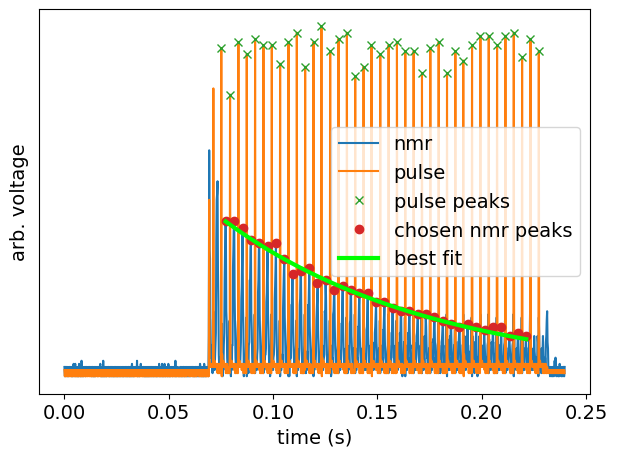

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 37
    # variables        = 2
    chi-square         = 12.1419540
    reduced chi-square = 0.34691297
    Akaike info crit   = -37.2272937
    Bayesian info crit = -34.0054579
[[Variables]]
    pre:  0.04304633 +/- 0.00106078 (2.46%) (init = 0.4)
    tau:  0.10083383 +/- 0.00206412 (2.05%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.955


In [4]:
file = r'CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile1.csv'
carr_purcell_fit_v2(file, plot=1)

In [5]:
def conc_to_visc(T, C):
    # https://pubs.acs.org/doi/10.1021/ie071349z
    '''Viscosity output in centiPoise of water-glycerol mixtures
    T emperature in Celsius
    C oncentration in mass fraction Glycerol'''
    mu_w = 1.79*np.exp((-1230-T)*T / (36100 + 360*T))
    mu_g = 12100*np.exp((-1233+T)*T / (9900 + 70*T))
    a = 0.705 - 0.0017*T
    b = (4.9 + 0.036*T)*(a**2.5)
    alpha = 1 - C + (a*b*C*(1-C)) / (a*C + b*(1-C))
    return (mu_w ** alpha) * (mu_g ** (1-alpha))

In [6]:
print(conc_to_visc(22.7, 1))

1107.2629417754401


# Run 4

## Fitting

Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly100\\NewFile9.csv']
[  71  111  151  191  231  271  311  351  391  431  471  510  550  591
  631  671  711  751  791  831  871  911  951  991 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile1.csv
signal stddev (V): [0.0010873  0.00092856 0.00090676 0.00099107 0.00120922 0.00092856
 0.00099107 0.00099107 0.00099107 0.00092856 0.00092856 0.00090676
 0.00090676]


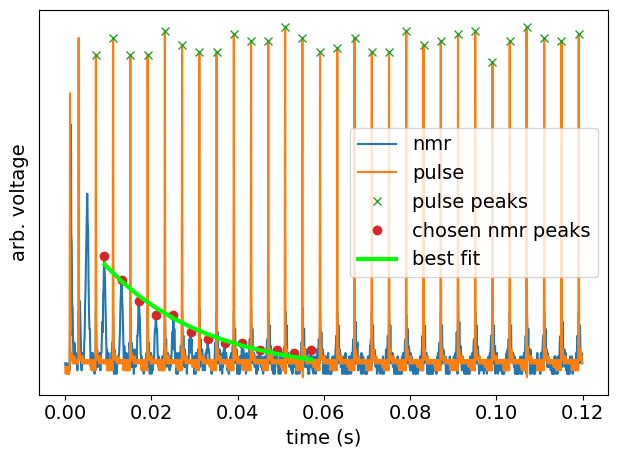

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 13
    # variables        = 2
    chi-square         = 5.03995425
    reduced chi-square = 0.45817766
    Akaike info crit   = -8.31818058
    Bayesian info crit = -7.18828186
[[Variables]]
    pre:  0.01859610 +/- 0.00110755 (5.96%) (init = 0.4)
    tau:  0.02353660 +/- 0.00154468 (6.56%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.876
[  71  111  151  191  231  270  311  351  391  431  471  510  550  591
  630  671  711  751  791  831  871  911  951  991 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile2.csv
signal stddev (V): [0.00087686 0.00094281 0.00163978 0.00131487 0.00117    0.00117
 0.00094281 0.00094281 0.0010435  0.00085375 0.00087686 0.00087686
 0.00085375]


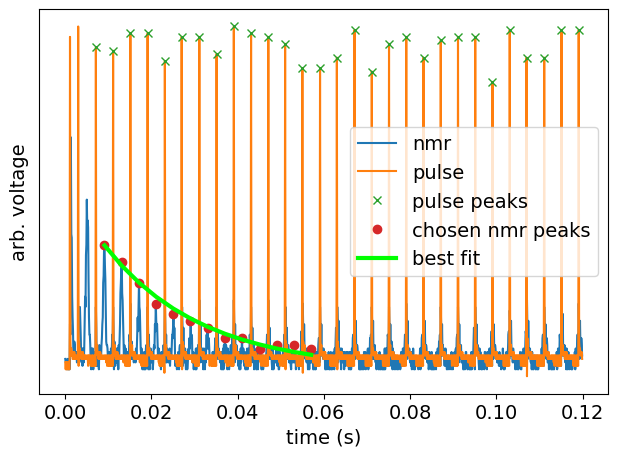

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 13
    # variables        = 2
    chi-square         = 3.23102836
    reduced chi-square = 0.29372985
    Akaike info crit   = -14.0979356
    Bayesian info crit = -12.9680369
[[Variables]]
    pre:  0.02151138 +/- 8.5088e-04 (3.96%) (init = 0.4)
    tau:  0.02236356 +/- 9.8183e-04 (4.39%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.844
[  71  111  151  190  231  271  310  351  391  431  471  511  550  591
  631  671  711  751  791  830  871  911  951  991 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile3.csv
signal stddev (V): [0.00132    0.00117576 0.00088453 0.00117576 0.00104995 0.00088453
 0.00104995 0.00117576 0.00086163 0.00088453 0.00086163 0.00086163
 0.00086163]


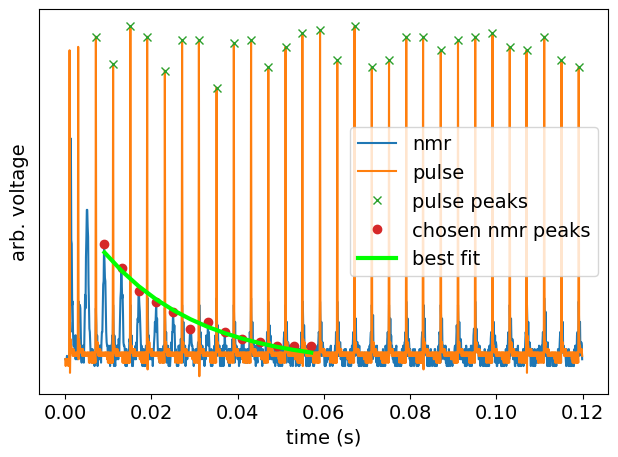

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 13
    # variables        = 2
    chi-square         = 4.42238117
    reduced chi-square = 0.40203465
    Akaike info crit   = -10.0175240
    Bayesian info crit = -8.88762532
[[Variables]]
    pre:  0.02005284 +/- 0.00121273 (6.05%) (init = 0.4)
    tau:  0.02249757 +/- 0.00135485 (6.02%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.883
[  70  111  151  191  230  271  310  351  391  431  471  511  551  591
  631  671  711  751  791  830  871  911  951  991 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile4.csv
signal stddev (V): [0.0006     0.0006     0.00082462 0.00069282 0.00082462 0.00069282
 0.00056569 0.0006     0.0006     0.0006     0.0006     0.00069282
 0.0006    ]


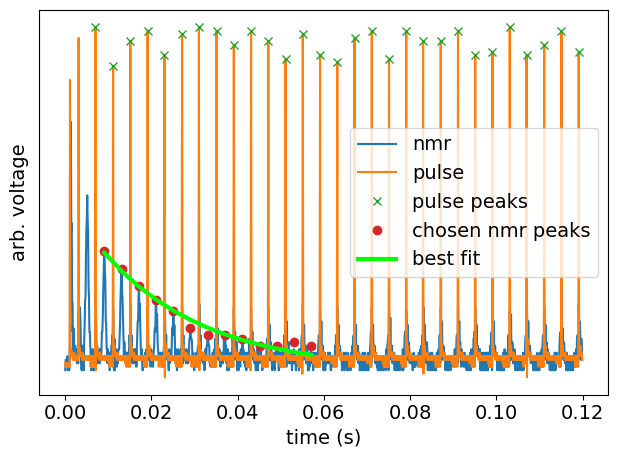

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 13
    # variables        = 2
    chi-square         = 10.6321063
    reduced chi-square = 0.96655512
    Akaike info crit   = 1.38607652
    Bayesian info crit = 2.51597523
[[Variables]]
    pre:  0.01973175 +/- 9.7977e-04 (4.97%) (init = 0.4)
    tau:  0.02360023 +/- 0.00132276 (5.60%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.857
[  71  111  151  190  231  271  310  351  391  430  471  511  550  591
  631  671  711  751  791  831  871  911  951  991 1030 1071 1111 1150
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile5.csv
signal stddev (V): [0.00062097 0.00116    0.00099277 0.00058788 0.00099277 0.00071106
 0.00062097 0.00062097 0.00071106 0.00062097 0.00062097 0.00062097
 0.00058788]


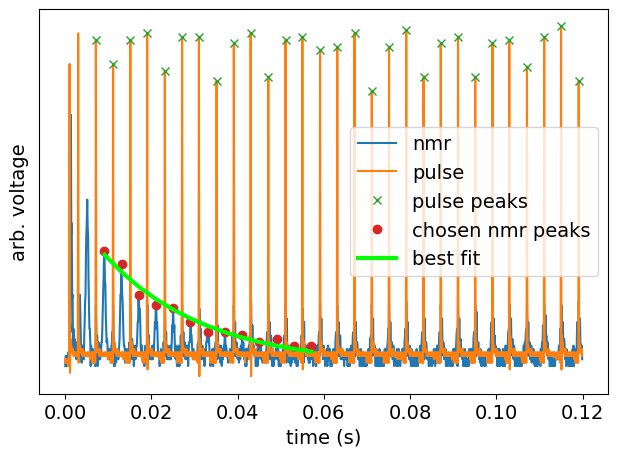

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 13
    # variables        = 2
    chi-square         = 8.88268785
    reduced chi-square = 0.80751708
    Akaike info crit   = -0.95098709
    Bayesian info crit = 0.17891163
[[Variables]]
    pre:  0.01932667 +/- 0.00101315 (5.24%) (init = 0.4)
    tau:  0.02345521 +/- 0.00130621 (5.57%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.854
[  71  111  151  191  230  271  310  351  391  431  471  511  551  591
  630  671  711  750  791  831  870  911  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile6.csv
signal stddev (V): [0.00159248 0.00078486 0.0008579  0.00078486 0.00078486 0.00096747
 0.00078486 0.00096747 0.00078486 0.00078486 0.00078486 0.00075895
 0.00075895]


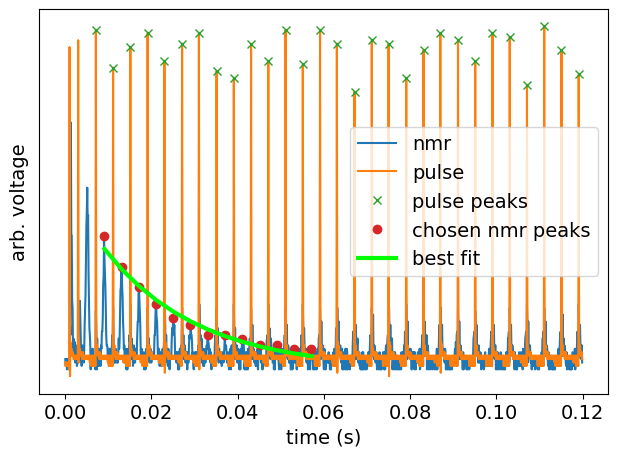

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 13
    # variables        = 2
    chi-square         = 5.93361964
    reduced chi-square = 0.53941997
    Akaike info crit   = -6.19609416
    Bayesian info crit = -5.06619545
[[Variables]]
    pre:  0.02134159 +/- 0.00131649 (6.17%) (init = 0.4)
    tau:  0.02173822 +/- 0.00130949 (6.02%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.899
[  71  111  151  191  231  270  311  351  390  431  471  510  551  591
  630  671  711  750  791  830  871  911  951  990 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile7.csv
signal stddev (V): [0.00076837 0.00076837 0.00093295 0.00062482 0.00110923 0.00076837
 0.00076837 0.00076837 0.00052    0.00052    0.00048    0.00048
 0.00048   ]


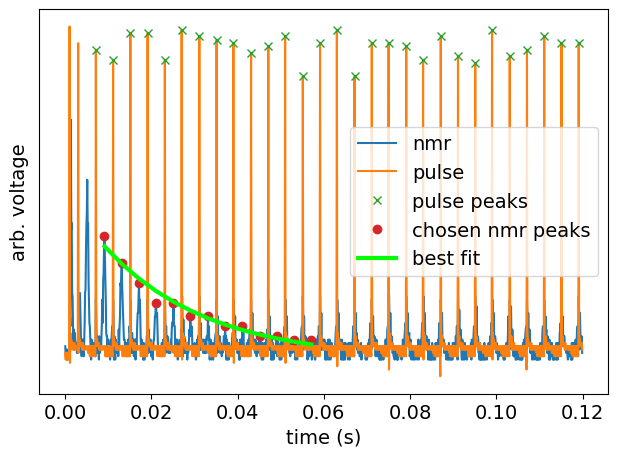

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 13
    # variables        = 2
    chi-square         = 11.8340271
    reduced chi-square = 1.07582064
    Akaike info crit   = 2.77838579
    Bayesian info crit = 3.90828450
[[Variables]]
    pre:  0.01992602 +/- 0.00117747 (5.91%) (init = 0.4)
    tau:  0.02382571 +/- 0.00139781 (5.87%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.853
[  71  111  151  191  231  270  311  351  391  431  471  510  551  591
  630  671  711  750  791  831  871  911  951  990 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile8.csv
signal stddev (V): [0.0010435  0.0010435  0.00087686 0.00094281 0.00147271 0.00094281
 0.00094281 0.0010435  0.00094281 0.00087686 0.00087686 0.00085375
 0.00087686]


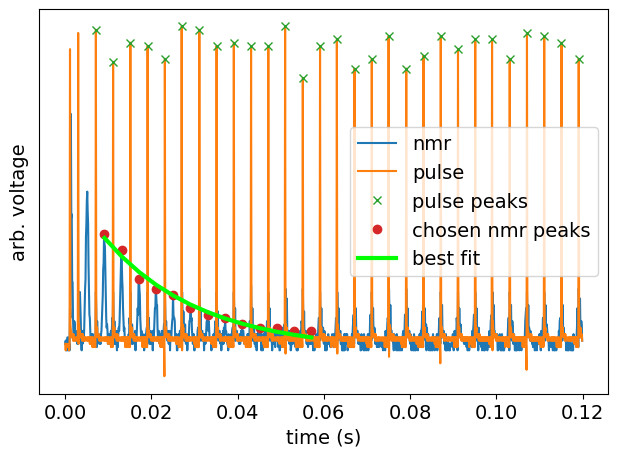

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 23
    # data points      = 13
    # variables        = 2
    chi-square         = 3.96227438
    reduced chi-square = 0.36020676
    Akaike info crit   = -11.4457051
    Bayesian info crit = -10.3158064
[[Variables]]
    pre:  0.02091607 +/- 0.00102815 (4.92%) (init = 0.4)
    tau:  0.02219314 +/- 0.00115490 (5.20%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.873
[  71  111  151  191  230  271  310  351  391  431  471  511  550  591
  631  671  711  751  791  831  871  910  951  991 1031 1071 1111 1150
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly100\NewFile9.csv
signal stddev (V): [0.00067987 0.00120922 0.00070868 0.00070868 0.00078881 0.00078881
 0.00067987 0.00078881 0.00070868 0.00067987 0.00067987 0.00070868
 0.00070868]


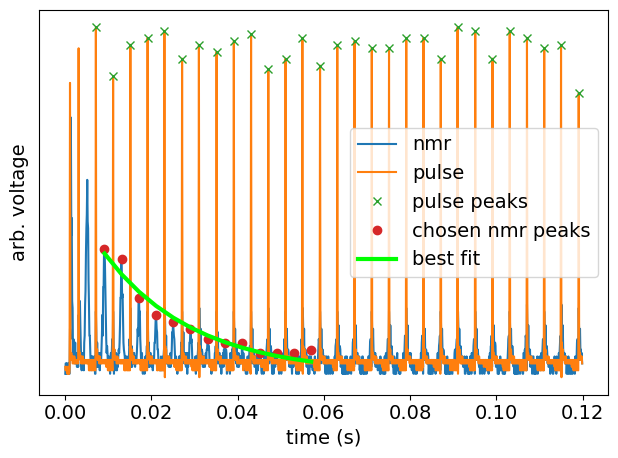

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 25
    # data points      = 13
    # variables        = 2
    chi-square         = 12.3156008
    reduced chi-square = 1.11960007
    Akaike info crit   = 3.29692694
    Bayesian info crit = 4.42682566
[[Variables]]
    pre:  0.02147503 +/- 0.00142250 (6.62%) (init = 0.4)
    tau:  0.02090428 +/- 0.00143509 (6.87%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.868
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly20\\NewFile9.

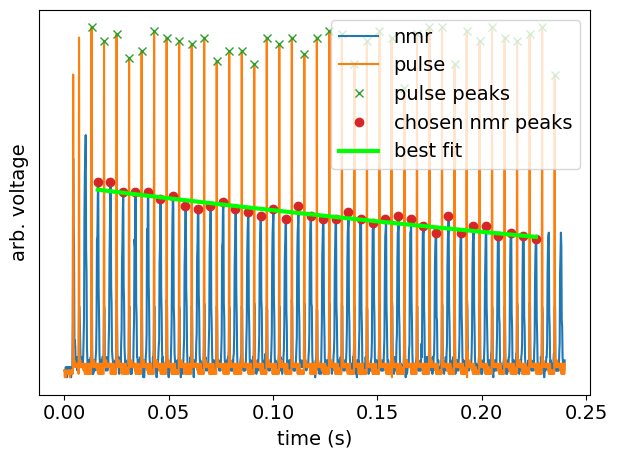

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 10.9310095
    reduced chi-square = 0.32150028
    Akaike info crit   = -38.9089500
    Bayesian info crit = -35.7419121
[[Variables]]
    pre:  0.02280949 +/- 2.3303e-04 (1.02%) (init = 0.4)
    tau:  0.72361846 +/- 0.04198177 (5.80%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.873
[  65   95  125  155  185  215  245  275  304  335  365  395  425  455
  485  515  545  575  604  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1114 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly20\NewFile2.csv
signal stddev (V): [0.00102926 0.00067777 0.00154252 0.00088282 0.00136359 0.00172609
 0.00119138 0.00076117 0.00102926 0.00102926 0.00076117 0.00119138
 0.00088282 0.00088282 0.00067777 0.00067777 0.00076117 0.00102926
 0.00064759

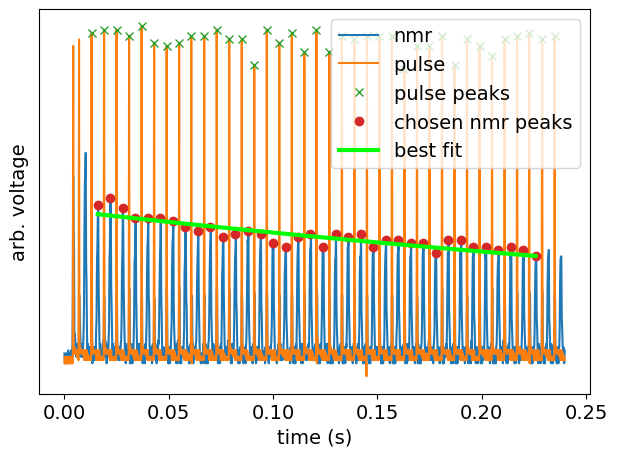

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 36
    # variables        = 2
    chi-square         = 36.9840900
    reduced chi-square = 1.08776735
    Akaike info crit   = 4.97087974
    Bayesian info crit = 8.13791762
[[Variables]]
    pre:  0.01888470 +/- 3.9537e-04 (2.09%) (init = 0.4)
    tau:  0.63808750 +/- 0.06514022 (10.21%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.884
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly20\NewFile3.csv
signal stddev (V): [0.00096825 0.00096825 0.00123996 0.00102835 0.00094736 0.00152889
 0.00094736 0.00096825 0.00112138 0.00102835 0.00094736 0.00112138
 0.00096825 0.00112138 0.00102835 0.00112138 0.00112138 0.00096825
 0.00112138 

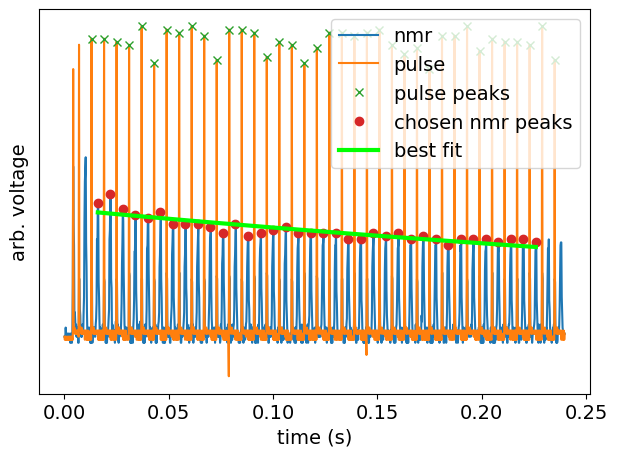

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 36
    # variables        = 2
    chi-square         = 20.3118848
    reduced chi-square = 0.59740838
    Akaike info crit   = -16.6032596
    Bayesian info crit = -13.4362218
[[Variables]]
    pre:  0.01755455 +/- 3.2143e-04 (1.83%) (init = 0.4)
    tau:  0.68130223 +/- 0.06693766 (9.82%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.870
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  784  815  845  875
  905  935  964  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly20\NewFile4.csv
signal stddev (V): [0.00083666 0.00094868 0.00108628 0.00073485 0.00073485 0.00076158
 0.00108628 0.00073485 0.00094868 0.00083666 0.00108628 0.00108628
 0.00124097 0.00076158 0.00073485 0.00094868 0.00073485 0.00094868
 0.00094868

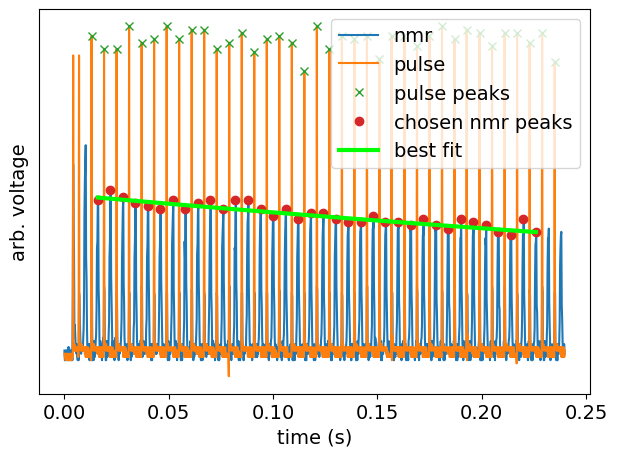

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 14.4110542
    reduced chi-square = 0.42385453
    Akaike info crit   = -28.9588415
    Bayesian info crit = -25.7918036
[[Variables]]
    pre:  0.02064743 +/- 2.2215e-04 (1.08%) (init = 0.4)
    tau:  0.88016245 +/- 0.06589570 (7.49%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.874
[  65   95  125  155  185  215  245  275  304  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  784  815  845  875
  905  935  965  995 1025 1055 1085 1114 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly20\NewFile5.csv
signal stddev (V): [0.00081815 0.00081815 0.0013962  0.0009324  0.00081815 0.0013962
 0.0009324  0.00107209 0.0007412  0.0007412  0.0007412  0.00071371
 0.00107209 0.00175196 0.0009324  0.0007412  0.00107209 0.00122857
 0.00107209 

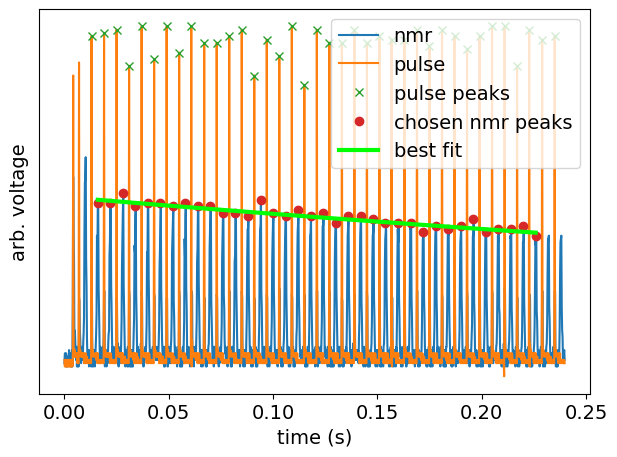

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 8.61327609
    reduced chi-square = 0.25333165
    Akaike info crit   = -47.4877110
    Bayesian info crit = -44.3206731
[[Variables]]
    pre:  0.02073799 +/- 1.7635e-04 (0.85%) (init = 0.4)
    tau:  0.95522234 +/- 0.05855724 (6.13%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.882
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  605  634  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly20\NewFile6.csv
signal stddev (V): [0.00074791 0.00074791 0.00135624 0.00063196 0.00135624 0.00087142
 0.00066285 0.00118295 0.00074791 0.00066285 0.00066285 0.00118295
 0.00118295 0.0010195  0.00118295 0.00074791 0.0010195  0.00118295
 0.00118295

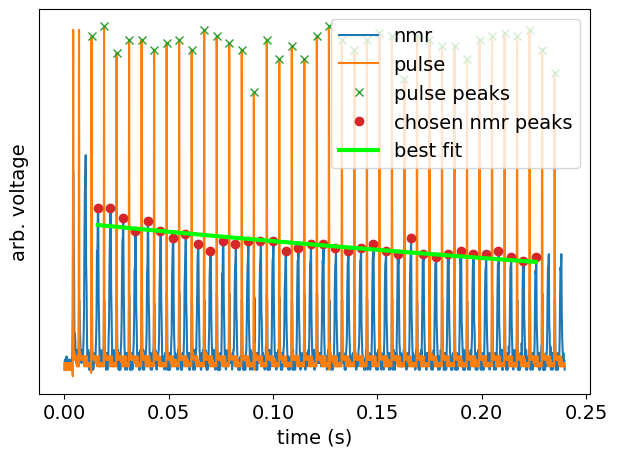

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 36
    # variables        = 2
    chi-square         = 39.0058313
    reduced chi-square = 1.14723033
    Akaike info crit   = 6.88691977
    Bayesian info crit = 10.0539576
[[Variables]]
    pre:  0.01793299 +/- 3.5285e-04 (1.97%) (init = 0.4)
    tau:  0.71221773 +/- 0.07826216 (10.99%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.864
[  65   95  125  155  185  215  245  275  304  335  365  395  425  455
  484  515  545  575  604  635  665  695  725  755  784  815  845  875
  905  935  964  995 1025 1055 1085 1115 1144 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly20\NewFile7.csv
signal stddev (V): [0.00112222 0.00096921 0.00169097 0.00096921 0.00102926 0.00169097
 0.00102926 0.00094835 0.00102926 0.00169097 0.00094835 0.00169097
 0.00169097 0.00102926 0.00102926 0.00096921 0.00102926 0.00102926
 0.00112222 

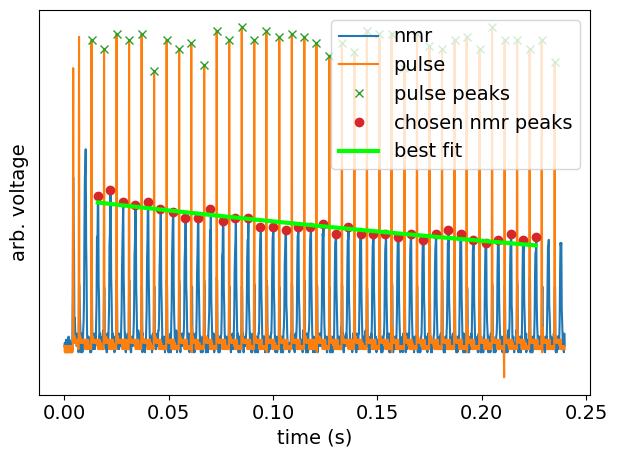

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 14.1070824
    reduced chi-square = 0.41491419
    Akaike info crit   = -29.7263108
    Bayesian info crit = -26.5592729
[[Variables]]
    pre:  0.01968669 +/- 2.9134e-04 (1.48%) (init = 0.4)
    tau:  0.62232842 +/- 0.04502805 (7.24%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.875
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1114 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly20\NewFile8.csv
signal stddev (V): [0.00083516 0.00073314 0.00175997 0.00075993 0.00083516 0.00094736
 0.00108513 0.00094736 0.00108513 0.00075993 0.00075993 0.00083516
 0.00073314 0.00075993 0.00158035 0.00123996 0.00108513 0.00083516
 0.00108513

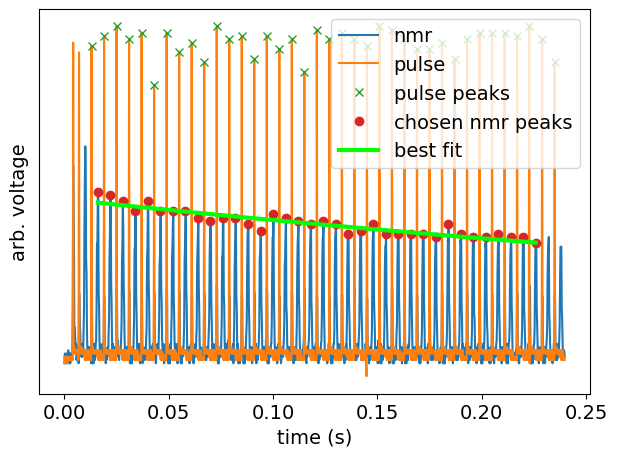

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 36
    # variables        = 2
    chi-square         = 19.3024178
    reduced chi-square = 0.56771817
    Akaike info crit   = -18.4383887
    Bayesian info crit = -15.2713508
[[Variables]]
    pre:  0.02028008 +/- 2.6190e-04 (1.29%) (init = 0.4)
    tau:  0.73273768 +/- 0.05309561 (7.25%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.875
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  784  815  845  875
  905  935  965  995 1025 1055 1085 1114 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly20\NewFile9.csv
signal stddev (V): [0.00091515 0.00121552 0.00135554 0.0010943  0.00150914 0.0010943
 0.0010943  0.00099875 0.00121552 0.00091515 0.00099875 0.00184323
 0.0010943  0.00093675 0.0010943  0.00093675 0.00167257 0.00121552
 0.00135554 

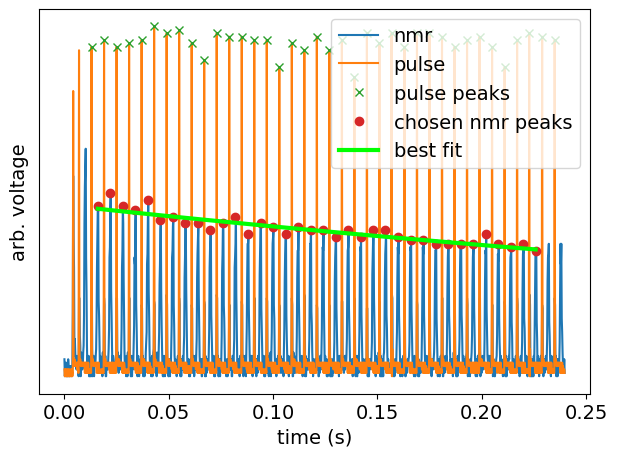

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 36
    # variables        = 2
    chi-square         = 11.7238245
    reduced chi-square = 0.34481837
    Akaike info crit   = -36.3882519
    Bayesian info crit = -33.2212141
[[Variables]]
    pre:  0.02015048 +/- 2.5679e-04 (1.27%) (init = 0.4)
    tau:  0.75453327 +/- 0.05522074 (7.32%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.876
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly40\\NewFile

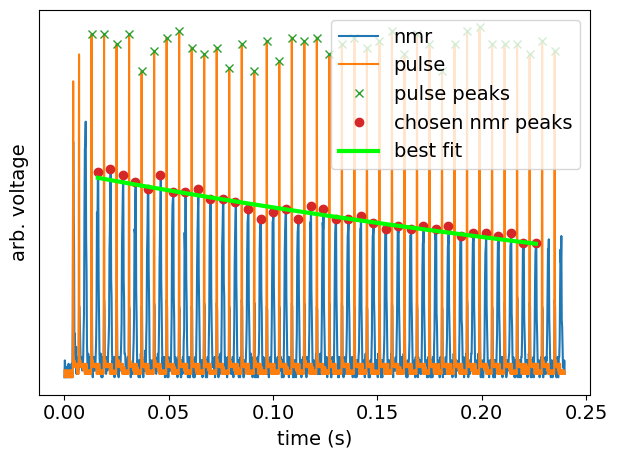

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 14.4396695
    reduced chi-square = 0.42469616
    Akaike info crit   = -28.8874289
    Bayesian info crit = -25.7203910
[[Variables]]
    pre:  0.02445842 +/- 2.6146e-04 (1.07%) (init = 0.4)
    tau:  0.52308994 +/- 0.02307010 (4.41%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.875
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly40\NewFile2.csv
signal stddev (V): [0.00102683 0.00115515 0.00115515 0.00102683 0.00102683 0.00146095
 0.00102683 0.00102683 0.00162923 0.00085696 0.00102683 0.00115515
 0.00115515 0.00085696 0.00115515 0.00085696 0.00092432 0.00102683
 0.00115515

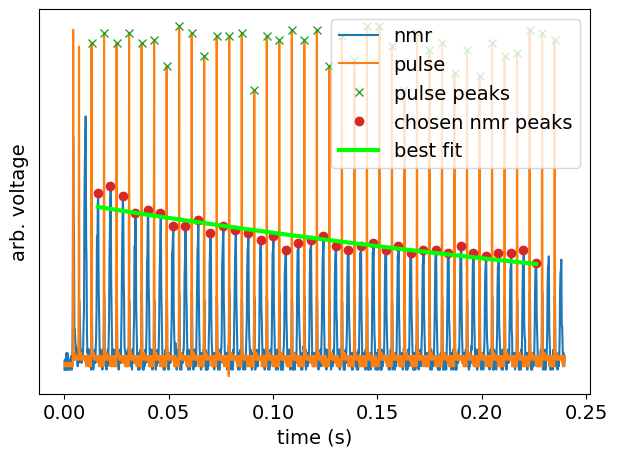

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 36
    # variables        = 2
    chi-square         = 28.6627497
    reduced chi-square = 0.84302205
    Akaike info crit   = -4.20514086
    Bayesian info crit = -1.03810299
[[Variables]]
    pre:  0.02018815 +/- 4.1074e-04 (2.03%) (init = 0.4)
    tau:  0.48593467 +/- 0.03784366 (7.79%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.881
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly40\NewFile3.csv
signal stddev (V): [0.00109545 0.00084853 0.00109545 0.00074833 0.00074833 0.00084853
 0.00095917 0.0007746  0.00141421 0.001249   0.00109545 0.00158745
 0.001249   0.001249   0.001249   0.00109545 0.00095917 0.00084853
 0.0007746 

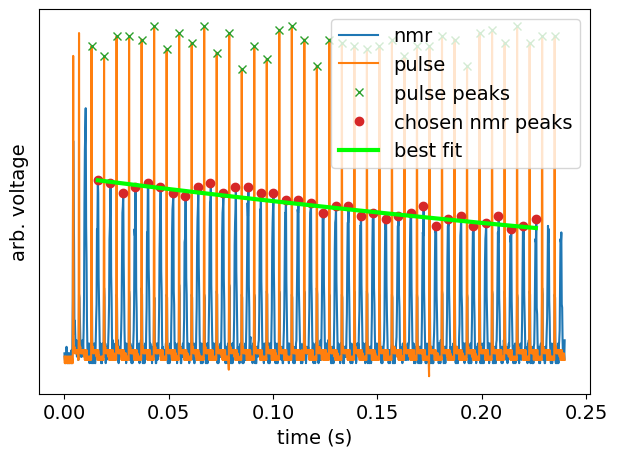

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 14.0334022
    reduced chi-square = 0.41274712
    Akaike info crit   = -29.9148289
    Bayesian info crit = -26.7477911
[[Variables]]
    pre:  0.02290382 +/- 2.4155e-04 (1.05%) (init = 0.4)
    tau:  0.69377659 +/- 0.03996232 (5.76%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.865
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  604  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1084 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly40\NewFile4.csv
signal stddev (V): [0.00090416 0.00088176 0.00200437 0.00096825 0.00133323 0.00119059
 0.00096825 0.00148913 0.00165454 0.00090416 0.00096825 0.00200437
 0.00133323 0.00165454 0.00148913 0.00119059 0.00119059 0.00096825
 0.00106654

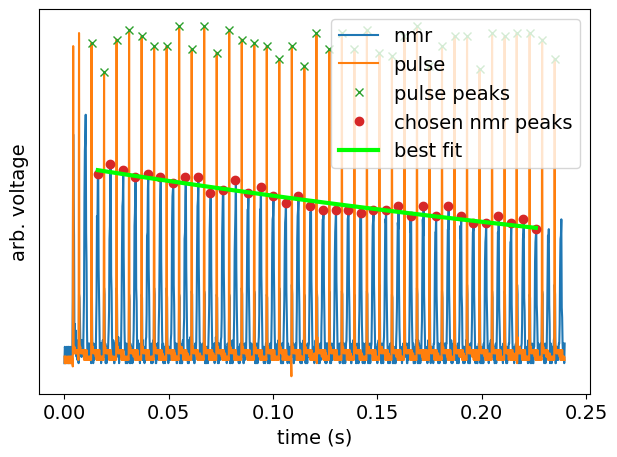

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 10.0688814
    reduced chi-square = 0.29614357
    Akaike info crit   = -41.8664955
    Bayesian info crit = -38.6994576
[[Variables]]
    pre:  0.02426651 +/- 2.4570e-04 (1.01%) (init = 0.4)
    tau:  0.59125950 +/- 0.02862264 (4.84%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.862
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly40\NewFile5.csv
signal stddev (V): [0.00096663 0.00177042 0.00159197 0.00075788 0.00078382 0.00141929
 0.00075788 0.00078382 0.00177042 0.00075788 0.00096663 0.00085696
 0.00110199 0.00125474 0.00125474 0.00085696 0.00085696 0.00096663
 0.00110199

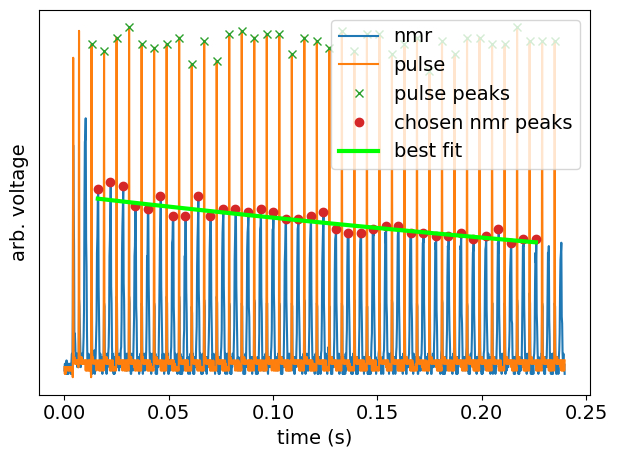

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 47
    # data points      = 36
    # variables        = 2
    chi-square         = 18.7593903
    reduced chi-square = 0.55174677
    Akaike info crit   = -19.4656818
    Bayesian info crit = -16.2986439
[[Variables]]
    pre:  0.02130181 +/- 2.9114e-04 (1.37%) (init = 0.4)
    tau:  0.73245903 +/- 0.05708229 (7.79%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.886
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly40\NewFile6.csv
signal stddev (V): [0.00090416 0.00148913 0.00148913 0.00096825 0.00096825 0.00237013
 0.00148913 0.00133323 0.00165454 0.00148913 0.00096825 0.00182688
 0.00133323 0.00096825 0.00106654 0.00106654 0.00106654 0.00106654
 0.00088176

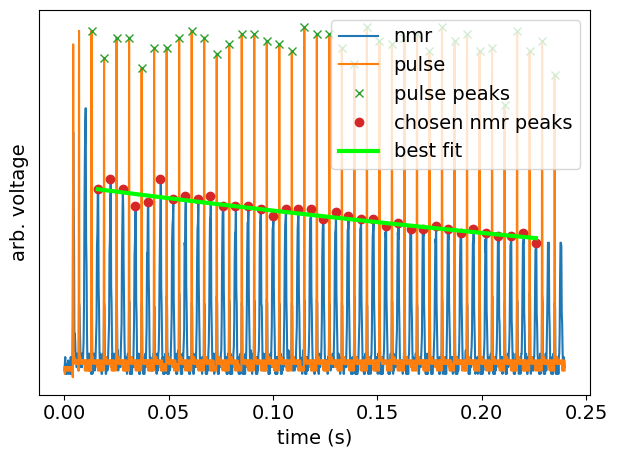

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 36
    # variables        = 2
    chi-square         = 8.16456709
    reduced chi-square = 0.24013433
    Akaike info crit   = -49.4137484
    Bayesian info crit = -46.2467105
[[Variables]]
    pre:  0.02248506 +/- 2.2898e-04 (1.02%) (init = 0.4)
    tau:  0.68236205 +/- 0.03490942 (5.12%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.886
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly40\NewFile7.csv
signal stddev (V): [0.0010195  0.00084816 0.00162462 0.00091617 0.00084816 0.00179983
 0.0010195  0.00091617 0.00129591 0.0010195  0.0010195  0.00145581
 0.00145581 0.00091617 0.00114864 0.00084816 0.00114864 0.00091617
 0.00091617

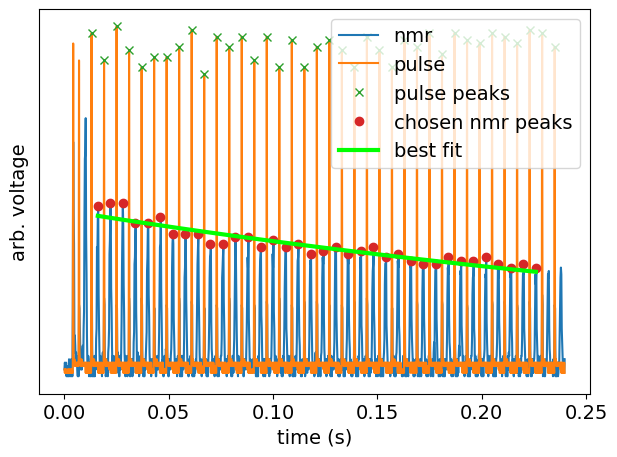

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 36
    # variables        = 2
    chi-square         = 17.7267468
    reduced chi-square = 0.52137490
    Akaike info crit   = -21.5039956
    Bayesian info crit = -18.3369578
[[Variables]]
    pre:  0.01952269 +/- 3.0820e-04 (1.58%) (init = 0.4)
    tau:  0.48936403 +/- 0.02990640 (6.11%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.871
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  604  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1084 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly40\NewFile8.csv
signal stddev (V): [0.00105327 0.0012607  0.0013962  0.00114428 0.00154576 0.00154576
 0.0012607  0.00105327 0.00170569 0.00154576 0.00099467 0.00099467
 0.0013962  0.00099467 0.00154576 0.0013962  0.0012607  0.00114428
 0.00099467

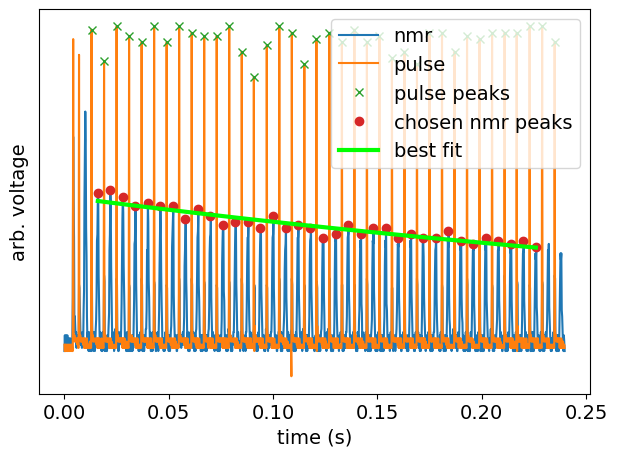

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 36
    # variables        = 2
    chi-square         = 12.5420735
    reduced chi-square = 0.36888451
    Akaike info crit   = -33.9594825
    Bayesian info crit = -30.7924446
[[Variables]]
    pre:  0.01959514 +/- 3.0255e-04 (1.54%) (init = 0.4)
    tau:  0.56485421 +/- 0.03768718 (6.67%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.879
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly40\NewFile9.csv
signal stddev (V): [0.0009871  0.00080893 0.00080893 0.0009871  0.0009871  0.00160449
 0.00080893 0.00111999 0.00087999 0.00080893 0.00080893 0.00087999
 0.00127058 0.00080893 0.00111999 0.00160449 0.00080893 0.00087999
 0.00078382

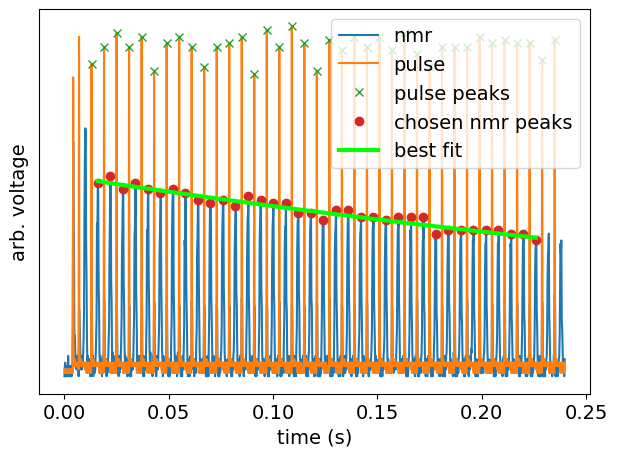

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 9.99931729
    reduced chi-square = 0.29409757
    Akaike info crit   = -42.1160763
    Bayesian info crit = -38.9490384
[[Variables]]
    pre:  0.02358351 +/- 2.0395e-04 (0.86%) (init = 0.4)
    tau:  0.61469168 +/- 0.02636472 (4.29%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.864
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly50\\NewFile

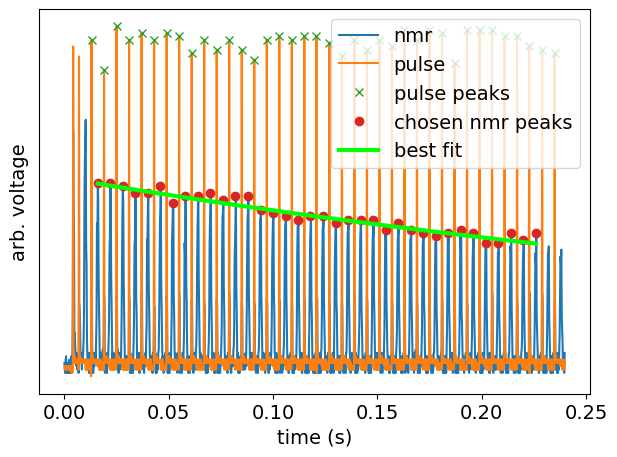

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 11.1658534
    reduced chi-square = 0.32840745
    Akaike info crit   = -38.1437102
    Bayesian info crit = -34.9766723
[[Variables]]
    pre:  0.02340232 +/- 2.4656e-04 (1.05%) (init = 0.4)
    tau:  0.55141260 +/- 0.02492968 (4.52%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.887
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  604  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly50\NewFile2.csv
signal stddev (V): [0.0009107  0.00081815 0.00101458 0.00084224 0.00084224 0.00145237
 0.00145237 0.00081815 0.00114428 0.00084224 0.0009107  0.00145237
 0.00129204 0.0009107  0.00084224 0.00114428 0.0009107  0.0009107
 0.0009107  

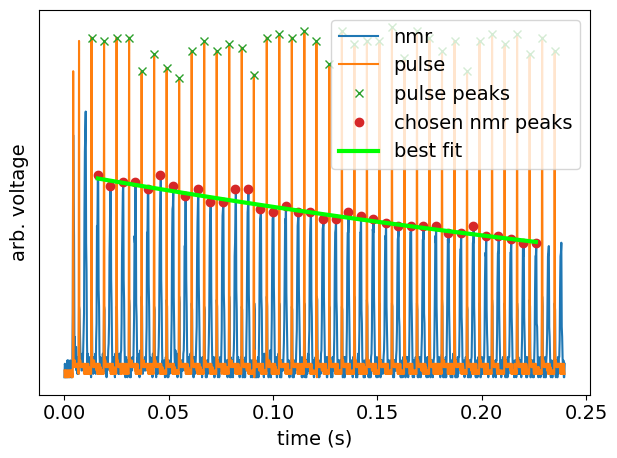

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 9.32316682
    reduced chi-square = 0.27421079
    Akaike info crit   = -44.6365969
    Bayesian info crit = -41.4695590
[[Variables]]
    pre:  0.02434349 +/- 2.0805e-04 (0.85%) (init = 0.4)
    tau:  0.54595524 +/- 0.02174176 (3.98%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.854
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly50\NewFile3.csv
signal stddev (V): [0.0008231  0.00071937 0.0008231  0.00093675 0.00074666 0.00175428
 0.0008231  0.00074666 0.00139911 0.00107587 0.00107587 0.00139911
 0.00107587 0.00107587 0.00107587 0.00107587 0.00093675 0.00093675
 0.00093675

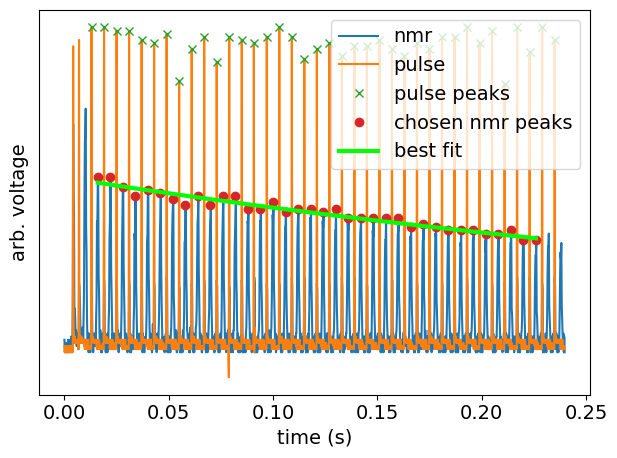

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 36
    # variables        = 2
    chi-square         = 11.4559085
    reduced chi-square = 0.33693848
    Akaike info crit   = -37.2204794
    Bayesian info crit = -34.0534416
[[Variables]]
    pre:  0.02237866 +/- 2.1136e-04 (0.94%) (init = 0.4)
    tau:  0.52954757 +/- 0.02164828 (4.09%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.845
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  604  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly50\NewFile4.csv
signal stddev (V): [0.00092972 0.00081509 0.00175054 0.00092972 0.00081509 0.00193504
 0.00106975 0.00081509 0.00139441 0.00073782 0.00073782 0.00106975
 0.00081509 0.00106975 0.00081509 0.00106975 0.00092972 0.00071019
 0.00073782

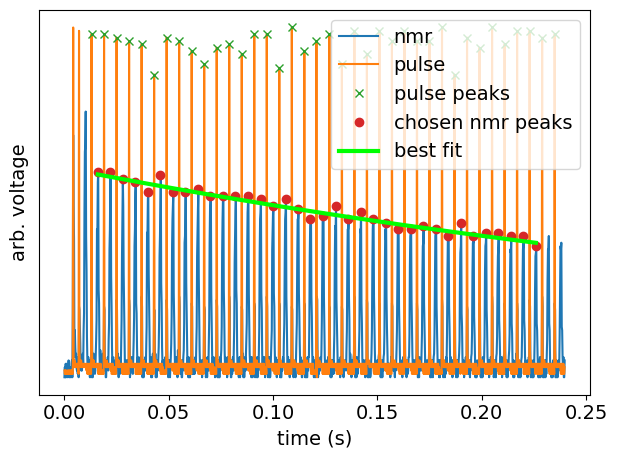

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 11.7171841
    reduced chi-square = 0.34462306
    Akaike info crit   = -36.4086480
    Bayesian info crit = -33.2416101
[[Variables]]
    pre:  0.02488763 +/- 2.3161e-04 (0.93%) (init = 0.4)
    tau:  0.51087859 +/- 0.01927912 (3.77%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.879
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly50\NewFile5.csv
signal stddev (V): [0.00096825 0.00148913 0.00182688 0.00090416 0.00090416 0.00182688
 0.00096825 0.00096825 0.00096825 0.00133323 0.00088176 0.00119059
 0.00148913 0.00133323 0.00119059 0.00119059 0.00096825 0.00106654
 0.00096825

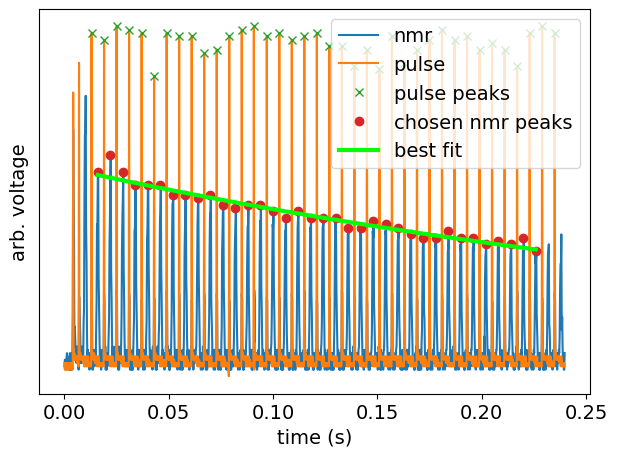

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 9.70417540
    reduced chi-square = 0.28541692
    Akaike info crit   = -43.1946569
    Bayesian info crit = -40.0276190
[[Variables]]
    pre:  0.02447744 +/- 2.4777e-04 (1.01%) (init = 0.4)
    tau:  0.43553289 +/- 0.01532151 (3.52%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.872
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  754  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly50\NewFile6.csv
signal stddev (V): [0.00101458 0.0009324  0.00110877 0.00095361 0.00122857 0.00168207
 0.0009324  0.00095361 0.0009324  0.00136725 0.00122857 0.00151966
 0.00136725 0.0009324  0.00168207 0.00101458 0.00110877 0.00110877
 0.00101458

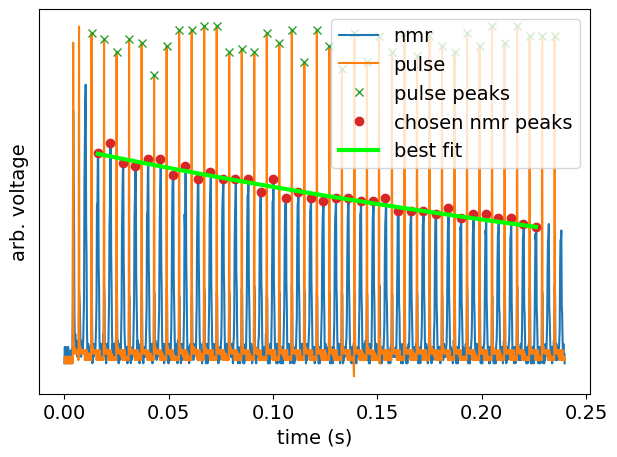

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 11.6017915
    reduced chi-square = 0.34122916
    Akaike info crit   = -36.7649388
    Bayesian info crit = -33.5979009
[[Variables]]
    pre:  0.02673448 +/- 2.6321e-04 (0.98%) (init = 0.4)
    tau:  0.48921543 +/- 0.01993392 (4.07%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.855
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  754  785  815  845  875
  905  935  965  995 1025 1055 1084 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly50\NewFile7.csv
signal stddev (V): [0.00098869 0.00098869 0.00125599 0.00098869 0.00096825 0.00222205
 0.00104762 0.00104762 0.00125599 0.00139194 0.00098869 0.00125599
 0.00125599 0.00113908 0.00113908 0.00139194 0.00096825 0.00125599
 0.00113908

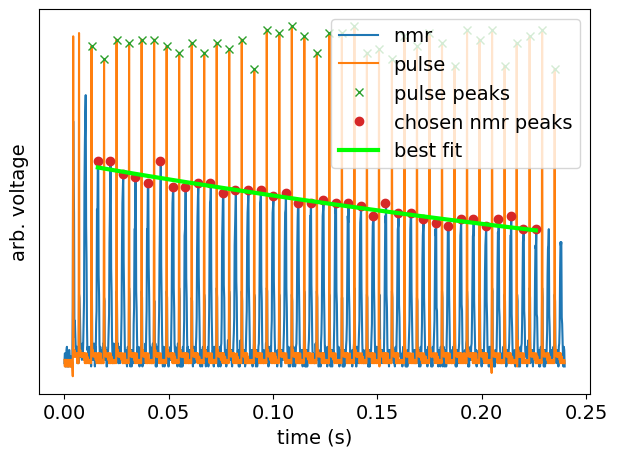

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 10.0231778
    reduced chi-square = 0.29479935
    Akaike info crit   = -42.0302749
    Bayesian info crit = -38.8632371
[[Variables]]
    pre:  0.02506373 +/- 2.4795e-04 (0.99%) (init = 0.4)
    tau:  0.55257587 +/- 0.02492669 (4.51%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.862
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  784  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly50\NewFile8.csv
signal stddev (V): [0.0010198  0.00095917 0.00152315 0.00095917 0.00111355 0.00137113
 0.00095917 0.00111355 0.00123288 0.00123288 0.0010198  0.00168523
 0.00095917 0.00137113 0.00123288 0.00123288 0.00123288 0.00095917
 0.00111355

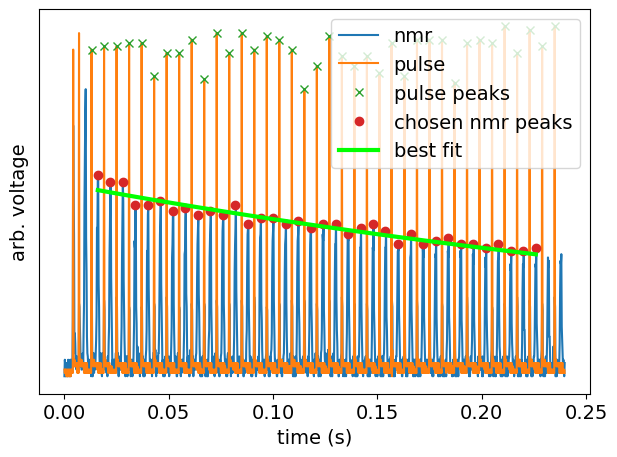

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 14.8273721
    reduced chi-square = 0.43609918
    Akaike info crit   = -27.9335840
    Bayesian info crit = -24.7665461
[[Variables]]
    pre:  0.02330272 +/- 3.0671e-04 (1.32%) (init = 0.4)
    tau:  0.49629686 +/- 0.02734188 (5.51%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.854
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  754  785  815  845  875
  905  935  965  995 1025 1055 1084 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly50\NewFile9.csv
signal stddev (V): [0.00162404 0.00091515 0.00129518 0.00084705 0.0008231  0.00162404
 0.00114782 0.00101858 0.00145516 0.00091515 0.00101858 0.00145516
 0.00101858 0.00114782 0.00145516 0.00114782 0.00084705 0.00091515
 0.00114782

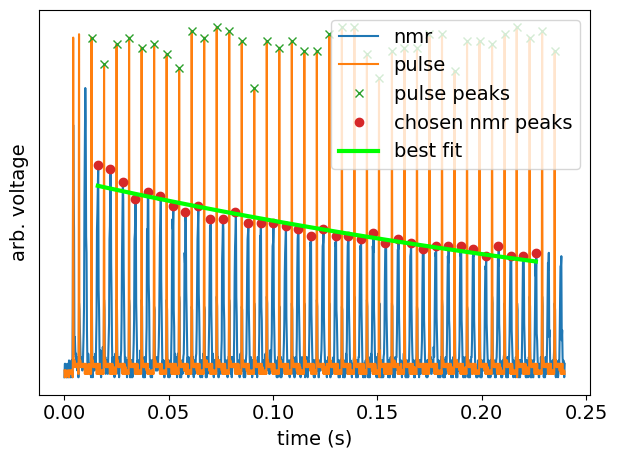

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 44
    # data points      = 36
    # variables        = 2
    chi-square         = 21.5740650
    reduced chi-square = 0.63453132
    Akaike info crit   = -14.4329734
    Bayesian info crit = -11.2659356
[[Variables]]
    pre:  0.02365974 +/- 3.6028e-04 (1.52%) (init = 0.4)
    tau:  0.41735373 +/- 0.02099262 (5.03%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.872
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly60\\NewFile

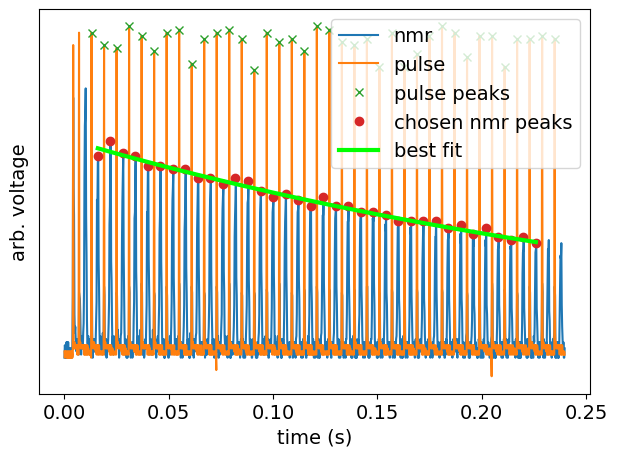

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 8.90753446
    reduced chi-square = 0.26198631
    Akaike info crit   = -46.2783723
    Bayesian info crit = -43.1113344
[[Variables]]
    pre:  0.02831301 +/- 2.2334e-04 (0.79%) (init = 0.4)
    tau:  0.35343525 +/- 0.00833360 (2.36%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.851
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly60\NewFile2.csv
signal stddev (V): [0.00089303 0.00089303 0.00127965 0.0008231  0.00113027 0.00099875
 0.0008231  0.0008231  0.00127965 0.00127965 0.0008231  0.00099875
 0.00099875 0.00099875 0.00113027 0.00127965 0.00113027 0.0008231
 0.00099875 

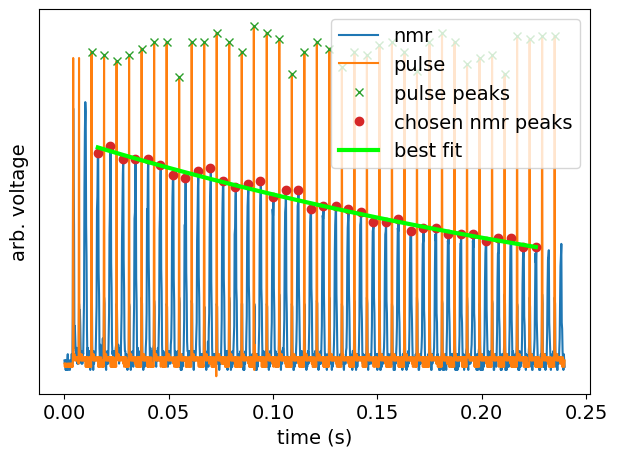

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 12.4633070
    reduced chi-square = 0.36656785
    Akaike info crit   = -34.1862817
    Bayesian info crit = -31.0192439
[[Variables]]
    pre:  0.02955505 +/- 2.5253e-04 (0.85%) (init = 0.4)
    tau:  0.35377845 +/- 0.00897823 (2.54%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.852
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1084 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly60\NewFile3.csv
signal stddev (V): [0.00093808 0.00084853 0.00146969 0.00087178 0.00087178 0.00093808
 0.00181108 0.00093808 0.00103923 0.00103923 0.00131149 0.00116619
 0.00093808 0.00103923 0.00146969 0.00146969 0.00093808 0.00131149
 0.00116619

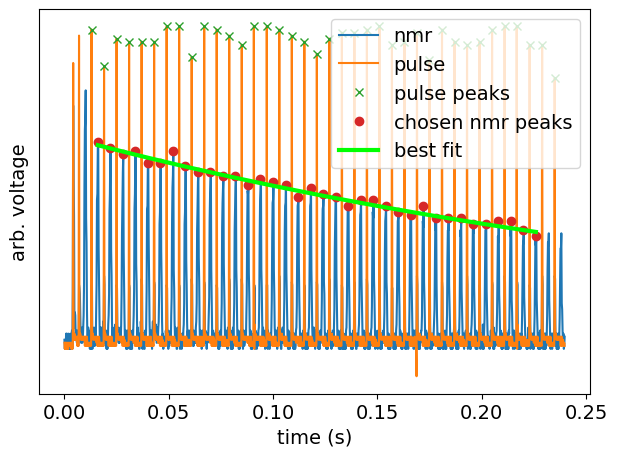

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 8.37607899
    reduced chi-square = 0.24635526
    Akaike info crit   = -48.4930052
    Bayesian info crit = -45.3259673
[[Variables]]
    pre:  0.02794337 +/- 2.1471e-04 (0.77%) (init = 0.4)
    tau:  0.37852755 +/- 0.00932168 (2.46%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.847
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1054 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly60\NewFile4.csv
signal stddev (V): [0.00099875 0.00089303 0.00127965 0.00113027 0.00089303 0.00161168
 0.00113027 0.00113027 0.00099875 0.00144135 0.0008231  0.00144135
 0.00113027 0.00144135 0.00144135 0.00161168 0.00089303 0.00099875
 0.0008231 

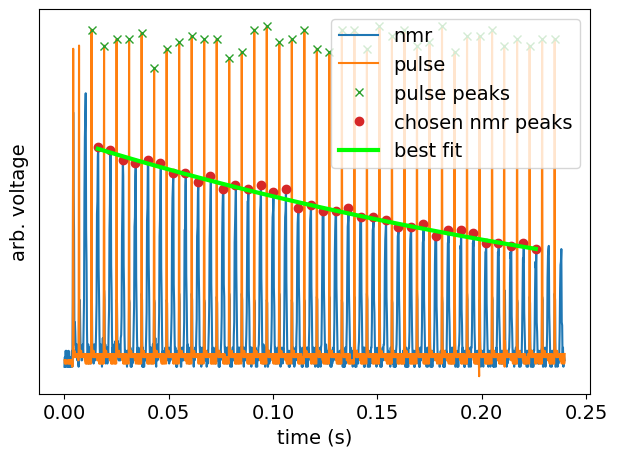

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 6.80435699
    reduced chi-square = 0.20012815
    Akaike info crit   = -55.9744087
    Bayesian info crit = -52.8073708
[[Variables]]
    pre:  0.02873281 +/- 2.1049e-04 (0.73%) (init = 0.4)
    tau:  0.34133157 +/- 0.00716572 (2.10%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.860
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  904  935  965  995 1025 1055 1084 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly60\NewFile5.csv
signal stddev (V): [0.00104762 0.00131814 0.00131814 0.00094736 0.00094736 0.0018159
 0.00094736 0.00104762 0.00094736 0.00117367 0.00117367 0.00104762
 0.00085878 0.00104762 0.00085878 0.00117367 0.00094736 0.00117367
 0.00088176 

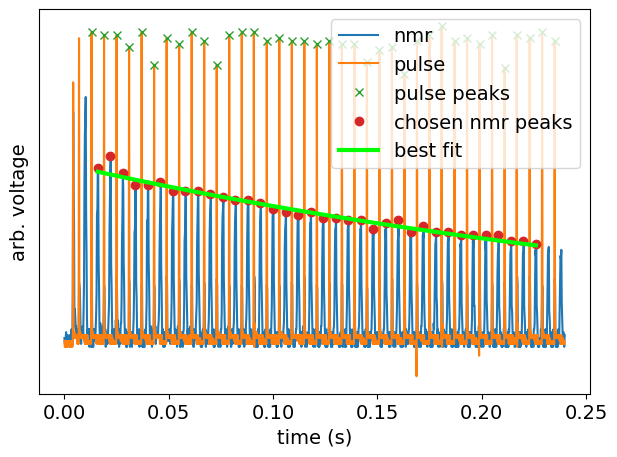

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 36
    # variables        = 2
    chi-square         = 9.35787130
    reduced chi-square = 0.27523151
    Akaike info crit   = -44.5028396
    Bayesian info crit = -41.3358017
[[Variables]]
    pre:  0.02484038 +/- 2.4668e-04 (0.99%) (init = 0.4)
    tau:  0.38489596 +/- 0.01224956 (3.18%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.871
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly60\NewFile6.csv
signal stddev (V): [0.00074666 0.00141333 0.00213483 0.00077298 0.00077298 0.001248
 0.00158666 0.00084705 0.00095786 0.00084705 0.0010943  0.00084705
 0.00095786 0.0010943  0.001248   0.00084705 0.00084705 0.0010943
 0.00077298 0.

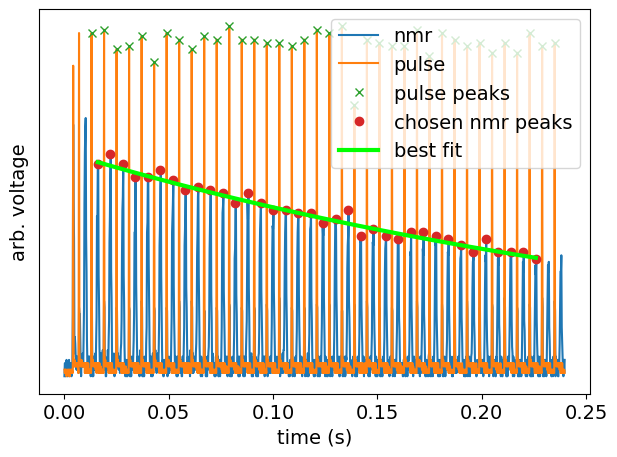

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 13.0261298
    reduced chi-square = 0.38312146
    Akaike info crit   = -32.5962181
    Bayesian info crit = -29.4291802
[[Variables]]
    pre:  0.02740786 +/- 2.6057e-04 (0.95%) (init = 0.4)
    tau:  0.35462214 +/- 0.01004101 (2.83%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.858
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly60\NewFile7.csv
signal stddev (V): [0.00079844 0.00079844 0.00192808 0.00091515 0.00071937 0.00192808
 0.00105712 0.00156125 0.00079844 0.00091515 0.00105712 0.00079844
 0.00105712 0.00121552 0.00105712 0.00192808 0.00079844 0.00069101
 0.00105712

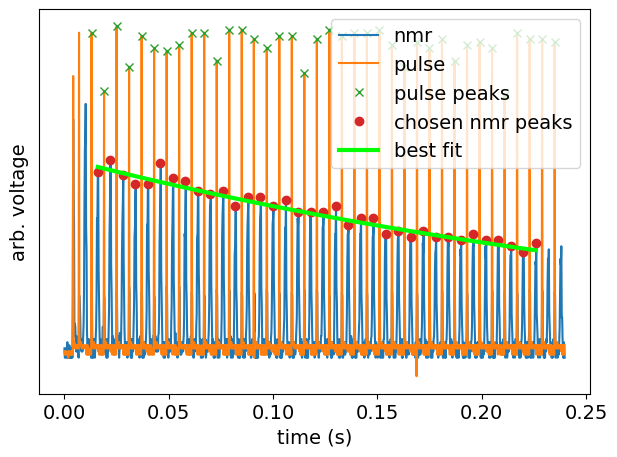

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 19.1076381
    reduced chi-square = 0.56198936
    Akaike info crit   = -18.8035081
    Bayesian info crit = -15.6364703
[[Variables]]
    pre:  0.02574369 +/- 3.0633e-04 (1.19%) (init = 0.4)
    tau:  0.36569940 +/- 0.01306139 (3.57%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.856
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1084 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly60\NewFile8.csv
signal stddev (V): [0.0008     0.00072111 0.00156205 0.00091652 0.00121655 0.00138564
 0.00091652 0.00072111 0.0008     0.00121655 0.0010583  0.00072111
 0.0008     0.00069282 0.0010583  0.0010583  0.0008     0.0008
 0.0008     0.0

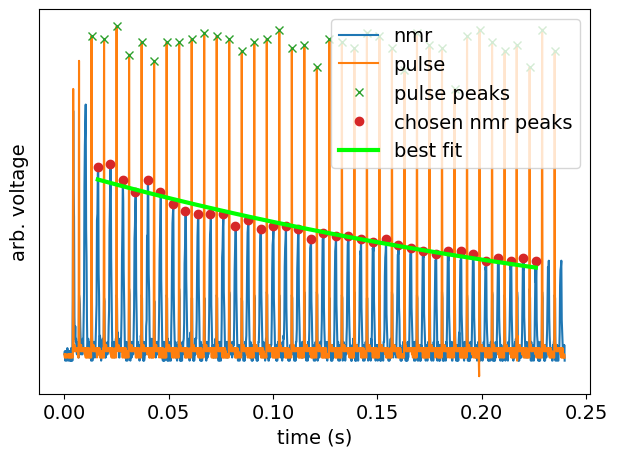

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 36
    # variables        = 2
    chi-square         = 40.9956826
    reduced chi-square = 1.20575537
    Akaike info crit   = 8.67812150
    Bayesian info crit = 11.8451594
[[Variables]]
    pre:  0.02440883 +/- 4.3711e-04 (1.79%) (init = 0.4)
    tau:  0.31521833 +/- 0.01473314 (4.67%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.861
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  754  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly60\NewFile9.csv
signal stddev (V): [0.00131053 0.00116512 0.00146884 0.00131053 0.00163631 0.00146884
 0.00093675 0.00103803 0.00103803 0.00116512 0.00103803 0.00146884
 0.00131053 0.00163631 0.00103803 0.00163631 0.00093675 0.00093675
 0.00116512 0

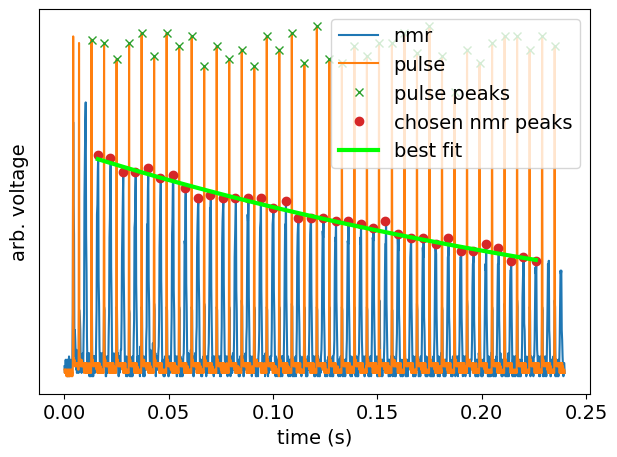

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 7.07857170
    reduced chi-square = 0.20819329
    Akaike info crit   = -54.5520844
    Bayesian info crit = -51.3850465
[[Variables]]
    pre:  0.02760209 +/- 2.4503e-04 (0.89%) (init = 0.4)
    tau:  0.33641038 +/- 0.00816627 (2.43%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.867
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly65\\NewFile

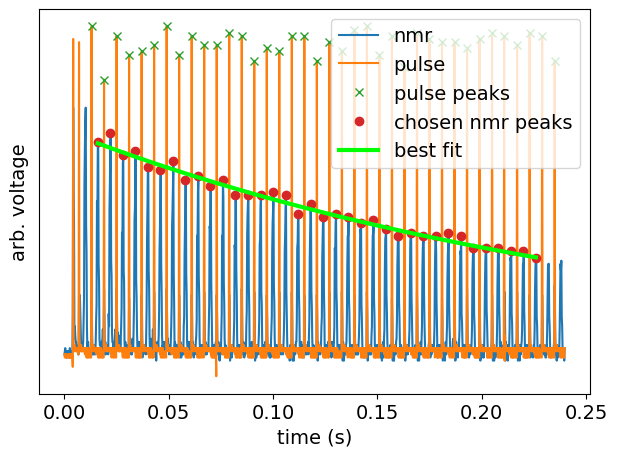

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 11.8148994
    reduced chi-square = 0.34749704
    Akaike info crit   = -36.1096717
    Bayesian info crit = -32.9426338
[[Variables]]
    pre:  0.02945756 +/- 2.9845e-04 (1.01%) (init = 0.4)
    tau:  0.28216722 +/- 0.00712565 (2.53%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.842
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly65\NewFile2.csv
signal stddev (V): [0.00082727 0.00082727 0.00145752 0.00216434 0.00115081 0.00180121
 0.00082727 0.00129783 0.00102195 0.0009189  0.00145752 0.0009189
 0.0009189  0.00102195 0.00102195 0.0009189  0.00102195 0.0008511
 0.0009189  0

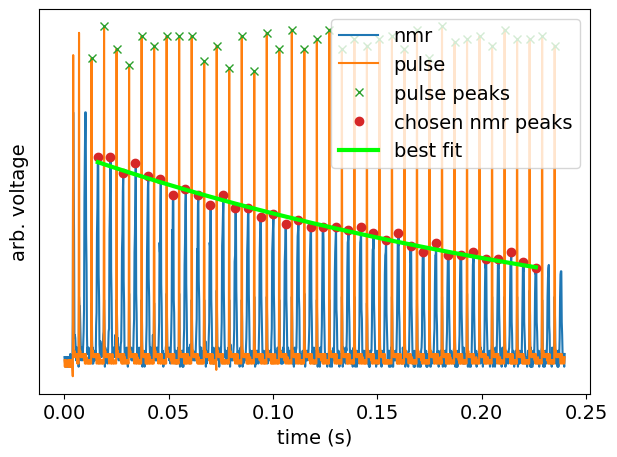

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 14.6610970
    reduced chi-square = 0.43120873
    Akaike info crit   = -28.3395710
    Bayesian info crit = -25.1725331
[[Variables]]
    pre:  0.02718824 +/- 3.0644e-04 (1.13%) (init = 0.4)
    tau:  0.29108415 +/- 0.00807204 (2.77%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.852
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  874
  905  935  965  995 1025 1054 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly65\NewFile3.csv
signal stddev (V): [0.00087034 0.00131053 0.00163631 0.00103803 0.00084705 0.00093675
 0.00116512 0.00103803 0.00146884 0.00146884 0.00093675 0.00093675
 0.00084705 0.00087034 0.00087034 0.00084705 0.00116512 0.00087034
 0.00087034

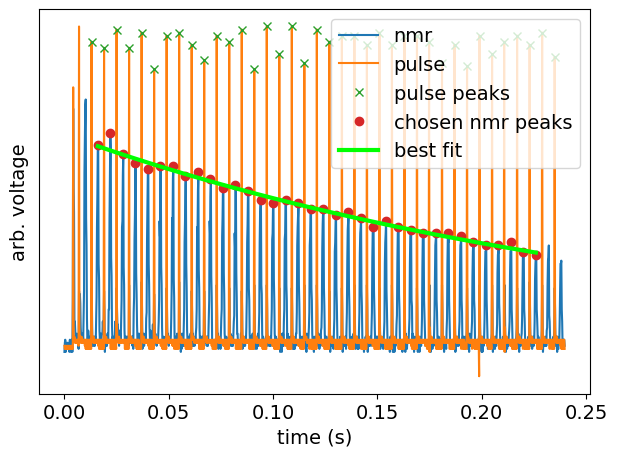

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 9.27350973
    reduced chi-square = 0.27275029
    Akaike info crit   = -44.8288527
    Bayesian info crit = -41.6618148
[[Variables]]
    pre:  0.02859780 +/- 2.4562e-04 (0.86%) (init = 0.4)
    tau:  0.28849699 +/- 0.00605402 (2.10%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.863
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  754  785  815  845  874
  905  935  965  995 1025 1054 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly65\NewFile4.csv
signal stddev (V): [0.00093675 0.00087034 0.00116512 0.00087034 0.00093675 0.00084705
 0.00093675 0.00087034 0.00103803 0.00116512 0.00103803 0.00084705
 0.00093675 0.00087034 0.00084705 0.00084705 0.00103803 0.00087034
 0.00087034

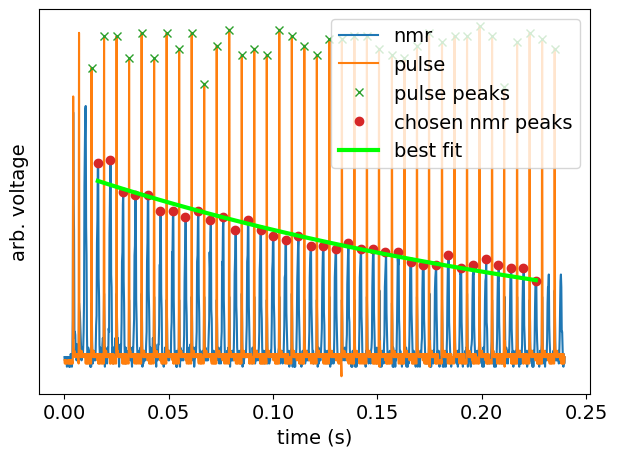

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 40.0019692
    reduced chi-square = 1.17652851
    Akaike info crit   = 7.79475080
    Bayesian info crit = 10.9617887
[[Variables]]
    pre:  0.02477621 +/- 4.7305e-04 (1.91%) (init = 0.4)
    tau:  0.27489503 +/- 0.01315735 (4.79%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.851
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly65\NewFile5.csv
signal stddev (V): [0.0010943  0.00184323 0.00167257 0.0010943  0.0010943  0.00099875
 0.00091515 0.00099875 0.00121552 0.00099875 0.00091515 0.00093675
 0.00091515 0.0010943  0.00099875 0.00099875 0.0010943  0.00099875
 0.00093675 0

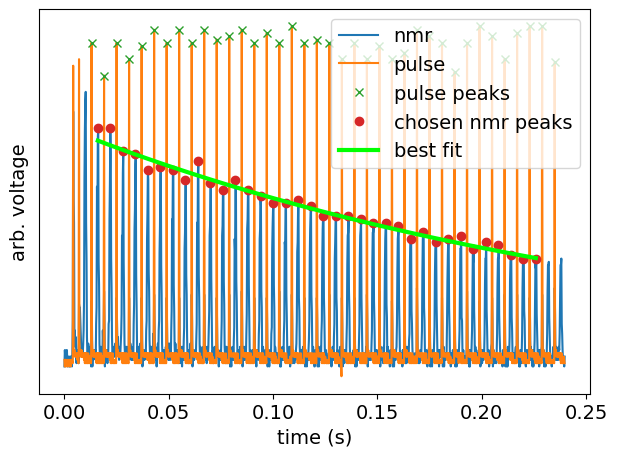

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 15.3692685
    reduced chi-square = 0.45203731
    Akaike info crit   = -26.6413630
    Bayesian info crit = -23.4743252
[[Variables]]
    pre:  0.02922280 +/- 3.4620e-04 (1.18%) (init = 0.4)
    tau:  0.28597546 +/- 0.00832259 (2.91%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.869
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  544  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly65\NewFile6.csv
signal stddev (V): [0.00087034 0.00084705 0.00181039 0.00087034 0.00093675 0.00103803
 0.00146884 0.00103803 0.00093675 0.00087034 0.00103803 0.00116512
 0.00103803 0.00084705 0.00093675 0.00084705 0.00103803 0.00093675
 0.00087034

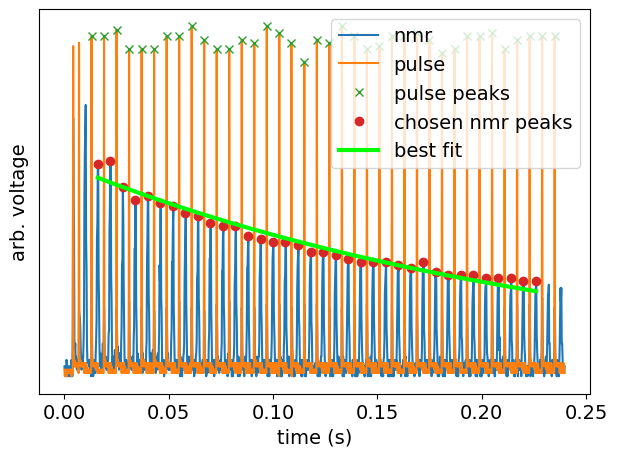

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 30.0583338
    reduced chi-square = 0.88406864
    Akaike info crit   = -2.49364345
    Bayesian info crit = 0.67339442
[[Variables]]
    pre:  0.02591344 +/- 4.3305e-04 (1.67%) (init = 0.4)
    tau:  0.24774349 +/- 0.00915452 (3.70%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.849
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  904  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly65\NewFile7.csv
signal stddev (V): [0.00113027 0.00103803 0.00153542 0.00097852 0.00097852 0.00138474
 0.00097852 0.00103803 0.00138474 0.00138474 0.00103803 0.00097852
 0.00138474 0.00095786 0.00113027 0.00097852 0.00097852 0.00138474
 0.00103803 

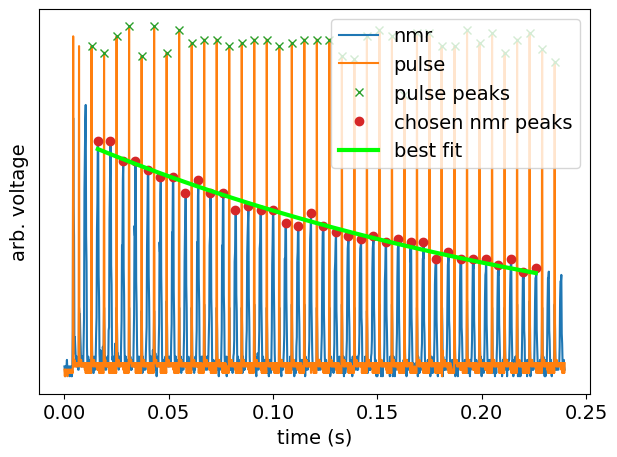

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 14.9717201
    reduced chi-square = 0.44034471
    Akaike info crit   = -27.5848103
    Bayesian info crit = -24.4177725
[[Variables]]
    pre:  0.02952696 +/- 3.4225e-04 (1.16%) (init = 0.4)
    tau:  0.26597134 +/- 0.00725909 (2.73%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.851
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  874
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly65\NewFile8.csv
signal stddev (V): [0.00102439 0.00092162 0.00129976 0.00092162 0.00085403 0.00085403
 0.00145924 0.00083029 0.00092162 0.00115299 0.00092162 0.00083029
 0.00085403 0.00092162 0.00085403 0.00085403 0.00102439 0.00083029
 0.00092162

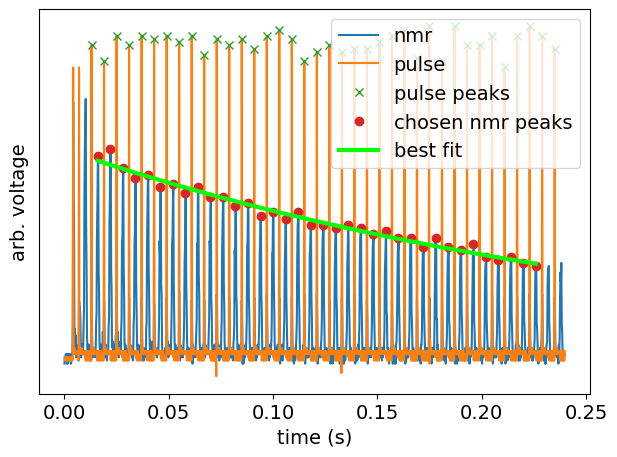

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 15.6486690
    reduced chi-square = 0.46025497
    Akaike info crit   = -25.9927907
    Bayesian info crit = -22.8257528
[[Variables]]
    pre:  0.02717923 +/- 2.9631e-04 (1.09%) (init = 0.4)
    tau:  0.29664967 +/- 0.00833506 (2.81%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.859
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  604  635  665  695  725  755  785  815  845  874
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly65\NewFile9.csv
signal stddev (V): [0.00136748 0.00101489 0.00185203 0.00095394 0.00101489 0.00122882
 0.00110905 0.00168226 0.00122882 0.00101489 0.00095394 0.00095394
 0.00101489 0.00101489 0.00095394 0.00101489 0.00101489 0.00093274
 0.00110905

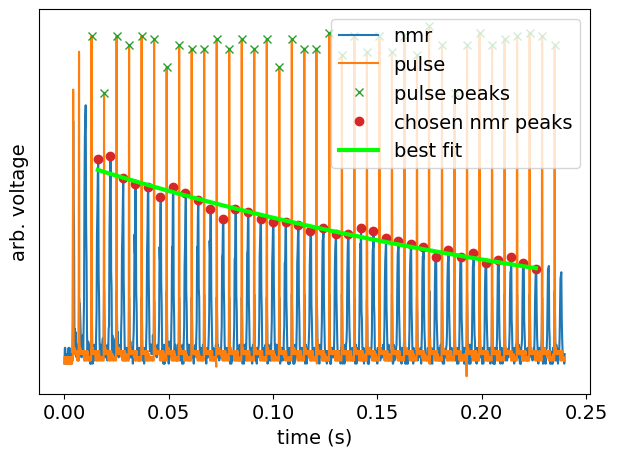

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 41
    # data points      = 36
    # variables        = 2
    chi-square         = 16.2895434
    reduced chi-square = 0.47910422
    Akaike info crit   = -24.5478397
    Bayesian info crit = -21.3808019
[[Variables]]
    pre:  0.02595452 +/- 3.5741e-04 (1.38%) (init = 0.4)
    tau:  0.29669864 +/- 0.01044401 (3.52%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.864
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly70\\NewFile

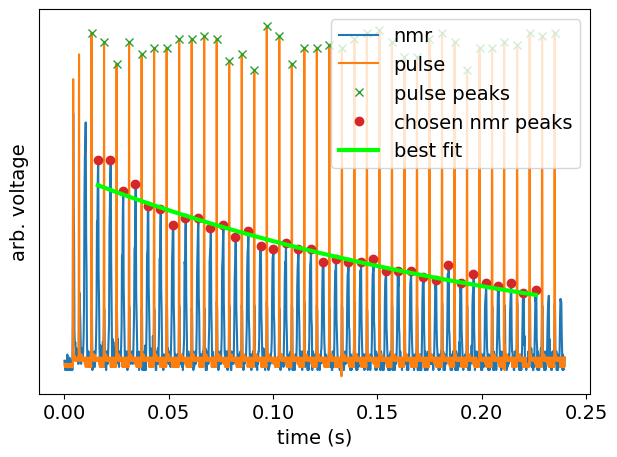

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 36.5738911
    reduced chi-square = 1.07570268
    Akaike info crit   = 4.56936486
    Bayesian info crit = 7.73640274
[[Variables]]
    pre:  0.02559023 +/- 5.5107e-04 (2.15%) (init = 0.4)
    tau:  0.23314286 +/- 0.01006315 (4.32%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.865
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1054 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly70\NewFile2.csv
signal stddev (V): [0.0010943  0.00074666 0.00158666 0.001248   0.00077298 0.00095786
 0.00095786 0.00141333 0.0010943  0.0010943  0.00077298 0.001248
 0.00095786 0.00074666 0.00141333 0.00095786 0.0010943  0.001248
 0.00084705 0.001

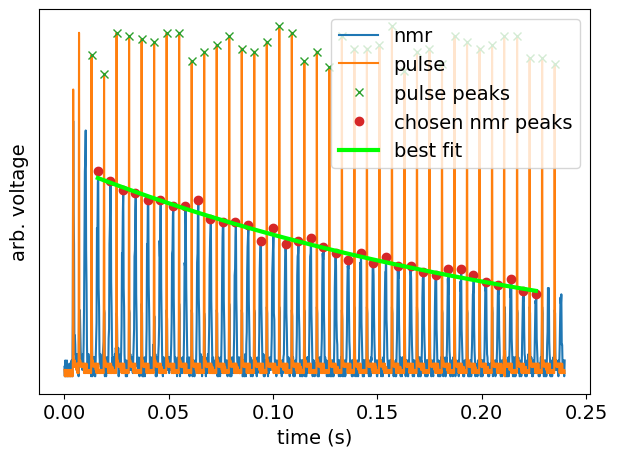

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 13.6757673
    reduced chi-square = 0.40222845
    Akaike info crit   = -30.8441654
    Bayesian info crit = -27.6771276
[[Variables]]
    pre:  0.02683612 +/- 2.9124e-04 (1.09%) (init = 0.4)
    tau:  0.24931070 +/- 0.00587096 (2.35%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.849
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1144 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly70\NewFile3.csv
signal stddev (V): [0.00091617 0.0010195  0.00216319 0.0010195  0.00084816 0.0010195
 0.00114864 0.00197974 0.00114864 0.00091617 0.00084816 0.0010195
 0.00084816 0.00114864 0.00145581 0.00114864 0.00091617 0.00114864
 0.00091617 0

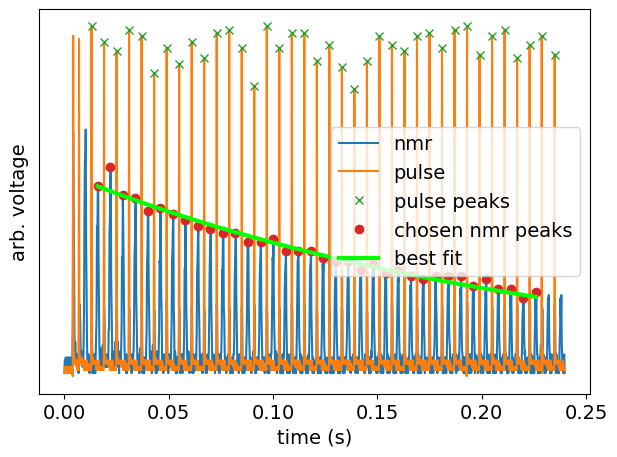

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 18.1641983
    reduced chi-square = 0.53424113
    Akaike info crit   = -20.6263906
    Bayesian info crit = -17.4593528
[[Variables]]
    pre:  0.02561282 +/- 3.6453e-04 (1.42%) (init = 0.4)
    tau:  0.23415322 +/- 0.00703005 (3.00%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.844
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  844  875
  905  935  965  995 1025 1054 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly70\NewFile4.csv
signal stddev (V): [0.00124499 0.00095394 0.00076811 0.00176352 0.00095394 0.00141067
 0.00095394 0.00109087 0.00084261 0.00109087 0.00095394 0.00084261
 0.00109087 0.00074162 0.00084261 0.00124499 0.00124499 0.00084261
 0.00084261

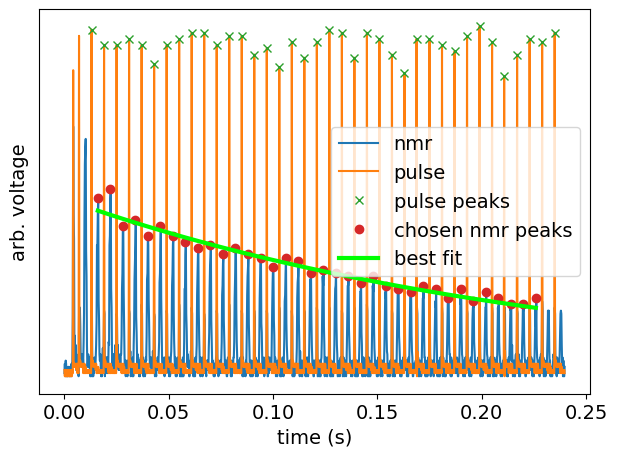

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 28.2467919
    reduced chi-square = 0.83078800
    Akaike info crit   = -4.73140569
    Bayesian info crit = -1.56436781
[[Variables]]
    pre:  0.02268641 +/- 4.3654e-04 (1.92%) (init = 0.4)
    tau:  0.23749479 +/- 0.00960352 (4.04%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.855
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  994 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly70\NewFile5.csv
signal stddev (V): [0.00200437 0.00119059 0.00165454 0.00119059 0.00106654 0.00090416
 0.00133323 0.00106654 0.00106654 0.00133323 0.00090416 0.01842112
 0.00096825 0.00096825 0.00090416 0.00106654 0.00119059 0.00148913
 0.00096825

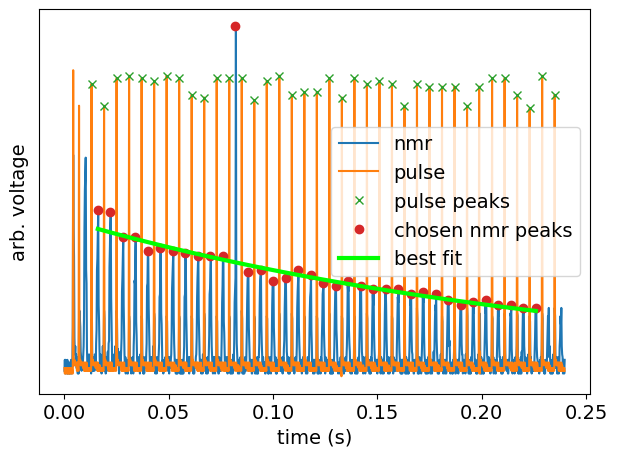

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 36
    # variables        = 2
    chi-square         = 22.2921403
    reduced chi-square = 0.65565118
    Akaike info crit   = -13.2542520
    Bayesian info crit = -10.0872141
[[Variables]]
    pre:  0.02256083 +/- 4.5694e-04 (2.03%) (init = 0.4)
    tau:  0.25064563 +/- 0.01071915 (4.28%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.870
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly70\NewFile6.csv
signal stddev (V): [0.00120727 0.00070534 0.00230163 0.0013775  0.00078581 0.00104762
 0.00070534 0.00070534 0.00155483 0.00078581 0.00104762 0.00120727
 0.00104762 0.00155483 0.00120727 0.00090416 0.00090416 0.00104762
 0.00078581

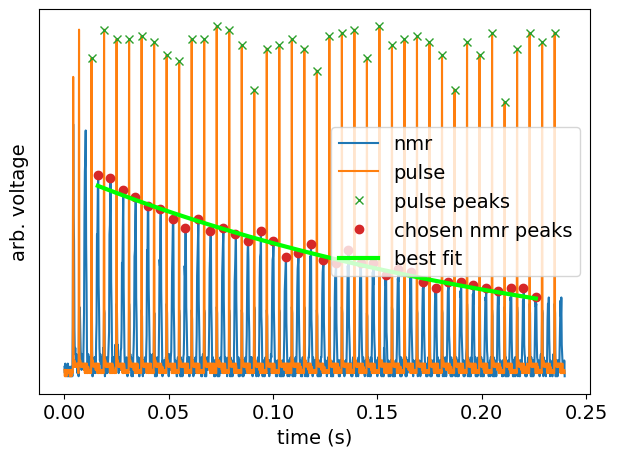

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 26.4695051
    reduced chi-square = 0.77851486
    Akaike info crit   = -7.07092232
    Bayesian info crit = -3.90388445
[[Variables]]
    pre:  0.02588187 +/- 4.0029e-04 (1.55%) (init = 0.4)
    tau:  0.23432129 +/- 0.00747136 (3.19%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.850
[  65   95  125  155  185  215  245  275  305  335  365  395  425  454
  485  515  545  575  605  635  665  695  725  755  785  815  844  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly70\NewFile7.csv
signal stddev (V): [0.00147796 0.00105089 0.00217816 0.00132075 0.00117659 0.00086277
 0.00086277 0.00088565 0.00105089 0.00086277 0.00105089 0.00095099
 0.00095099 0.00117659 0.00117659 0.00105089 0.00132075 0.00117659
 0.00105089

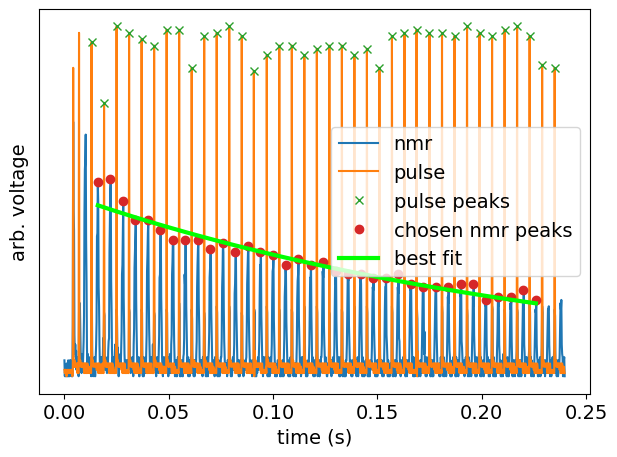

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 31.5818997
    reduced chi-square = 0.92887940
    Akaike info crit   = -0.71365197
    Bayesian info crit = 2.45338591
[[Variables]]
    pre:  0.02294786 +/- 5.0899e-04 (2.22%) (init = 0.4)
    tau:  0.24644026 +/- 0.01192566 (4.84%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.864
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  544  575  605  635  665  695  725  755  785  815  845  874
  905  935  965  994 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly70\NewFile8.csv
signal stddev (V): [0.0009189  0.00082727 0.00129783 0.00115081 0.0008511  0.00115081
 0.0009189  0.0009189  0.00115081 0.00102195 0.0008511  0.00102195
 0.0009189  0.00115081 0.0009189  0.0009189  0.0009189  0.00102195
 0.0008511  

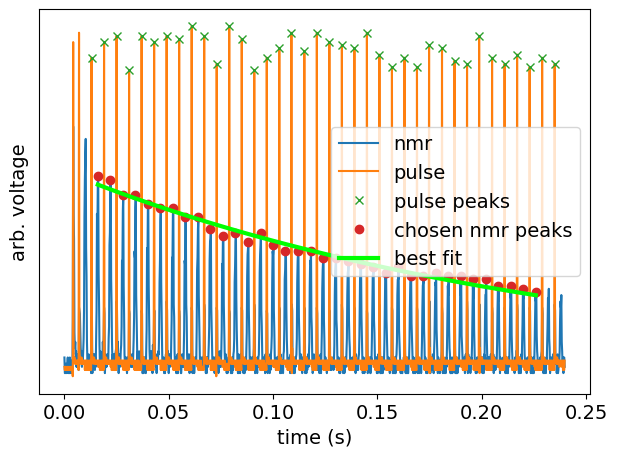

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 15.8444944
    reduced chi-square = 0.46601454
    Akaike info crit   = -25.5450869
    Bayesian info crit = -22.3780490
[[Variables]]
    pre:  0.02582531 +/- 3.1650e-04 (1.23%) (init = 0.4)
    tau:  0.23755602 +/- 0.00632858 (2.66%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.844
[  65   95  125  155  185  215  245  275  305  335  365  395  425  455
  485  515  545  575  605  635  665  695  725  755  785  815  845  875
  905  935  965  995 1025 1055 1085 1115 1145 1175]
test: CarrPurc_P1-19_P2-38_tauVary\Gly70\NewFile9.csv
signal stddev (V): [0.00067639 0.00070534 0.00090416 0.00090416 0.00070534 0.0013775
 0.00090416 0.00120727 0.00104762 0.00067639 0.0013775  0.00120727
 0.00070534 0.00067639 0.00078581 0.00067639 0.00090416 0.00070534
 0.00070534 

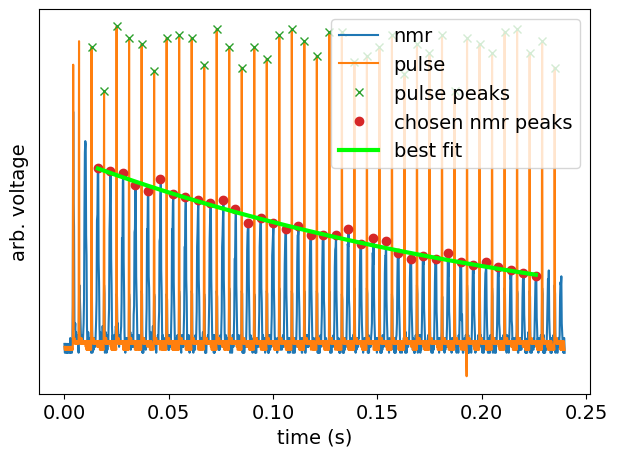

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 14.6677504
    reduced chi-square = 0.43140442
    Akaike info crit   = -28.3232373
    Bayesian info crit = -25.1561994
[[Variables]]
    pre:  0.02677186 +/- 2.5086e-04 (0.94%) (init = 0.4)
    tau:  0.24423417 +/- 0.00499697 (2.05%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.837
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly75\\NewFile

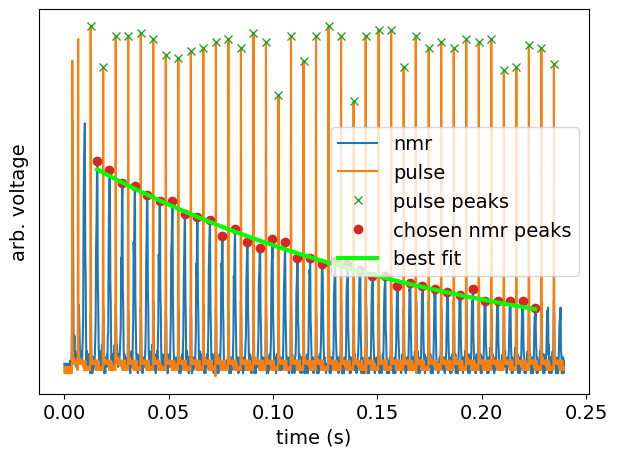

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 12.4283086
    reduced chi-square = 0.36553849
    Akaike info crit   = -34.2875160
    Bayesian info crit = -31.1204782
[[Variables]]
    pre:  0.02844884 +/- 3.0189e-04 (1.06%) (init = 0.4)
    tau:  0.18123473 +/- 0.00326050 (1.80%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.840
[  63   93  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  843  872
  903  933  963  992 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly75\NewFile2.csv
signal stddev (V): [0.00086    0.00073457 0.00064776 0.00171452 0.00064776 0.00134892
 0.00073457 0.00117456 0.00086    0.00064776 0.00086    0.00064776
 0.00100975 0.00064776 0.00086    0.00073457 0.00073457 0.00100975
 0.00086   

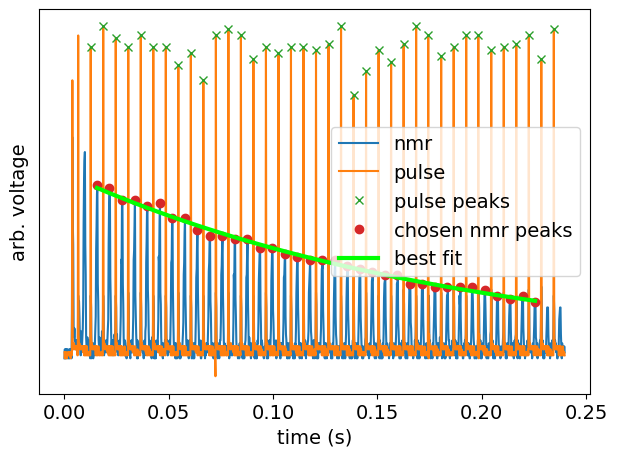

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 36
    # variables        = 2
    chi-square         = 9.69397752
    reduced chi-square = 0.28511699
    Akaike info crit   = -43.2325083
    Bayesian info crit = -40.0654704
[[Variables]]
    pre:  0.02471835 +/- 2.1303e-04 (0.86%) (init = 0.4)
    tau:  0.19327643 +/- 0.00302530 (1.57%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.834
[  63   93  122  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  843  873
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly75\NewFile3.csv
signal stddev (V): [0.001      0.00063246 0.001      0.00134164 0.00084853 0.001
 0.00063246 0.00072111 0.00063246 0.001      0.00084853 0.00084853
 0.00084853 0.00084853 0.00116619 0.00063246 0.0006     0.00063246
 0.00072111 0.00

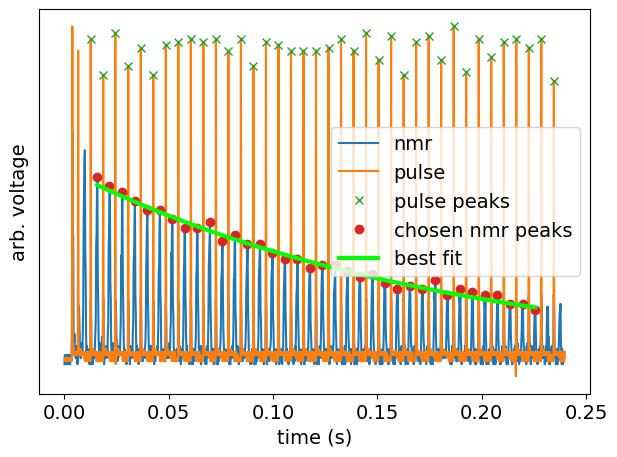

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 19.8841115
    reduced chi-square = 0.58482681
    Akaike info crit   = -17.3695260
    Bayesian info crit = -14.2024881
[[Variables]]
    pre:  0.02591412 +/- 3.1871e-04 (1.23%) (init = 0.4)
    tau:  0.18248297 +/- 0.00381469 (2.09%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.845
[  63   92  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  843  873
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly75\NewFile4.csv
signal stddev (V): [0.00096044 0.00141508 0.00084997 0.00109656 0.00109656 0.00124998
 0.00077618 0.00077618 0.00124998 0.00074997 0.00084997 0.00096044
 0.00077618 0.00077618 0.00084997 0.00074997 0.00077618 0.00077618
 0.00096044

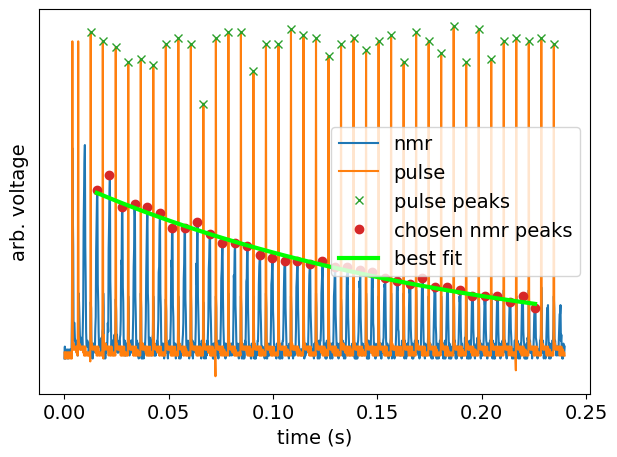

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 16.6261109
    reduced chi-square = 0.48900326
    Akaike info crit   = -23.8116031
    Bayesian info crit = -20.6445652
[[Variables]]
    pre:  0.02425440 +/- 3.4070e-04 (1.40%) (init = 0.4)
    tau:  0.18931809 +/- 0.00469525 (2.48%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.854
[  63   93  122  153  183  213  243  273  303  333  363  393  423  453
  483  513  542  573  603  633  663  692  723  753  783  813  843  873
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly75\NewFile5.csv
signal stddev (V): [0.00065403 0.00076665 0.00103332 0.00088756 0.00119489 0.00136666
 0.00076665 0.00103332 0.00103332 0.00065403 0.00076665 0.00119489
 0.00136666 0.00076665 0.00103332 0.00068393 0.00076665 0.00065403
 0.00076665

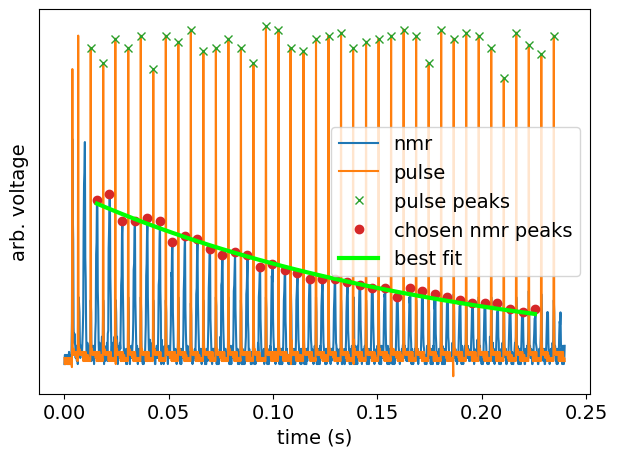

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 36
    # variables        = 2
    chi-square         = 23.1157149
    reduced chi-square = 0.67987397
    Akaike info crit   = -11.9482251
    Bayesian info crit = -8.78118721
[[Variables]]
    pre:  0.02300419 +/- 3.5253e-04 (1.53%) (init = 0.4)
    tau:  0.18038725 +/- 0.00475249 (2.63%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.831
[  63   93  122  153  183  213  243  273  303  333  363  393  423  453
  483  513  542  573  603  633  663  693  723  753  783  813  843  873
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly75\NewFile6.csv
signal stddev (V): [0.00144561 0.00089989 0.00161549 0.00083054 0.0008061  0.00128444
 0.00161549 0.00083054 0.00113569 0.00128444 0.00089989 0.0008061
 0.00179159 0.00113569 0.0008061  0.00113569 0.00113569 0.00089989
 0.00100489 

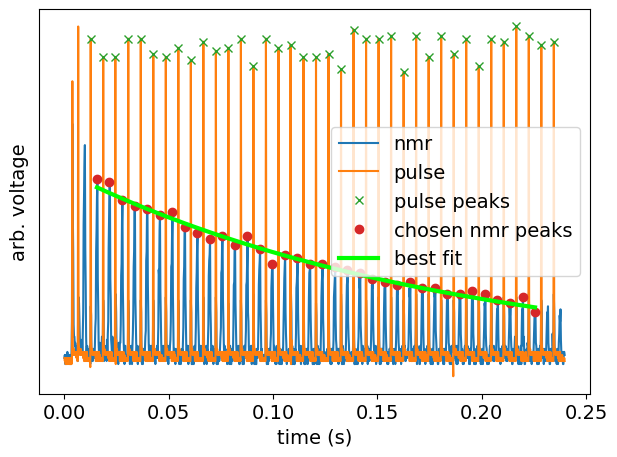

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 14.0422051
    reduced chi-square = 0.41300603
    Akaike info crit   = -29.8922538
    Bayesian info crit = -26.7252159
[[Variables]]
    pre:  0.02528746 +/- 3.4041e-04 (1.35%) (init = 0.4)
    tau:  0.18473991 +/- 0.00432073 (2.34%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.841
[  63   93  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  722  753  783  813  843  873
  903  933  963  992 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly75\NewFile7.csv
signal stddev (V): [0.00114749 0.0008466  0.00129489 0.00091473 0.0014549  0.0010182
 0.0008466  0.00091473 0.00091473 0.00091473 0.00091473 0.00091473
 0.0008466  0.0010182  0.0014549  0.00091473 0.0010182  0.0010182
 0.0010182  0

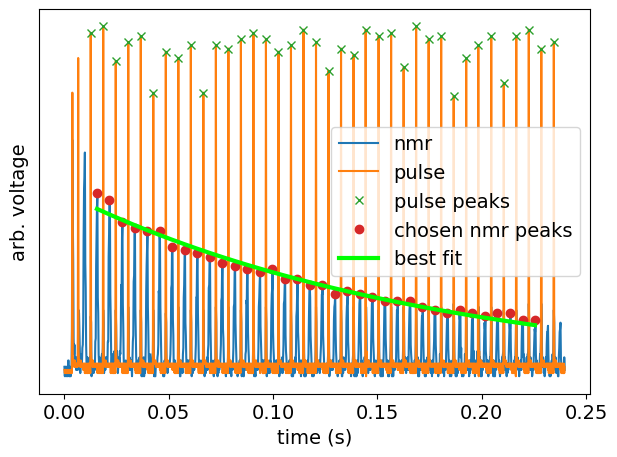

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 36
    # variables        = 2
    chi-square         = 17.0835645
    reduced chi-square = 0.50245778
    Akaike info crit   = -22.8344747
    Bayesian info crit = -19.6674368
[[Variables]]
    pre:  0.02320412 +/- 3.6765e-04 (1.58%) (init = 0.4)
    tau:  0.17693852 +/- 0.00490762 (2.77%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.837
[  63   92  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  843  872
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly75\NewFile8.csv
signal stddev (V): [0.00111977 0.0008797  0.00178154 0.00098685 0.00098685 0.0008797
 0.00098685 0.00098685 0.0008797  0.00080863 0.00080863 0.00098685
 0.0007835  0.00111977 0.00080863 0.00098685 0.0007835  0.00098685
 0.00127038 

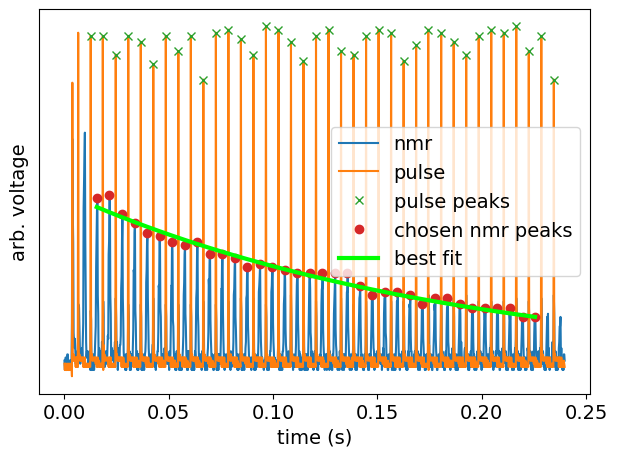

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 35
    # data points      = 36
    # variables        = 2
    chi-square         = 18.2831656
    reduced chi-square = 0.53774017
    Akaike info crit   = -20.3913756
    Bayesian info crit = -17.2243378
[[Variables]]
    pre:  0.02267201 +/- 3.6703e-04 (1.62%) (init = 0.4)
    tau:  0.18731474 +/- 0.00542333 (2.90%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.842
[  63   92  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  692  723  753  783  813  842  873
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly75\NewFile9.csv
signal stddev (V): [0.00085524 0.00087831 0.00104471 0.00117108 0.00104471 0.00147358
 0.00094415 0.00094415 0.00164056 0.00087831 0.00085524 0.00087831
 0.00104471 0.00085524 0.00104471 0.00104471 0.00094415 0.00094415
 0.00087831

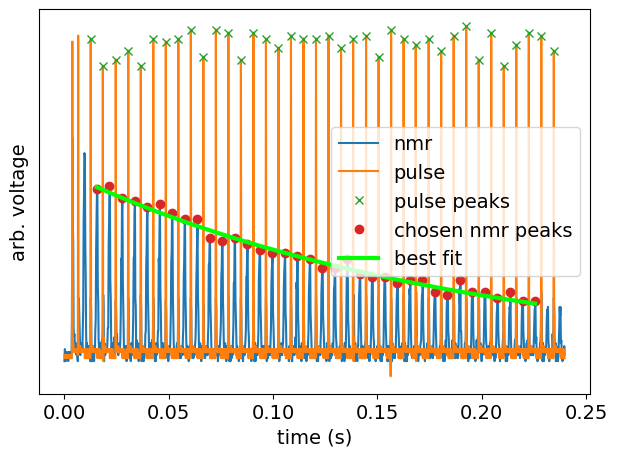

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 36
    # variables        = 2
    chi-square         = 12.7746593
    reduced chi-square = 0.37572527
    Akaike info crit   = -33.2979969
    Bayesian info crit = -30.1309591
[[Variables]]
    pre:  0.02505644 +/- 3.0496e-04 (1.22%) (init = 0.4)
    tau:  0.18993885 +/- 0.00430276 (2.27%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.833
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly80\\NewFile

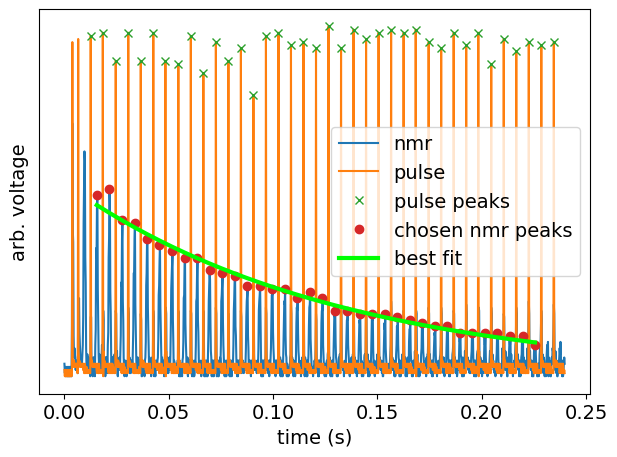

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 36
    # variables        = 2
    chi-square         = 18.9184381
    reduced chi-square = 0.55642465
    Akaike info crit   = -19.1617496
    Bayesian info crit = -15.9947117
[[Variables]]
    pre:  0.02471163 +/- 4.2686e-04 (1.73%) (init = 0.4)
    tau:  0.12953249 +/- 0.00303683 (2.34%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.829
[  63   93  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  692  723  753  783  813  843  873
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly80\NewFile2.csv
signal stddev (V): [0.00090621 0.00090621 0.00137885 0.00090621 0.00104939 0.00078818
 0.00070797 0.00090621 0.00090621 0.00078818 0.00090621 0.00070797
 0.00104939 0.00090621 0.00090621 0.00104939 0.00078818 0.00070797
 0.00067914

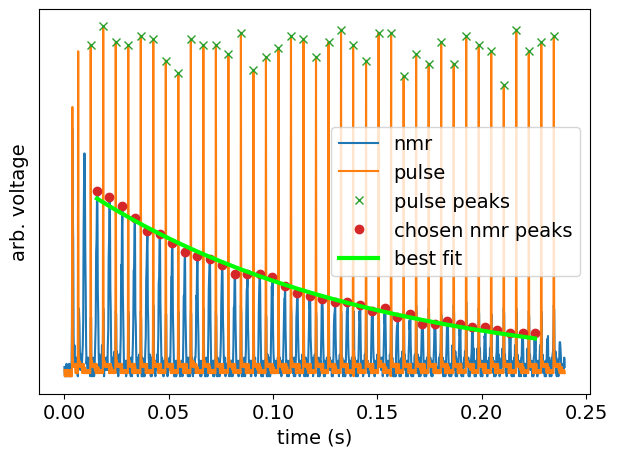

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 38
    # data points      = 36
    # variables        = 2
    chi-square         = 14.1349429
    reduced chi-square = 0.41573361
    Akaike info crit   = -29.6552835
    Bayesian info crit = -26.4882456
[[Variables]]
    pre:  0.02576400 +/- 3.3268e-04 (1.29%) (init = 0.4)
    tau:  0.13571174 +/- 0.00249619 (1.84%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.831
[  63   92  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  842  873
  903  933  963  992 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly80\NewFile3.csv
signal stddev (V): [0.00076238 0.00067914 0.00136427 0.00119215 0.00064902 0.00136427
 0.00088387 0.00103016 0.00119215 0.00119215 0.00088387 0.00103016
 0.00076238 0.00067914 0.00103016 0.00119215 0.00067914 0.00076238
 0.00067914

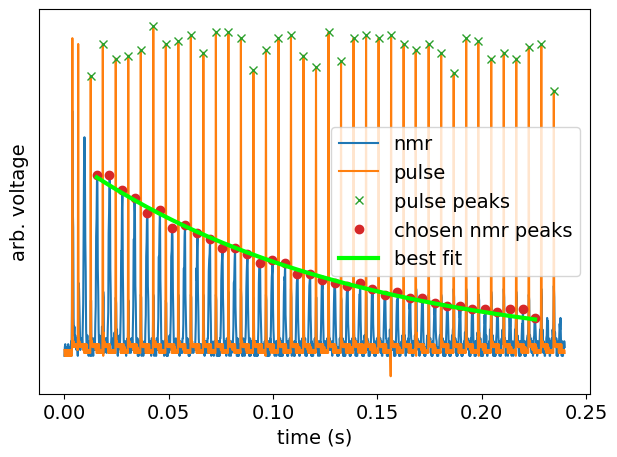

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 36
    # variables        = 2
    chi-square         = 16.0331559
    reduced chi-square = 0.47156341
    Akaike info crit   = -25.1189641
    Bayesian info crit = -21.9519262
[[Variables]]
    pre:  0.02754759 +/- 3.3458e-04 (1.21%) (init = 0.4)
    tau:  0.13213281 +/- 0.00227204 (1.72%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.809
[  63   93  122  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  842  873
  903  933  963  992 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly80\NewFile4.csv
signal stddev (V): [0.0007835  0.0008797  0.00111977 0.00080863 0.00080863 0.00127038
 0.00160433 0.00098685 0.0007835  0.00111977 0.00080863 0.0007835
 0.0008797  0.00080863 0.0008797  0.00080863 0.0008797  0.0008797
 0.0008797  0

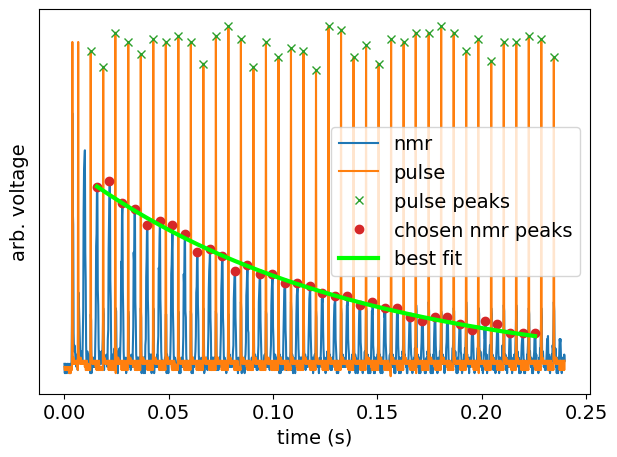

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 36
    # variables        = 2
    chi-square         = 16.2212099
    reduced chi-square = 0.47709441
    Akaike info crit   = -24.6991749
    Bayesian info crit = -21.5321370
[[Variables]]
    pre:  0.02720404 +/- 3.6018e-04 (1.32%) (init = 0.4)
    tau:  0.12985950 +/- 0.00252214 (1.94%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.813
[  63   93  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  722  753  783  813  843  873
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly80\NewFile5.csv
signal stddev (V): [0.00103332 0.00076665 0.00119489 0.00065403 0.00076665 0.00119489
 0.00088756 0.00065403 0.00088756 0.00103332 0.00088756 0.00068393
 0.00088756 0.00076665 0.00068393 0.00136666 0.00076665 0.00065403
 0.00065403

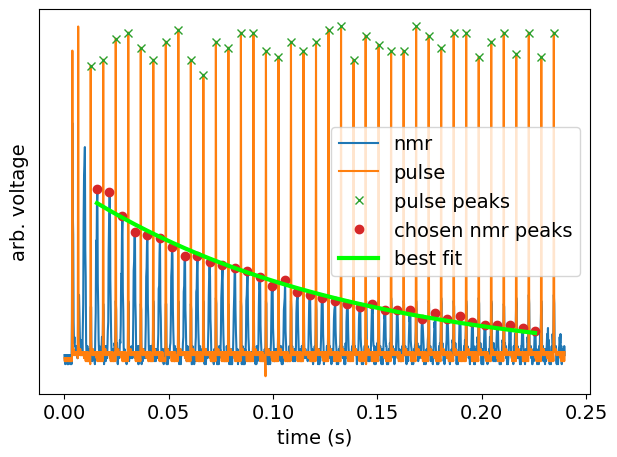

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 36
    # variables        = 2
    chi-square         = 27.8781049
    reduced chi-square = 0.81994426
    Akaike info crit   = -5.20438379
    Bayesian info crit = -2.03734591
[[Variables]]
    pre:  0.02414481 +/- 4.4759e-04 (1.85%) (init = 0.4)
    tau:  0.12794441 +/- 0.00328303 (2.57%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.827
[  63   93  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  842  873
  903  933  963  992 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly80\NewFile6.csv
signal stddev (V): [0.0010525  0.00088756 0.00117803 0.0010525  0.00088756 0.00086473
 0.00088756 0.00147911 0.00117803 0.00088756 0.00095276 0.00086473
 0.0010525  0.00088756 0.00088756 0.00117803 0.00095276 0.00095276
 0.00095276

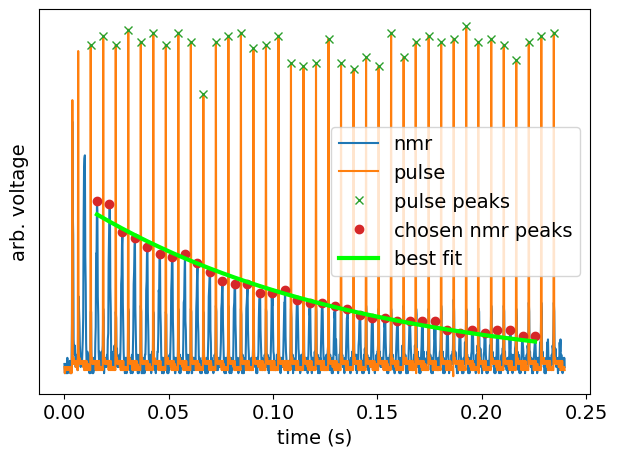

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 36
    # variables        = 2
    chi-square         = 20.9228987
    reduced chi-square = 0.61537937
    Akaike info crit   = -15.5362910
    Bayesian info crit = -12.3692531
[[Variables]]
    pre:  0.02333249 +/- 4.5187e-04 (1.94%) (init = 0.4)
    tau:  0.13012334 +/- 0.00369268 (2.84%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.819
[  63   93  122  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  692  723  753  783  813  843  872
  903  933  963  992 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly80\NewFile7.csv
signal stddev (V): [0.00096129 0.00080255 0.00080255 0.00096129 0.00080255 0.00056928
 0.00113317 0.00096129 0.00066639 0.00066639 0.00080255 0.00066639
 0.00080255 0.00080255 0.00113317 0.00066639 0.00066639 0.00053299
 0.00053299

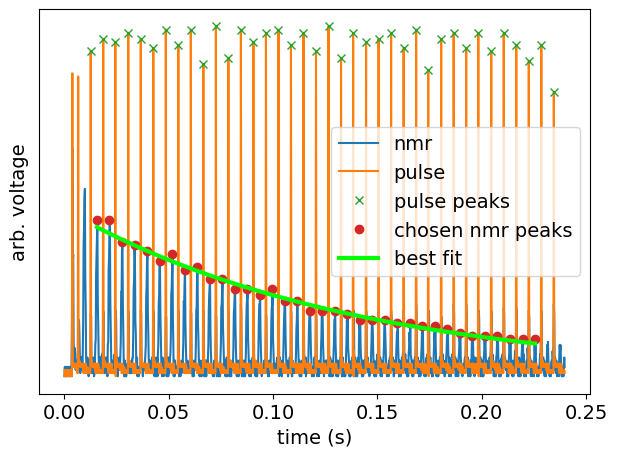

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 36
    # variables        = 2
    chi-square         = 17.4412957
    reduced chi-square = 0.51297928
    Akaike info crit   = -22.0884162
    Bayesian info crit = -18.9213784
[[Variables]]
    pre:  0.02137135 +/- 3.2156e-04 (1.50%) (init = 0.4)
    tau:  0.13849633 +/- 0.00289613 (2.09%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.839
[  63   92  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  843  872
  903  933  963  992 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly80\NewFile8.csv
signal stddev (V): [0.00104589 0.00090215 0.00090215 0.0007835  0.0007835  0.00137618
 0.00137618 0.00070276 0.00070276 0.00070276 0.00070276 0.00104589
 0.00090215 0.00104589 0.00104589 0.0007835  0.0007835  0.0007835
 0.0007835  

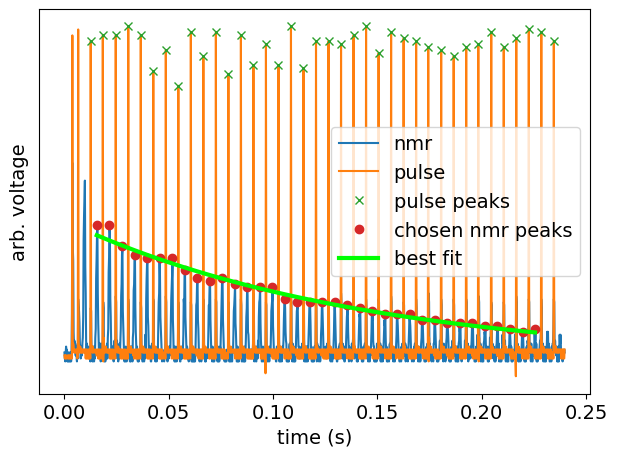

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 36
    # variables        = 2
    chi-square         = 15.7914795
    reduced chi-square = 0.46445528
    Akaike info crit   = -25.6657430
    Bayesian info crit = -22.4987051
[[Variables]]
    pre:  0.01898332 +/- 3.3473e-04 (1.76%) (init = 0.4)
    tau:  0.14275113 +/- 0.00368221 (2.58%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.832
[  63   93  123  153  183  213  243  273  303  333  363  393  423  453
  483  513  543  573  603  633  663  693  723  753  783  813  843  873
  903  933  963  993 1023 1053 1083 1113 1143 1173]
test: CarrPurc_P1-19_P2-38_tauVary\Gly80\NewFile9.csv
signal stddev (V): [0.00149175 0.00130587 0.00168086 0.00130587 0.00095148 0.00112486
 0.00065215 0.00206526 0.00130587 0.00055255 0.00112486 0.00149175
 0.00079076 0.00079076 0.00065215 0.00065215 0.00079076 0.00055255
 0.00051508

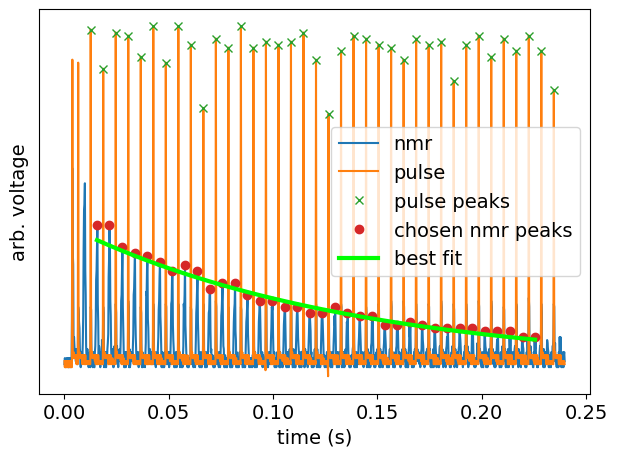

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 36
    # variables        = 2
    chi-square         = 25.4515695
    reduced chi-square = 0.74857557
    Akaike info crit   = -8.48269503
    Bayesian info crit = -5.31565715
[[Variables]]
    pre:  0.01888795 +/- 5.1356e-04 (2.72%) (init = 0.4)
    tau:  0.13738295 +/- 0.00450151 (3.28%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.881
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly84\\NewFile

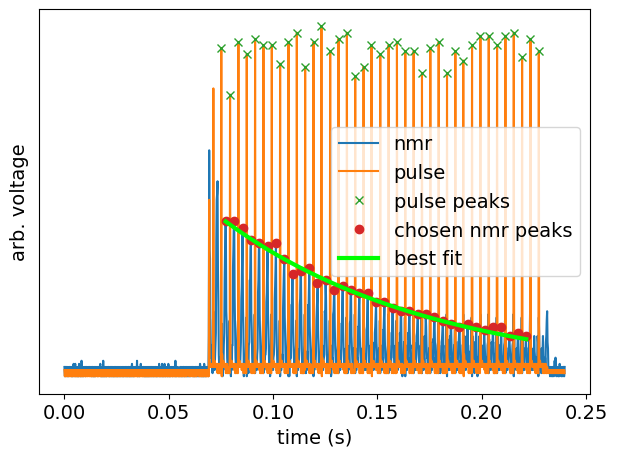

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 37
    # variables        = 2
    chi-square         = 12.1419540
    reduced chi-square = 0.34691297
    Akaike info crit   = -37.2272937
    Bayesian info crit = -34.0054579
[[Variables]]
    pre:  0.04304633 +/- 0.00106078 (2.46%) (init = 0.4)
    tau:  0.10083383 +/- 0.00206412 (2.05%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.955
[ 376  396  417  437  457  477  497  517  537  557  577  597  616  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  956  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile2.csv
signal stddev (V): [0.00116661 0.00060081 0.00100049 0.001342   0.00100049 0.00063322
 0.0008491  0.00170909 0.00116661 0.00100049 0.00072178 0.001342
 0.00100049 0.00116661 0.00063322 0.00100049 0.0008491  0.0008491
 0.001342

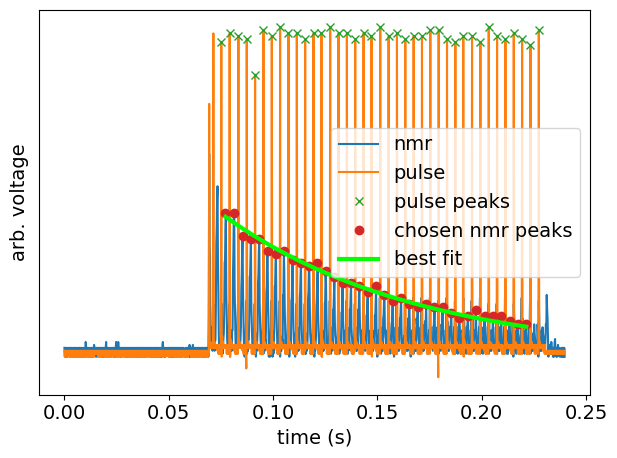

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 37
    # variables        = 2
    chi-square         = 16.4523666
    reduced chi-square = 0.47006762
    Akaike info crit   = -25.9865974
    Bayesian info crit = -22.7647616
[[Variables]]
    pre:  0.04347128 +/- 0.00137358 (3.16%) (init = 0.4)
    tau:  0.09355143 +/- 0.00226929 (2.43%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.956
[ 377  396  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile3.csv
signal stddev (V): [0.00059204 0.00062491 0.00099524 0.00170602 0.00116211 0.00084292
 0.0007145  0.00084292 0.00152004 0.00084292 0.0013381  0.00116211
 0.0007145  0.00084292 0.00116211 0.00099524 0.00099524 0.00099524
 0.000

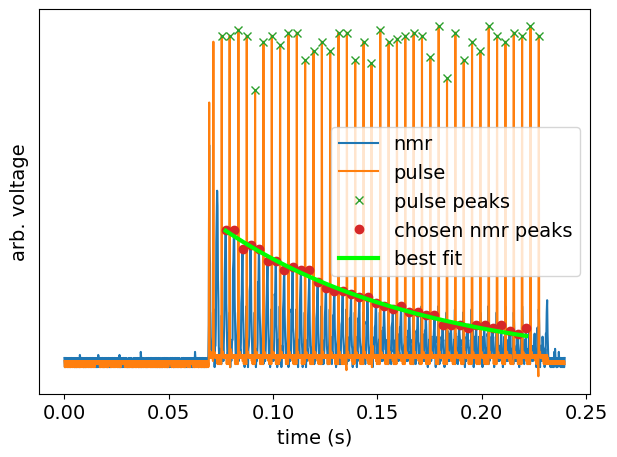

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 80
    # data points      = 37
    # variables        = 2
    chi-square         = 9.99749478
    reduced chi-square = 0.28564271
    Akaike info crit   = -44.4175848
    Bayesian info crit = -41.1957490
[[Variables]]
    pre:  0.03960564 +/- 9.3568e-04 (2.36%) (init = 0.4)
    tau:  0.09760126 +/- 0.00189263 (1.94%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.952
[ 377  397  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  717  737  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile4.csv
signal stddev (V): [0.00077167 0.00103705 0.00136948 0.00119812 0.0008919  0.00154773
 0.00065991 0.00119812 0.00065991 0.0008919  0.00119812 0.00119812
 0.00077167 0.00119812 0.00065991 0.00103705 0.00068955 0.00103705
 0.001

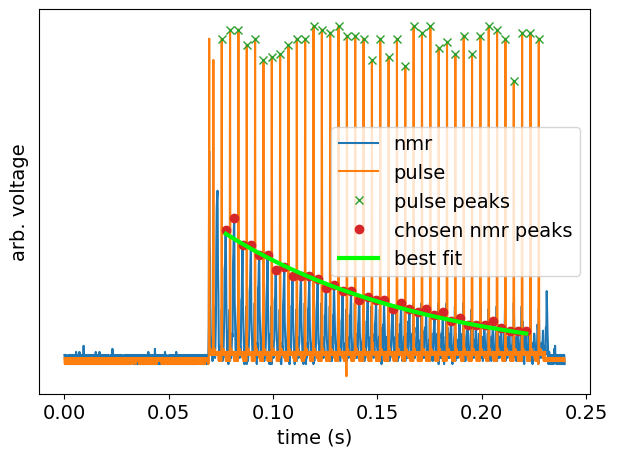

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 80
    # data points      = 37
    # variables        = 2
    chi-square         = 16.7012865
    reduced chi-square = 0.47717961
    Akaike info crit   = -25.4309899
    Bayesian info crit = -22.2091541
[[Variables]]
    pre:  0.03735243 +/- 0.00135253 (3.62%) (init = 0.4)
    tau:  0.09927453 +/- 0.00284232 (2.86%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.957
[ 376  397  417  437  457  477  497  517  537  557  577  597  616  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  956  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile5.csv
signal stddev (V): [0.00085073 0.0007237  0.00134303 0.00134303 0.00085073 0.00060311
 0.0006354  0.00100187 0.00100187 0.0006354  0.00085073 0.00085073
 0.0006354  0.00085073 0.00100187 0.00085073 0.00134303 0.0007237
 0.0008

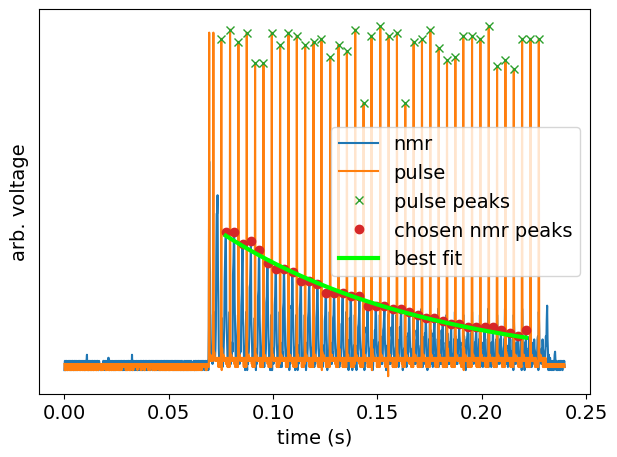

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 37
    # variables        = 2
    chi-square         = 12.5531468
    reduced chi-square = 0.35866134
    Akaike info crit   = -35.9950219
    Bayesian info crit = -32.7731861
[[Variables]]
    pre:  0.03762354 +/- 0.00106466 (2.83%) (init = 0.4)
    tau:  0.10125747 +/- 0.00235830 (2.33%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.960
[ 376  397  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  716  737  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile6.csv
signal stddev (V): [0.00066365 0.00087203 0.00102001 0.00074862 0.0011834  0.00087203
 0.00087203 0.00074862 0.00135662 0.00102001 0.00066365 0.00074862
 0.0011834  0.00087203 0.00074862 0.00087203 0.00087203 0.00087203
 0.000

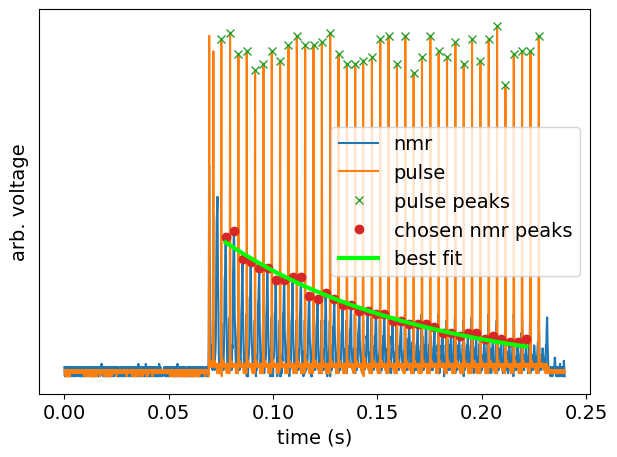

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 80
    # data points      = 37
    # variables        = 2
    chi-square         = 19.5130470
    reduced chi-square = 0.55751563
    Akaike info crit   = -19.6738799
    Bayesian info crit = -16.4520441
[[Variables]]
    pre:  0.03878832 +/- 0.00139677 (3.60%) (init = 0.4)
    tau:  0.09567867 +/- 0.00271627 (2.84%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.957
[ 376  397  417  437  457  477  497  517  537  557  577  597  616  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile7.csv
signal stddev (V): [0.00100093 0.00072241 0.00116699 0.00116699 0.00063393 0.00072241
 0.00100093 0.00072241 0.00072241 0.00134234 0.00072241 0.00072241
 0.00072241 0.00134234 0.00116699 0.00100093 0.00084963 0.00060156
 0.001

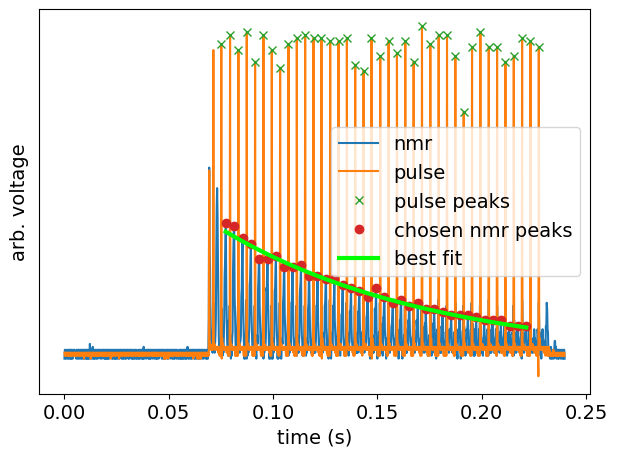

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 84
    # data points      = 37
    # variables        = 2
    chi-square         = 14.1577019
    reduced chi-square = 0.40450577
    Akaike info crit   = -31.5443879
    Bayesian info crit = -28.3225521
[[Variables]]
    pre:  0.03670489 +/- 0.00113321 (3.09%) (init = 0.4)
    tau:  0.10254920 +/- 0.00264053 (2.57%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.959
[ 376  397  417  437  457  477  497  517  537  557  577  597  616  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  956  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile8.csv
signal stddev (V): [0.0007037  0.00061253 0.00083378 0.00083378 0.00083378 0.00083378
 0.00115551 0.00098752 0.00083378 0.0007037  0.00098752 0.0007037
 0.00057896 0.00083378 0.00098752 0.0007037  0.00115551 0.00115551
 0.0008

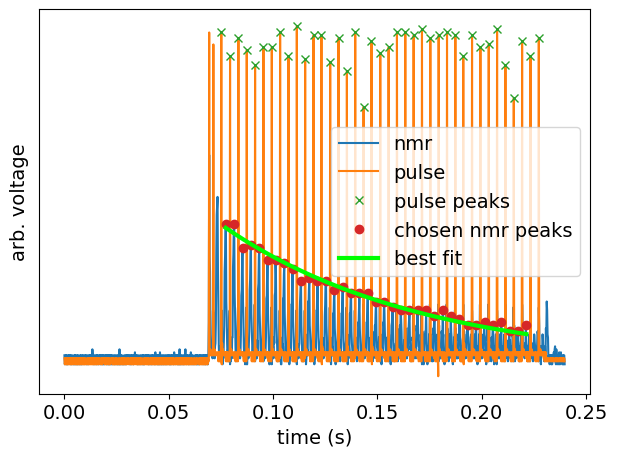

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 37
    # variables        = 2
    chi-square         = 17.3359125
    reduced chi-square = 0.49531179
    Akaike info crit   = -24.0510947
    Bayesian info crit = -20.8292589
[[Variables]]
    pre:  0.04099571 +/- 0.00125992 (3.07%) (init = 0.4)
    tau:  0.09557601 +/- 0.00237504 (2.48%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.957
[ 377  397  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  716  737  757  777  797  817  837  857  877  897  917
  937  956  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly84\NewFile9.csv
signal stddev (V): [0.00153319 0.00117927 0.00101522 0.00074207 0.00086641 0.00074207
 0.00117927 0.00117927 0.00065625 0.00101522 0.00135302 0.00117927
 0.00062503 0.00065625 0.00086641 0.00086641 0.00074207 0.00074207
 0.001

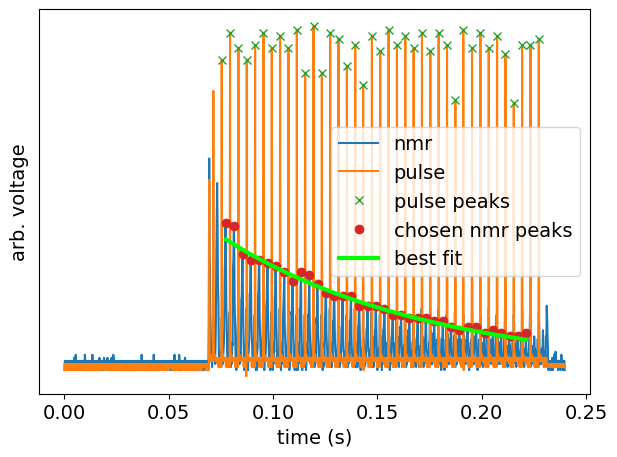

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 37
    # variables        = 2
    chi-square         = 14.5424742
    reduced chi-square = 0.41549926
    Akaike info crit   = -30.5522388
    Bayesian info crit = -27.3304030
[[Variables]]
    pre:  0.03725680 +/- 0.00131714 (3.54%) (init = 0.4)
    tau:  0.09889167 +/- 0.00272256 (2.75%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.962
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly86\\NewFile

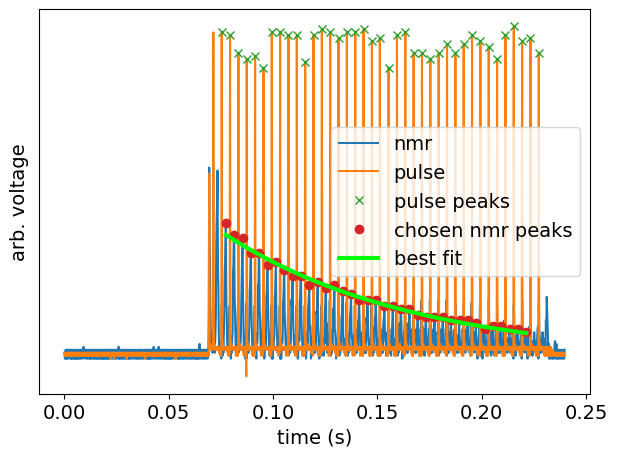

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 81
    # data points      = 37
    # variables        = 2
    chi-square         = 9.65073512
    reduced chi-square = 0.27573529
    Akaike info crit   = -45.7237014
    Bayesian info crit = -42.5018656
[[Variables]]
    pre:  0.03936396 +/- 0.00107779 (2.74%) (init = 0.4)
    tau:  0.09119024 +/- 0.00188547 (2.07%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.957
[ 377  397  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  716  737  757  777  797  817  837  857  877  897  917
  937  956  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly86\NewFile2.csv
signal stddev (V): [0.00066305 0.00101962 0.00118306 0.00135633 0.00063216 0.00118306
 0.00087157 0.00118306 0.00074808 0.00074808 0.00066305 0.00066305
 0.00074808 0.00101962 0.00101962 0.00066305 0.00087157 0.00118306
 0.000

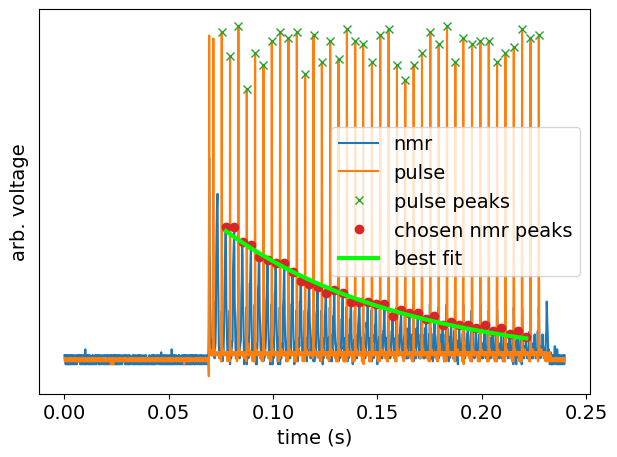

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 37
    # variables        = 2
    chi-square         = 12.4201319
    reduced chi-square = 0.35486091
    Akaike info crit   = -36.3891711
    Bayesian info crit = -33.1673353
[[Variables]]
    pre:  0.04296519 +/- 0.00129823 (3.02%) (init = 0.4)
    tau:  0.08795083 +/- 0.00195780 (2.23%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.960
[ 376  397  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  717  737  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly86\NewFile3.csv
signal stddev (V): [0.00073884 0.00101286 0.00135125 0.00135125 0.0006526  0.00073884
 0.00117723 0.00171636 0.00073884 0.0006526  0.00062119 0.00086364
 0.00117723 0.00101286 0.0006526  0.00086364 0.00101286 0.00101286
 0.000

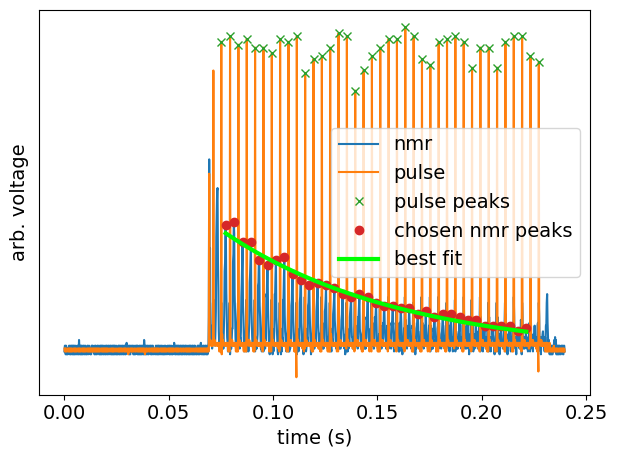

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 37
    # variables        = 2
    chi-square         = 20.5042205
    reduced chi-square = 0.58583487
    Akaike info crit   = -17.8406253
    Bayesian info crit = -14.6187894
[[Variables]]
    pre:  0.04152504 +/- 0.00173998 (4.19%) (init = 0.4)
    tau:  0.08593360 +/- 0.00257014 (2.99%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.960
[ 377  397  417  437  457  476  497  517  537  557  577  597  616  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly86\NewFile4.csv
signal stddev (V): [0.00072397 0.00100206 0.00072397 0.00063571 0.00063571 0.00085096
 0.00063571 0.00134318 0.00116796 0.00085096 0.00116796 0.00085096
 0.00072397 0.00116796 0.00085096 0.00063571 0.00116796 0.00134318
 0.001

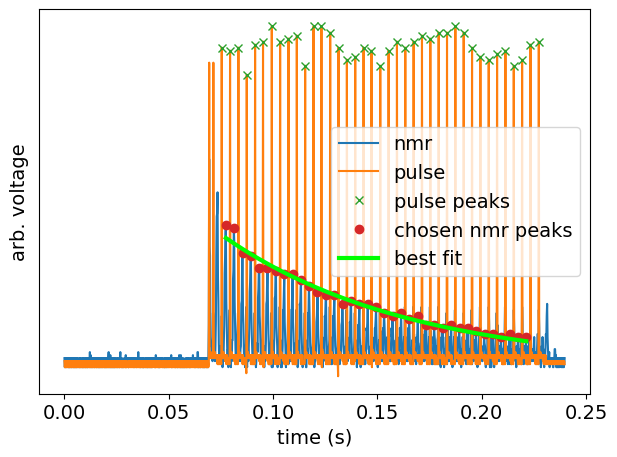

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 84
    # data points      = 37
    # variables        = 2
    chi-square         = 18.6468360
    reduced chi-square = 0.53276674
    Akaike info crit   = -21.3539330
    Bayesian info crit = -18.1320972
[[Variables]]
    pre:  0.04061014 +/- 0.00143253 (3.53%) (init = 0.4)
    tau:  0.08974846 +/- 0.00244800 (2.73%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.957
[ 377  396  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  716  737  757  777  797  817  837  857  877  897  917
  937  956  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly86\NewFile5.csv
signal stddev (V): [0.00116696 0.00100089 0.00100089 0.00063387 0.00084958 0.00100089
 0.00063387 0.00116696 0.00152374 0.00116696 0.00100089 0.00084958
 0.00116696 0.00134231 0.00100089 0.00084958 0.00100089 0.00084958
 0.000

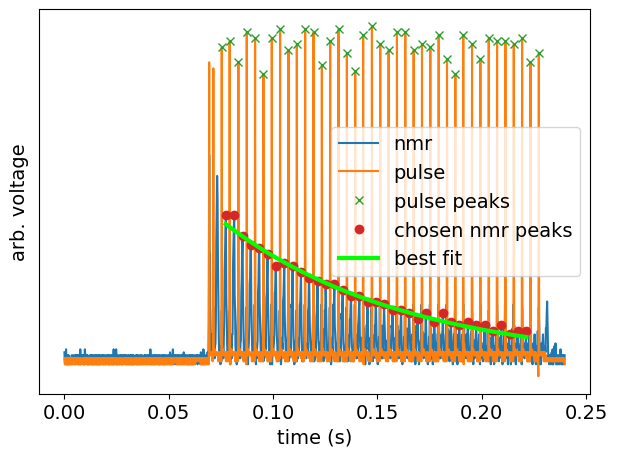

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 37
    # variables        = 2
    chi-square         = 14.0937002
    reduced chi-square = 0.40267715
    Akaike info crit   = -31.7120304
    Bayesian info crit = -28.4901946
[[Variables]]
    pre:  0.04518388 +/- 0.00146522 (3.24%) (init = 0.4)
    tau:  0.08797020 +/- 0.00209416 (2.38%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.958
[ 377  397  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  717  737  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly86\NewFile6.csv
signal stddev (V): [0.00100026 0.00084883 0.00134183 0.00084883 0.00084883 0.00072147
 0.00084883 0.00072147 0.00152333 0.00063287 0.00134183 0.00060043
 0.00116641 0.00100026 0.00084883 0.00072147 0.00100026 0.00084883
 0.000

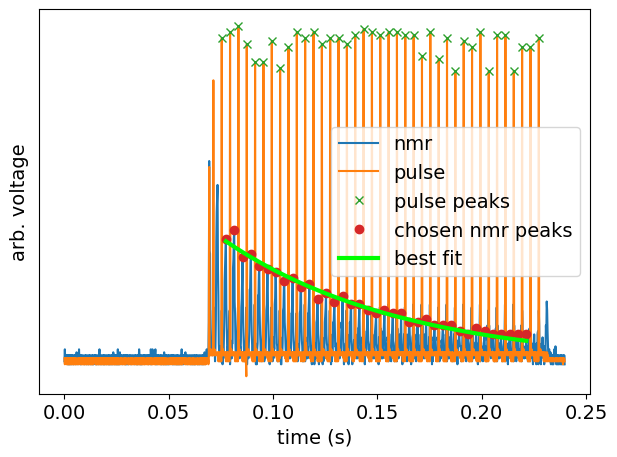

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 81
    # data points      = 37
    # variables        = 2
    chi-square         = 19.6559242
    reduced chi-square = 0.56159784
    Akaike info crit   = -19.4039479
    Bayesian info crit = -16.1821121
[[Variables]]
    pre:  0.04014862 +/- 0.00170887 (4.26%) (init = 0.4)
    tau:  0.08678026 +/- 0.00264671 (3.05%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.961
[ 376  397  417  437  457  477  497  517  537  557  577  597  616  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly86\NewFile7.csv
signal stddev (V): [0.00059058 0.00099438 0.00133745 0.00116137 0.00133745 0.00084189
 0.00099438 0.00133745 0.00151947 0.00116137 0.00071329 0.00084189
 0.00116137 0.00116137 0.00062352 0.00116137 0.00099438 0.00099438
 0.001

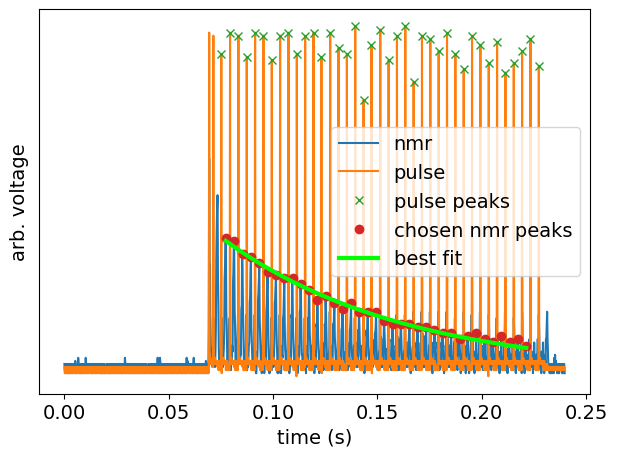

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 76
    # data points      = 37
    # variables        = 2
    chi-square         = 8.28679297
    reduced chi-square = 0.23676551
    Akaike info crit   = -51.3614303
    Bayesian info crit = -48.1395945
[[Variables]]
    pre:  0.04200292 +/- 0.00105011 (2.50%) (init = 0.4)
    tau:  0.08692903 +/- 0.00155589 (1.79%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.951
[ 377  396  417  437  457  477  497  517  537  557  577  597  617  637
  657  677  697  717  737  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly86\NewFile8.csv
signal stddev (V): [0.00075478 0.00102454 0.00102454 0.0011873  0.00102454 0.00153938
 0.00102454 0.00102454 0.00087732 0.00075478 0.00087732 0.00087732
 0.00087732 0.00064007 0.0011873  0.00087732 0.00102454 0.00102454
 0.000

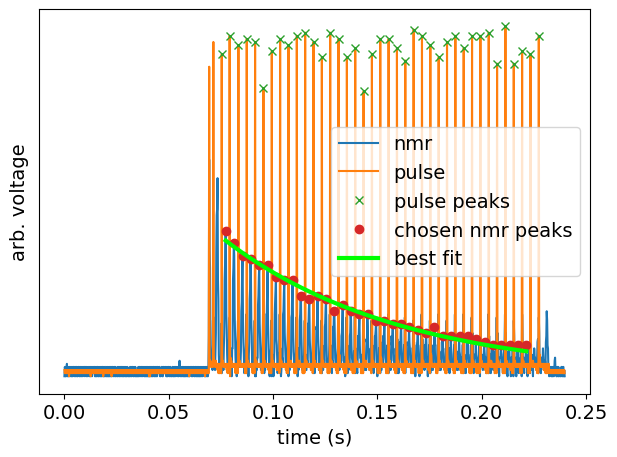

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 37
    # variables        = 2
    chi-square         = 13.3473339
    reduced chi-square = 0.38135240
    Akaike info crit   = -33.7252465
    Bayesian info crit = -30.5034107
[[Variables]]
    pre:  0.04348253 +/- 0.00154105 (3.54%) (init = 0.4)
    tau:  0.08509757 +/- 0.00214739 (2.52%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.959
[ 377  396  417  437  457  477  497  516  537  557  577  597  617  637
  657  677  697  717  736  757  777  797  817  837  857  877  897  917
  937  957  977  997 1017 1037 1057 1077 1097 1117 1137]
test: CarrPurc_P1-19_P2-38_tauVary\Gly86\NewFile9.csv
signal stddev (V): [0.00085948 0.00064708 0.00085948 0.0013486  0.0013486  0.00100931
 0.0006154  0.00117419 0.00100931 0.00085948 0.0006154  0.00064708
 0.00064708 0.00100931 0.00100931 0.00100931 0.00073397 0.00073397
 0.001

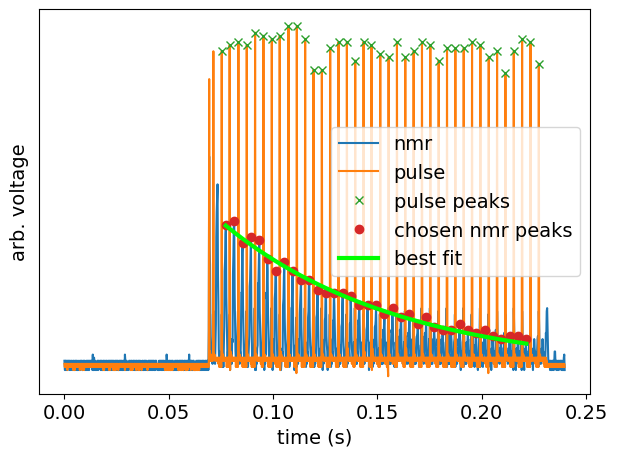

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 77
    # data points      = 37
    # variables        = 2
    chi-square         = 19.5827361
    reduced chi-square = 0.55950675
    Akaike info crit   = -19.5419731
    Bayesian info crit = -16.3201373
[[Variables]]
    pre:  0.04647857 +/- 0.00173736 (3.74%) (init = 0.4)
    tau:  0.08478010 +/- 0.00229287 (2.70%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.962
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly88\\NewFile

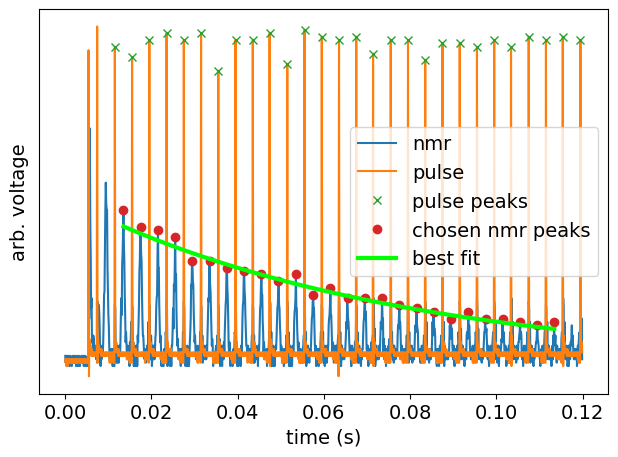

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 26
    # variables        = 2
    chi-square         = 13.6275364
    reduced chi-square = 0.56781402
    Akaike info crit   = -12.7961054
    Bayesian info crit = -10.2799123
[[Variables]]
    pre:  0.01966988 +/- 4.7279e-04 (2.40%) (init = 0.4)
    tau:  0.07543198 +/- 0.00277211 (3.67%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.878
[ 115  155  195  235  275  315  355  395  435  475  515  555  595  634
  675  715  754  795  835  874  915  954  995 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly88\NewFile2.csv
signal stddev (V): [0.00099993 0.00072101 0.00134158 0.00116613 0.00116613 0.00099993
 0.00059988 0.00072101 0.00116613 0.00072101 0.00084844 0.00072101
 0.00072101 0.00084844 0.00099993 0.00072101 0.00084844 0.00116613
 0.00084844 0.00084844 0.00084844 0.00084844 0.00072101 0.0007

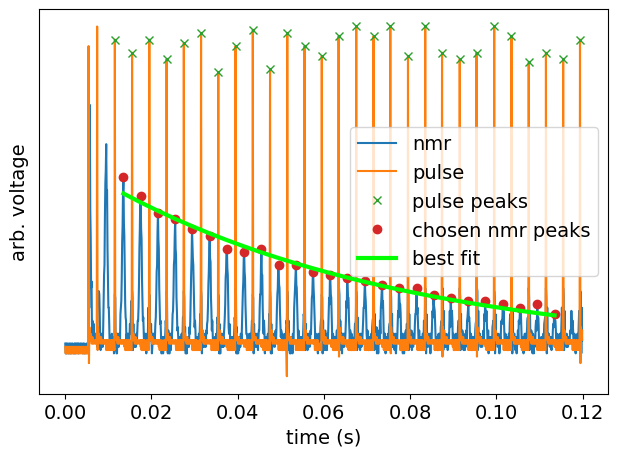

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 26
    # variables        = 2
    chi-square         = 14.3476595
    reduced chi-square = 0.59781914
    Akaike info crit   = -11.4572525
    Bayesian info crit = -8.94105943
[[Variables]]
    pre:  0.02374986 +/- 5.5567e-04 (2.34%) (init = 0.4)
    tau:  0.06958704 +/- 0.00225985 (3.25%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.869
[ 115  154  194  235  274  315  355  394  435  475  515  555  595  634
  675  715  754  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly88\NewFile3.csv
signal stddev (V): [0.00083096 0.00094366 0.00108189 0.00094366 0.00123713 0.00108189
 0.00083096 0.00083096 0.00083096 0.00094366 0.00140374 0.00123713
 0.00108189 0.00108189 0.00140374 0.00083096 0.00123713 0.00140374
 0.00123713 0.00094366 0.00094366 0.00094366 0.00083096 0.0008

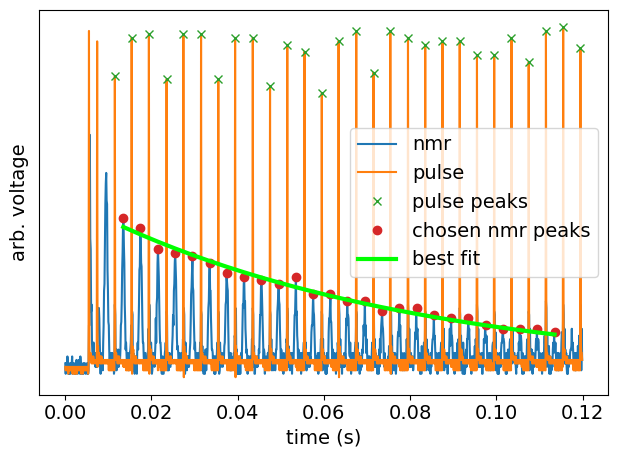

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 26
    # variables        = 2
    chi-square         = 6.67065175
    reduced chi-square = 0.27794382
    Akaike info crit   = -31.3698532
    Bayesian info crit = -28.8536601
[[Variables]]
    pre:  0.02025494 +/- 3.7575e-04 (1.86%) (init = 0.4)
    tau:  0.07582290 +/- 0.00221849 (2.93%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.845
[ 115  155  195  235  275  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  954  995 1035 1075 1115 1154 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly88\NewFile4.csv
signal stddev (V): [0.00063601 0.00100225 0.00063601 0.00072423 0.00085118 0.00134332
 0.00116812 0.00072423 0.00072423 0.00085118 0.00134332 0.00116812
 0.00063601 0.00072423 0.00100225 0.00100225 0.00116812 0.00072423
 0.00100225 0.00100225 0.00060375 0.00072423 0.00085118 0.0006

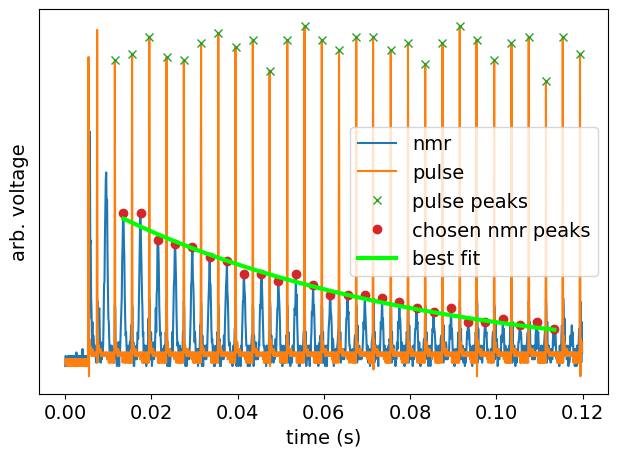

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 32
    # data points      = 26
    # variables        = 2
    chi-square         = 11.4622254
    reduced chi-square = 0.47759273
    Akaike info crit   = -17.2950310
    Bayesian info crit = -14.7788379
[[Variables]]
    pre:  0.02098192 +/- 4.0222e-04 (1.92%) (init = 0.4)
    tau:  0.07132849 +/- 0.00205251 (2.88%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.832
[ 115  155  195  235  275  315  355  395  435  475  515  555  595  635
  675  715  755  794  835  875  915  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly88\NewFile5.csv
signal stddev (V): [0.00132096 0.00081544 0.00068186 0.00114234 0.00068186 0.00068186
 0.00081544 0.00058732 0.00055221 0.00081544 0.00081544 0.00150497
 0.00081544 0.00068186 0.00097208 0.00114234 0.00097208 0.00081544
 0.00097208 0.00068186 0.00097208 0.00114234 0.00068186 0.0006

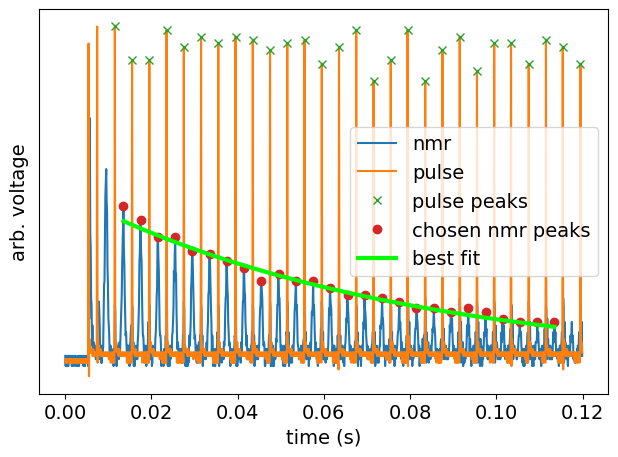

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 39
    # data points      = 26
    # variables        = 2
    chi-square         = 11.1890258
    reduced chi-square = 0.46620941
    Akaike info crit   = -17.9222400
    Bayesian info crit = -15.4060470
[[Variables]]
    pre:  0.02037361 +/- 4.3729e-04 (2.15%) (init = 0.4)
    tau:  0.07649747 +/- 0.00256246 (3.35%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.876
[ 115  154  195  235  274  315  355  394  435  474  514  555  595  635
  675  714  755  795  835  875  915  954  995 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly88\NewFile6.csv
signal stddev (V): [0.00109398 0.00084664 0.00109398 0.0009575  0.00074619 0.00124772
 0.0009575  0.00077253 0.00084664 0.00124772 0.0009575  0.0009575
 0.00124772 0.00084664 0.00124772 0.00084664 0.00141308 0.00109398
 0.00124772 0.0009575  0.00109398 0.00074619 0.00084664 0.00109

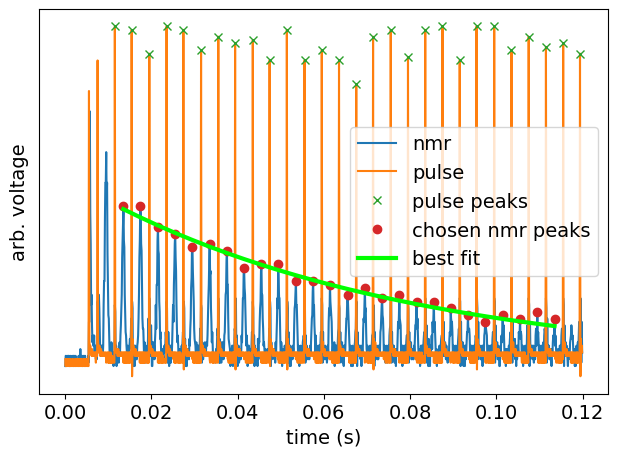

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 40
    # data points      = 26
    # variables        = 2
    chi-square         = 11.2864644
    reduced chi-square = 0.47026935
    Akaike info crit   = -17.6968015
    Bayesian info crit = -15.1806085
[[Variables]]
    pre:  0.02222338 +/- 5.1559e-04 (2.32%) (init = 0.4)
    tau:  0.07313586 +/- 0.00262691 (3.59%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.861
[ 115  155  195  235  275  315  355  395  435  475  515  555  595  635
  675  715  755  794  835  875  915  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly88\NewFile7.csv
signal stddev (V): [0.00083096 0.00090028 0.00083096 0.00090028 0.00144585 0.00144585
 0.00090028 0.00080653 0.00083096 0.0016157  0.001136   0.00100523
 0.00100523 0.00128472 0.00090028 0.00128472 0.00090028 0.00128472
 0.00090028 0.00100523 0.00090028 0.001136   0.00090028 0.0008

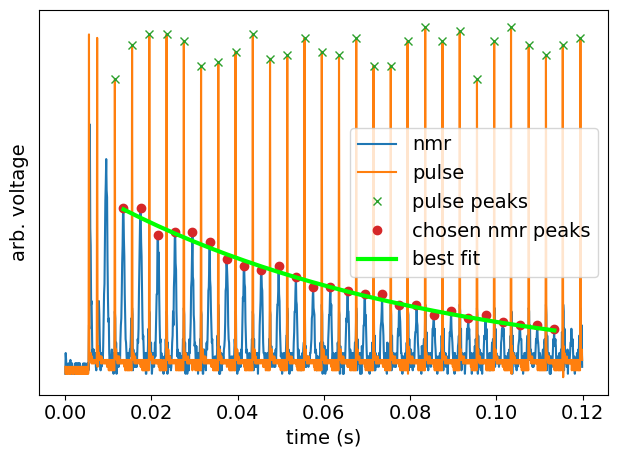

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 26
    # variables        = 2
    chi-square         = 7.36613637
    reduced chi-square = 0.30692235
    Akaike info crit   = -28.7912834
    Bayesian info crit = -26.2750903
[[Variables]]
    pre:  0.02274121 +/- 3.8576e-04 (1.70%) (init = 0.4)
    tau:  0.07496422 +/- 0.00200625 (2.68%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.840
[ 115  154  195  235  274  315  355  394  435  474  514  555  595  634
  675  714  754  795  835  875  915  954  994 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly88\NewFile8.csv
signal stddev (V): [0.00087858 0.00111889 0.00098585 0.00126961 0.00098585 0.00080741
 0.00111889 0.00078224 0.00111889 0.00080741 0.00098585 0.00098585
 0.00080741 0.00111889 0.00111889 0.00080741 0.00087858 0.00078224
 0.00098585 0.00098585 0.00078224 0.00098585 0.00080741 0.0008

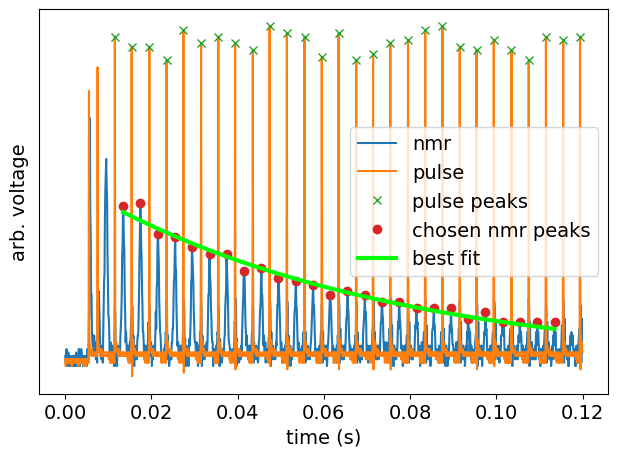

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 26
    # variables        = 2
    chi-square         = 10.6130710
    reduced chi-square = 0.44221129
    Akaike info crit   = -19.2962647
    Bayesian info crit = -16.7800716
[[Variables]]
    pre:  0.02194713 +/- 5.0562e-04 (2.30%) (init = 0.4)
    tau:  0.07038424 +/- 0.00229999 (3.27%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.860
[ 115  154  195  234  274  315  355  394  435  474  514  555  595  634
  675  714  755  795  835  875  915  954  994 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly88\NewFile9.csv
signal stddev (V): [0.00084611 0.00084611 0.00062921 0.00116443 0.00062921 0.00084611
 0.00084611 0.00116443 0.00071826 0.0017076  0.00059658 0.00059658
 0.00084611 0.00062921 0.00084611 0.00084611 0.00116443 0.00116443
 0.00099795 0.00099795 0.00071826 0.00084611 0.00062921 0.0009

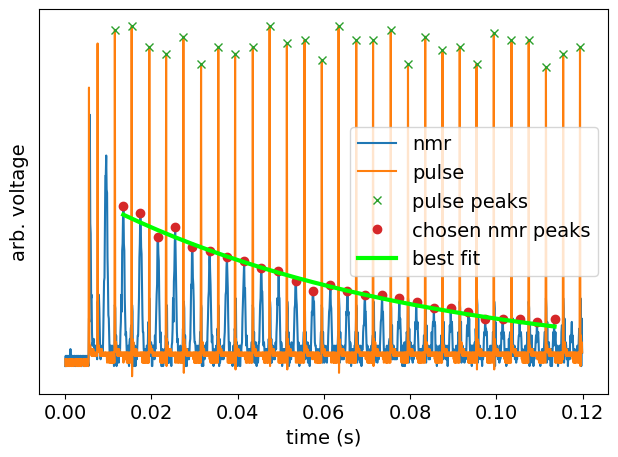

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 26
    # variables        = 2
    chi-square         = 12.1704391
    reduced chi-square = 0.50710163
    Akaike info crit   = -15.7362503
    Bayesian info crit = -13.2200572
[[Variables]]
    pre:  0.02136328 +/- 4.4087e-04 (2.06%) (init = 0.4)
    tau:  0.07447818 +/- 0.00239420 (3.21%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.862
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFile10.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly90\\NewFil

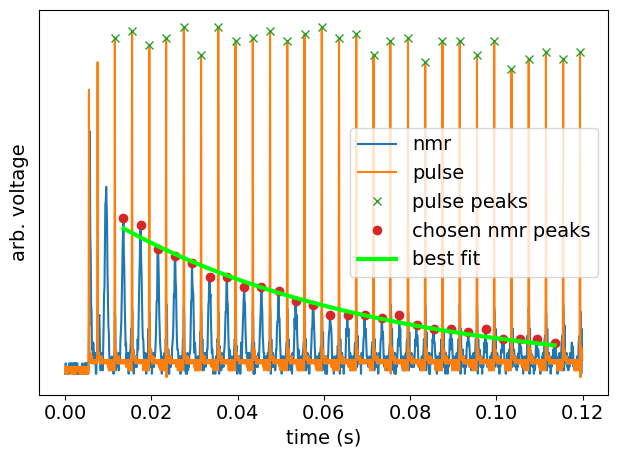

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 26
    # variables        = 2
    chi-square         = 17.2379604
    reduced chi-square = 0.71824835
    Akaike info crit   = -6.68554722
    Bayesian info crit = -4.16935414
[[Variables]]
    pre:  0.02092476 +/- 4.8423e-04 (2.31%) (init = 0.4)
    tau:  0.06138061 +/- 0.00193580 (3.15%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.850
[ 115  155  195  235  275  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  954  994 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile10.csv
signal stddev (V): [0.00130476 0.00112357 0.00064992 0.00051225 0.00078892 0.00149077
 0.00078892 0.00051225 0.00094995 0.00094995 0.00054991 0.00064992
 0.00130476 0.00051225 0.00094995 0.00078892 0.00130476 0.00078892
 0.00054991 0.00094995 0.00064992 0.00078892 0.00054991 0.000

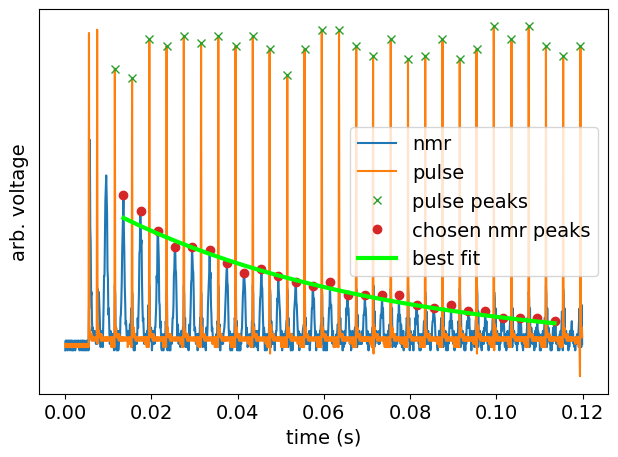

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 40
    # data points      = 26
    # variables        = 2
    chi-square         = 16.8752454
    reduced chi-square = 0.70313522
    Akaike info crit   = -7.23846781
    Bayesian info crit = -4.72227473
[[Variables]]
    pre:  0.02026156 +/- 5.5612e-04 (2.74%) (init = 0.4)
    tau:  0.06298869 +/- 0.00222587 (3.53%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.871
[ 115  155  195  235  275  315  355  395  435  475  515  555  595  635
  675  715  754  795  835  875  915  954  995 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile2.csv
signal stddev (V): [0.00154016 0.00064195 0.00067238 0.00067238 0.00118832 0.00075637
 0.00067238 0.00118832 0.00064195 0.00067238 0.00087869 0.00087869
 0.00118832 0.00067238 0.00075637 0.00102572 0.00102572 0.00087869
 0.00087869 0.00087869 0.00075637 0.00067238 0.00067238 0.0010

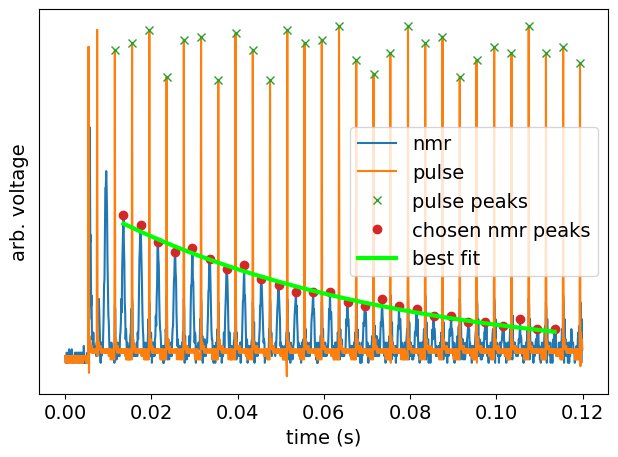

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 40
    # data points      = 26
    # variables        = 2
    chi-square         = 8.47732554
    reduced chi-square = 0.35322190
    Akaike info crit   = -25.1382396
    Bayesian info crit = -22.6220465
[[Variables]]
    pre:  0.02027082 +/- 3.8569e-04 (1.90%) (init = 0.4)
    tau:  0.06667543 +/- 0.00180884 (2.71%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.859
[ 115  155  195  235  275  315  355  395  435  475  514  555  595  635
  675  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile3.csv
signal stddev (V): [0.00075561 0.00075561 0.00102516 0.00102516 0.00067152 0.00118783
 0.00067152 0.00064105 0.00087803 0.00087803 0.00087803 0.00067152
 0.00118783 0.00118783 0.00064105 0.00102516 0.00087803 0.00087803
 0.00075561 0.00067152 0.00075561 0.00064105 0.00075561 0.0007

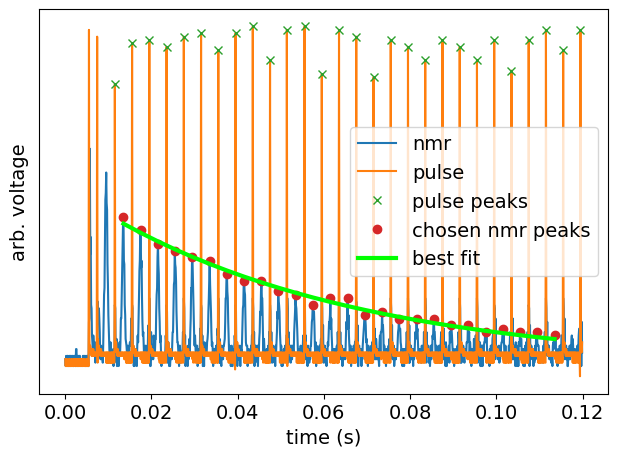

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 26
    # variables        = 2
    chi-square         = 9.03893130
    reduced chi-square = 0.37662214
    Akaike info crit   = -23.4704453
    Bayesian info crit = -20.9542523
[[Variables]]
    pre:  0.02099408 +/- 4.2015e-04 (2.00%) (init = 0.4)
    tau:  0.06013502 +/- 0.00158467 (2.64%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.849
[ 115  155  195  234  275  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  954  995 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile4.csv
signal stddev (V): [0.00128317 0.00100326 0.00113425 0.00089807 0.00144448 0.00100326
 0.00128317 0.00082857 0.00144448 0.00113425 0.00144448 0.00089807
 0.00089807 0.00100326 0.00100326 0.00128317 0.00100326 0.00128317
 0.00089807 0.00100326 0.00089807 0.00082857 0.00089807 0.0011

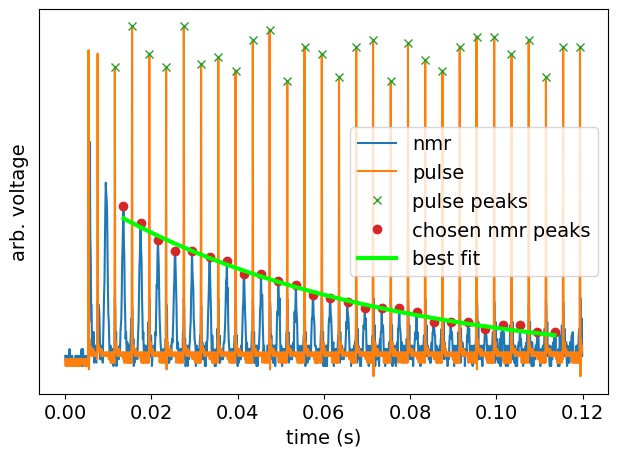

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 26
    # variables        = 2
    chi-square         = 4.84354075
    reduced chi-square = 0.20181420
    Akaike info crit   = -39.6917136
    Bayesian info crit = -37.1755205
[[Variables]]
    pre:  0.02148676 +/- 3.9923e-04 (1.86%) (init = 0.4)
    tau:  0.06385778 +/- 0.00155728 (2.44%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.855
[ 115  154  195  234  275  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  954  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile5.csv
signal stddev (V): [0.00070545 0.00081096 0.0009261  0.00081096 0.00106661 0.00122379
 0.00122379 0.00073326 0.00081096 0.00174862 0.0009261  0.00106661
 0.00073326 0.001392   0.0009261  0.00106661 0.001392   0.00122379
 0.00073326 0.00081096 0.00122379 0.0009261  0.00081096 0.0010

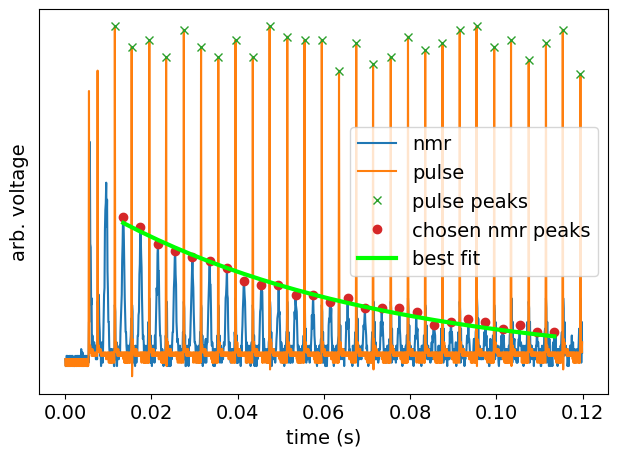

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 57
    # data points      = 26
    # variables        = 2
    chi-square         = 8.30549565
    reduced chi-square = 0.34606232
    Akaike info crit   = -25.6706570
    Bayesian info crit = -23.1544639
[[Variables]]
    pre:  0.02083193 +/- 4.0702e-04 (1.95%) (init = 0.4)
    tau:  0.06356671 +/- 0.00181405 (2.85%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.830
[ 115  155  194  234  275  315  355  395  435  475  515  554  595  635
  674  715  755  794  835  875  915  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile6.csv
signal stddev (V): [0.0009256  0.0009256  0.00106617 0.00081039 0.00081039 0.00174835
 0.00073262 0.00081039 0.00073262 0.00106617 0.00122341 0.00122341
 0.00073262 0.0009256  0.0009256  0.0009256  0.00139166 0.00081039
 0.0009256  0.00106617 0.00106617 0.00081039 0.00073262 0.0008

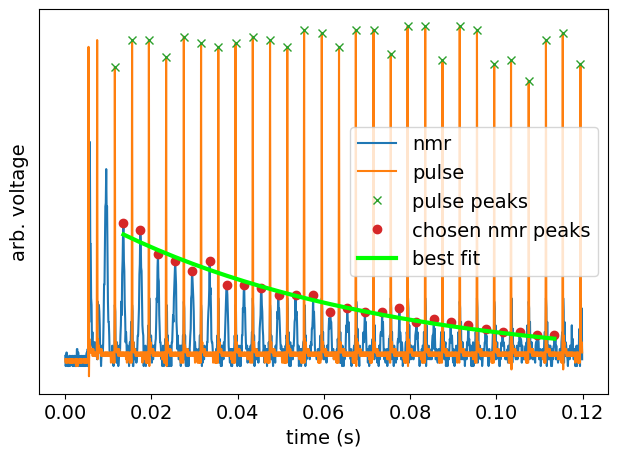

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 32
    # data points      = 26
    # variables        = 2
    chi-square         = 12.7724615
    reduced chi-square = 0.53218590
    Akaike info crit   = -14.4809334
    Bayesian info crit = -11.9647403
[[Variables]]
    pre:  0.01915884 +/- 5.5045e-04 (2.87%) (init = 0.4)
    tau:  0.06365894 +/- 0.00249100 (3.91%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.853
[ 115  154  195  235  274  315  355  394  435  475  515  555  595  634
  675  715  754  794  835  875  914  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile7.csv
signal stddev (V): [0.00113839 0.00067523 0.00067523 0.00096744 0.000544   0.00067523
 0.0005796  0.0005796  0.00067523 0.00096744 0.00096744 0.0008099
 0.0005796  0.00096744 0.00096744 0.0008099  0.0008099  0.0005796
 0.0008099  0.0005796  0.0008099  0.00113839 0.0005796  0.000579

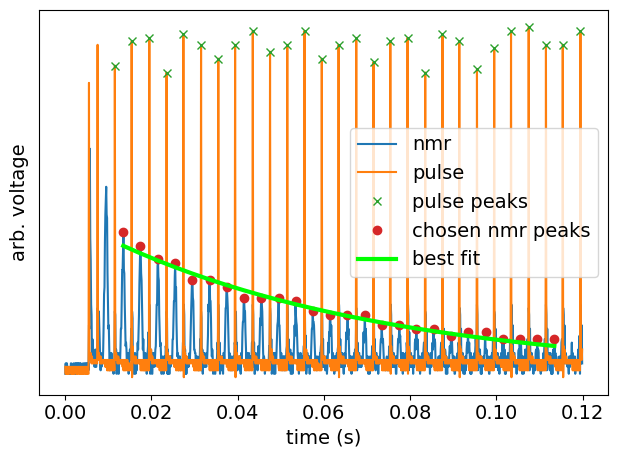

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 40
    # data points      = 26
    # variables        = 2
    chi-square         = 12.6181073
    reduced chi-square = 0.52575447
    Akaike info crit   = -14.7970554
    Bayesian info crit = -12.2808623
[[Variables]]
    pre:  0.01815735 +/- 4.4695e-04 (2.46%) (init = 0.4)
    tau:  0.06545823 +/- 0.00226761 (3.46%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.868
[ 115  155  195  234  275  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  954  995 1035 1075 1115 1154 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile8.csv
signal stddev (V): [0.000541   0.00080788 0.00067281 0.00131631 0.00131631 0.00131631
 0.000541   0.00067281 0.00096575 0.00113696 0.00150089 0.00096575
 0.00067281 0.00096575 0.00057678 0.000541   0.00096575 0.00113696
 0.000541   0.00067281 0.00080788 0.00096575 0.00080788 0.0005

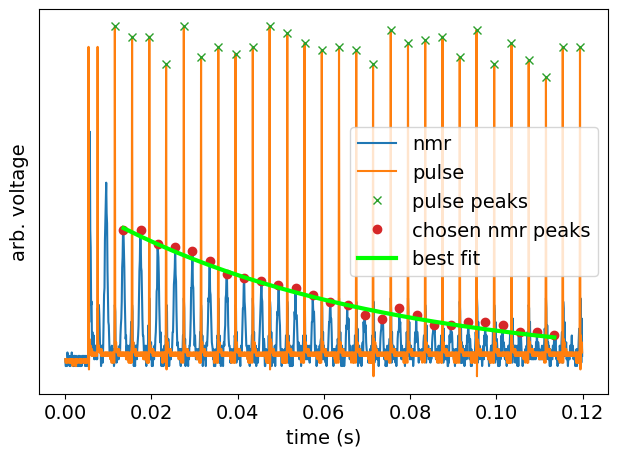

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 26
    # variables        = 2
    chi-square         = 10.3854159
    reduced chi-square = 0.43272566
    Akaike info crit   = -19.8600449
    Bayesian info crit = -17.3438518
[[Variables]]
    pre:  0.02010102 +/- 3.8103e-04 (1.90%) (init = 0.4)
    tau:  0.06356729 +/- 0.00166731 (2.62%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.825
[ 115  154  195  235  274  315  355  395  435  475  515  555  595  635
  675  714  755  795  835  875  915  954  995 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly90\NewFile9.csv
signal stddev (V): [0.00114302 0.00068301 0.00055362 0.00114302 0.00081639 0.00081639
 0.00081639 0.00081639 0.00081639 0.00055362 0.00081639 0.00081639
 0.00068301 0.00081639 0.00081639 0.00097288 0.00058864 0.00114302
 0.00068301 0.00058864 0.00055362 0.00058864 0.00058864 0.0006

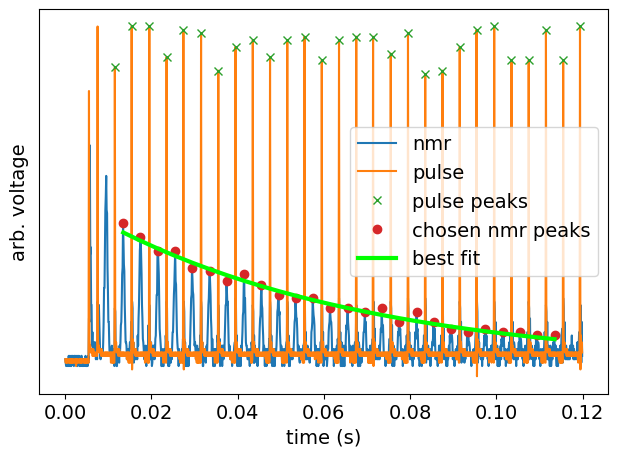

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 26
    # variables        = 2
    chi-square         = 9.42205296
    reduced chi-square = 0.39258554
    Akaike info crit   = -22.3911320
    Bayesian info crit = -19.8749389
[[Variables]]
    pre:  0.01952157 +/- 3.9764e-04 (2.04%) (init = 0.4)
    tau:  0.06239072 +/- 0.00163424 (2.62%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.853
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly91\\NewFile

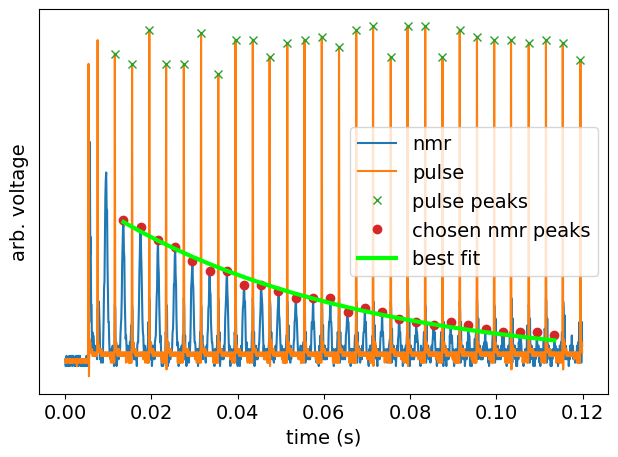

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 26
    # variables        = 2
    chi-square         = 11.2051095
    reduced chi-square = 0.46687956
    Akaike info crit   = -17.8848931
    Bayesian info crit = -15.3687000
[[Variables]]
    pre:  0.02140812 +/- 3.8362e-04 (1.79%) (init = 0.4)
    tau:  0.05802442 +/- 0.00142929 (2.46%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.834
[ 115  154  195  234  274  315  355  394  435  474  515  555  595  635
  675  715  754  795  835  874  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly91\NewFile2.csv
signal stddev (V): [0.00054763 0.00054763 0.00112245 0.00054763 0.00094863 0.00078734
 0.00054763 0.00112245 0.00078734 0.00094863 0.00094863 0.00078734
 0.00078734 0.000648   0.00050981 0.000648   0.000648   0.00078734
 0.000648   0.00050981 0.000648   0.00054763 0.000648   0.0005

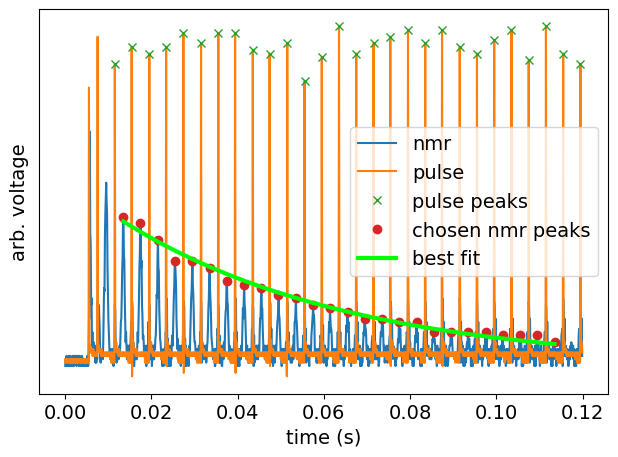

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 52
    # data points      = 26
    # variables        = 2
    chi-square         = 17.3382672
    reduced chi-square = 0.72242780
    Akaike info crit   = -6.53469313
    Bayesian info crit = -4.01850005
[[Variables]]
    pre:  0.02194875 +/- 4.8257e-04 (2.20%) (init = 0.4)
    tau:  0.05313793 +/- 0.00148983 (2.80%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.822
[ 115  154  195  234  274  315  355  394  435  474  515  555  595  635
  675  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly91\NewFile3.csv
signal stddev (V): [0.00066944 0.0009634  0.00066944 0.0009634  0.00080508 0.00066944
 0.00066944 0.00131459 0.00113497 0.0009634  0.00057284 0.00066944
 0.00066944 0.0009634  0.00113497 0.00066944 0.00066944 0.00080508
 0.00080508 0.00080508 0.00080508 0.00080508 0.00066944 0.0008

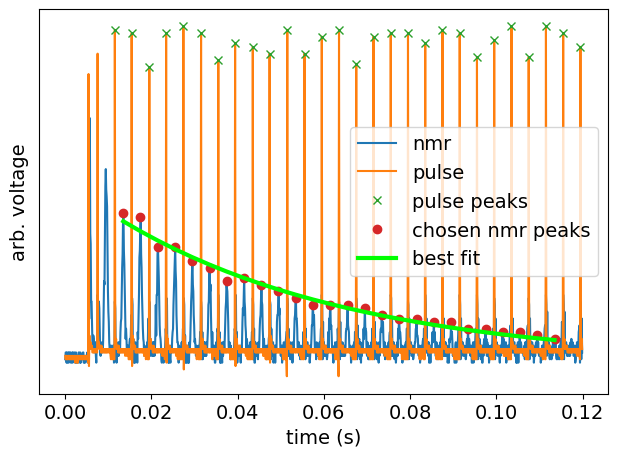

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 26
    # variables        = 2
    chi-square         = 14.0979800
    reduced chi-square = 0.58741583
    Akaike info crit   = -11.9136904
    Bayesian info crit = -9.39749735
[[Variables]]
    pre:  0.02131047 +/- 5.2591e-04 (2.47%) (init = 0.4)
    tau:  0.05459392 +/- 0.00170704 (3.13%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.845
[ 115  155  195  234  274  315  355  394  435  474  514  555  595  635
  675  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly91\NewFile4.csv
signal stddev (V): [0.00062949 0.00084632 0.00116458 0.00062949 0.00062949 0.00084632
 0.00099812 0.00099812 0.00099812 0.00084632 0.00134024 0.00084632
 0.00084632 0.00071851 0.00062949 0.00071851 0.00071851 0.00099812
 0.00099812 0.00084632 0.00099812 0.00062949 0.00071851 0.0006

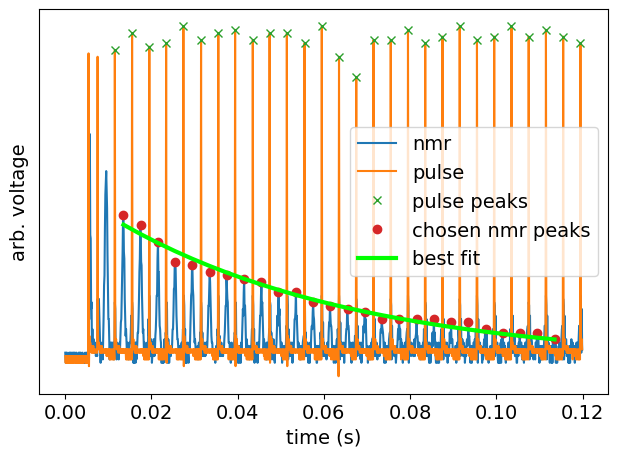

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 54
    # data points      = 26
    # variables        = 2
    chi-square         = 15.6674555
    reduced chi-square = 0.65281064
    Akaike info crit   = -9.16928282
    Bayesian info crit = -6.65308975
[[Variables]]
    pre:  0.02088189 +/- 5.3318e-04 (2.55%) (init = 0.4)
    tau:  0.05626521 +/- 0.00189482 (3.37%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.833
[ 115  154  195  235  274  315  355  394  435  475  514  555  595  635
  675  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly91\NewFile5.csv
signal stddev (V): [0.00052606 0.00095746 0.00095746 0.00079796 0.00066086 0.00079796
 0.00079796 0.00056279 0.00066086 0.00052606 0.00079796 0.00079796
 0.00095746 0.00056279 0.00066086 0.00052606 0.00079796 0.00079796
 0.00079796 0.00066086 0.00056279 0.00079796 0.00079796 0.0005

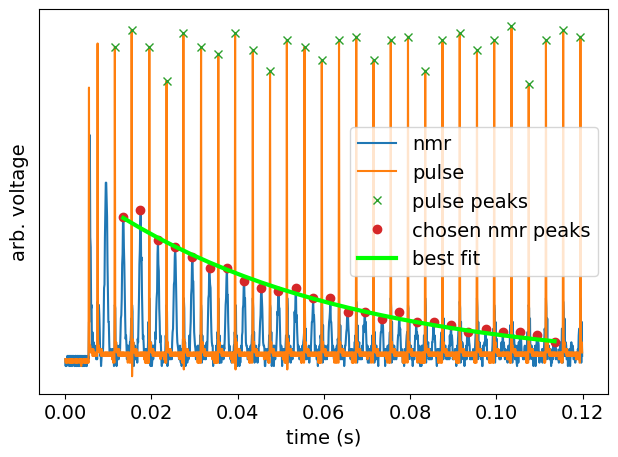

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 30
    # data points      = 26
    # variables        = 2
    chi-square         = 15.0666138
    reduced chi-square = 0.62777558
    Akaike info crit   = -10.1859964
    Bayesian info crit = -7.66980333
[[Variables]]
    pre:  0.02218699 +/- 4.8353e-04 (2.18%) (init = 0.4)
    tau:  0.05596935 +/- 0.00154405 (2.76%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.846
[ 115  155  195  234  275  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly91\NewFile6.csv
signal stddev (V): [0.00096146 0.00056957 0.00149814 0.00066664 0.00066664 0.00131317
 0.00113332 0.00096146 0.00053331 0.00131317 0.00096146 0.00131317
 0.00080275 0.00096146 0.00056957 0.00096146 0.00080275 0.00096146
 0.00066664 0.00080275 0.00096146 0.00080275 0.00080275 0.0006

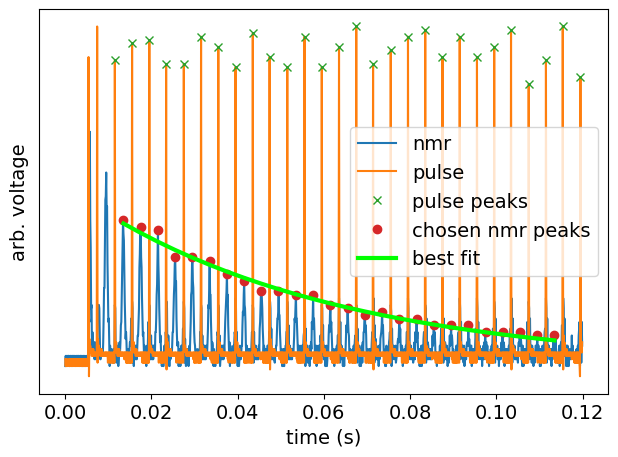

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 36
    # data points      = 26
    # variables        = 2
    chi-square         = 11.1663049
    reduced chi-square = 0.46526270
    Akaike info crit   = -17.9750904
    Bayesian info crit = -15.4588974
[[Variables]]
    pre:  0.02116636 +/- 4.6429e-04 (2.19%) (init = 0.4)
    tau:  0.05832255 +/- 0.00169270 (2.90%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.843
[ 115  154  195  235  274  315  355  394  435  475  514  555  595  635
  675  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly91\NewFile7.csv
signal stddev (V): [0.00064602 0.00050729 0.00064602 0.00094728 0.00094728 0.00064602
 0.00064602 0.00064602 0.00112131 0.00054529 0.00130282 0.00148907
 0.00064602 0.00094728 0.00054529 0.00064602 0.00094728 0.00094728
 0.00078571 0.00078571 0.00054529 0.00078571 0.00054529 0.0007

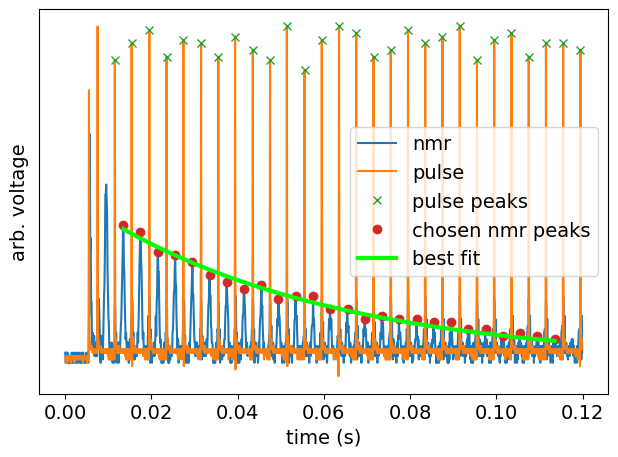

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 58
    # data points      = 26
    # variables        = 2
    chi-square         = 14.7150361
    reduced chi-square = 0.61312650
    Akaike info crit   = -10.7998943
    Bayesian info crit = -8.28370121
[[Variables]]
    pre:  0.02028312 +/- 4.5276e-04 (2.23%) (init = 0.4)
    tau:  0.05524074 +/- 0.00165241 (2.99%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.831
[ 115  154  195  235  274  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly91\NewFile8.csv
signal stddev (V): [0.00066573 0.00066573 0.000802   0.00096083 0.00131271 0.00056851
 0.00096083 0.00056851 0.00168618 0.000802   0.00113278 0.000802
 0.00096083 0.000802   0.00056851 0.000802   0.000802   0.00096083
 0.00056851 0.00066573 0.000802   0.000802   0.00056851 0.000665

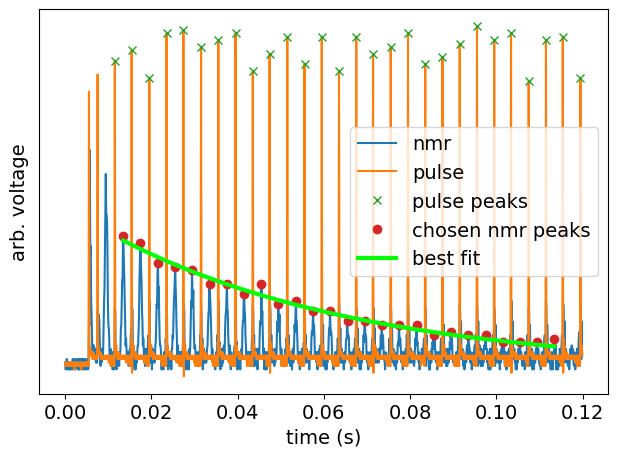

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 61
    # data points      = 26
    # variables        = 2
    chi-square         = 10.2994092
    reduced chi-square = 0.42914205
    Akaike info crit   = -20.0762602
    Bayesian info crit = -17.5600671
[[Variables]]
    pre:  0.01895734 +/- 4.1388e-04 (2.18%) (init = 0.4)
    tau:  0.05800074 +/- 0.00165253 (2.85%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.835
[ 115  154  195  235  274  315  355  395  435  475  515  555  595  635
  674  715  755  794  835  875  914  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly91\NewFile9.csv
signal stddev (V): [0.00058924 0.00058924 0.00058924 0.00068352 0.00068352 0.00097324
 0.00114333 0.00081682 0.00081682 0.00081682 0.00081682 0.00068352
 0.00097324 0.00097324 0.00097324 0.00081682 0.00097324 0.00081682
 0.00058924 0.00068352 0.00068352 0.00058924 0.00081682 0.0005

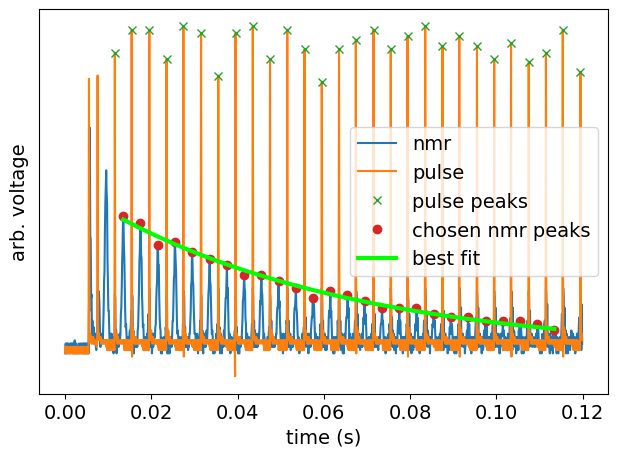

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 54
    # data points      = 26
    # variables        = 2
    chi-square         = 10.4651578
    reduced chi-square = 0.43604824
    Akaike info crit   = -19.6611727
    Bayesian info crit = -17.1449796
[[Variables]]
    pre:  0.02057328 +/- 3.6455e-04 (1.77%) (init = 0.4)
    tau:  0.05888089 +/- 0.00148499 (2.52%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.818
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly92\\NewFile

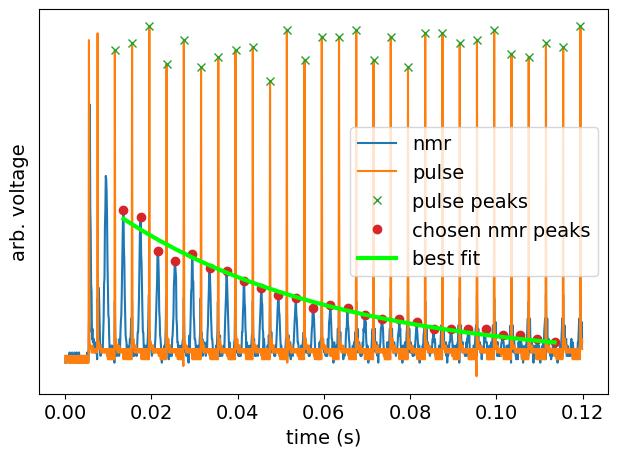

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 32
    # data points      = 26
    # variables        = 2
    chi-square         = 21.3920985
    reduced chi-square = 0.89133744
    Akaike info crit   = -1.07194771
    Bayesian info crit = 1.44424537
[[Variables]]
    pre:  0.02207025 +/- 6.2494e-04 (2.83%) (init = 0.4)
    tau:  0.05103818 +/- 0.00179460 (3.52%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.856
[ 115  155  195  235  275  315  355  395  435  475  515  555  595  635
  675  715  754  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly92\NewFile2.csv
signal stddev (V): [0.00064105 0.00064105 0.00100546 0.00064105 0.00085495 0.00100546
 0.00064105 0.00100546 0.00085495 0.00072866 0.00085495 0.00060905
 0.00064105 0.00100546 0.00064105 0.00085495 0.00064105 0.00072866
 0.00064105 0.00072866 0.00072866 0.00072866 0.00072866 0.00064

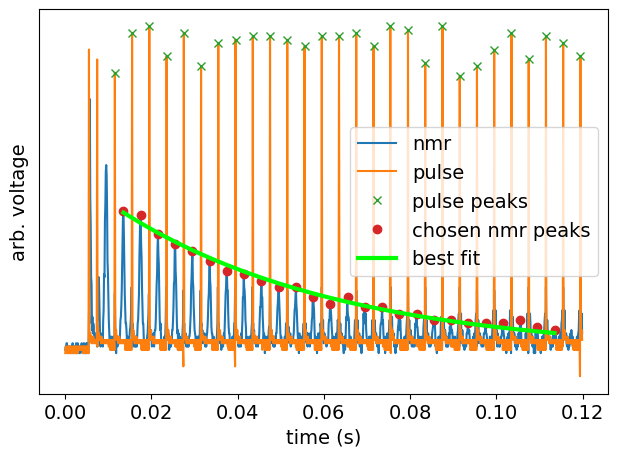

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 57
    # data points      = 26
    # variables        = 2
    chi-square         = 12.1947974
    reduced chi-square = 0.50811656
    Akaike info crit   = -15.6842651
    Bayesian info crit = -13.1680721
[[Variables]]
    pre:  0.02215546 +/- 4.7490e-04 (2.14%) (init = 0.4)
    tau:  0.05141090 +/- 0.00136897 (2.66%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.837
[ 115  155  195  235  275  315  355  395  435  475  514  555  595  635
  675  714  754  795  835  875  915  954  995 1035 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly92\NewFile3.csv
signal stddev (V): [0.00154963 0.00066434 0.00069379 0.00069379 0.00077546 0.00089518
 0.00089518 0.00066434 0.00069379 0.00077546 0.00069379 0.00077546
 0.00066434 0.00077546 0.00069379 0.00077546 0.00077546 0.00077546
 0.00066434 0.00069379 0.00069379 0.00077546 0.00077546 0.0007

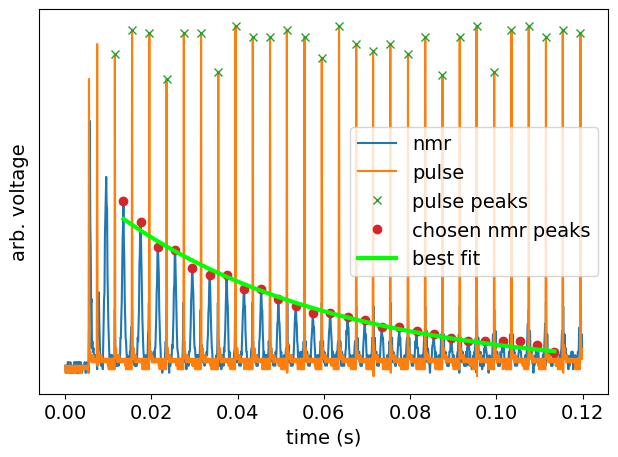

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 40
    # data points      = 26
    # variables        = 2
    chi-square         = 10.4421490
    reduced chi-square = 0.43508954
    Akaike info crit   = -19.7183995
    Bayesian info crit = -17.2022064
[[Variables]]
    pre:  0.02294898 +/- 5.1323e-04 (2.24%) (init = 0.4)
    tau:  0.05073505 +/- 0.00133609 (2.63%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.867
[ 115  155  195  234  275  315  355  395  435  474  515  555  595  635
  675  714  755  794  835  875  915  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly92\NewFile4.csv
signal stddev (V): [0.0006     0.0006     0.00082462 0.0006     0.00069282 0.0006
 0.00082462 0.0006     0.0009798  0.00082462 0.0006     0.0006
 0.00069282 0.00082462 0.00069282 0.00056569 0.0006     0.0006
 0.0009798  0.0006     0.00069282 0.0006     0.00069282 0.00069282
 0.0006

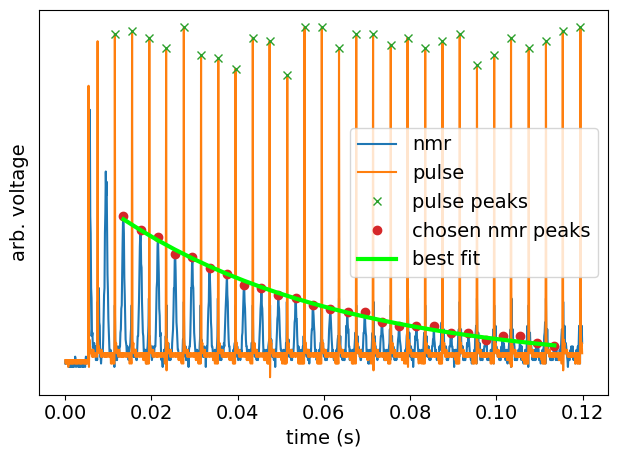

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 26
    # variables        = 2
    chi-square         = 5.06149529
    reduced chi-square = 0.21089564
    Akaike info crit   = -38.5472992
    Bayesian info crit = -36.0311062
[[Variables]]
    pre:  0.02233466 +/- 2.7766e-04 (1.24%) (init = 0.4)
    tau:  0.05197105 +/- 8.1648e-04 (1.57%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.843
[ 115  154  195  234  275  315  355  395  435  474  515  554  595  635
  674  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly92\NewFile5.csv
signal stddev (V): [0.00058619 0.00115914 0.00070966 0.00061937 0.00061937 0.00083882
 0.00058619 0.00058619 0.00058619 0.00070966 0.00061937 0.00061937
 0.00061937 0.00083882 0.00083882 0.00070966 0.00070966 0.00058619
 0.00070966 0.00070966 0.00070966 0.00070966 0.00061937 0.0006

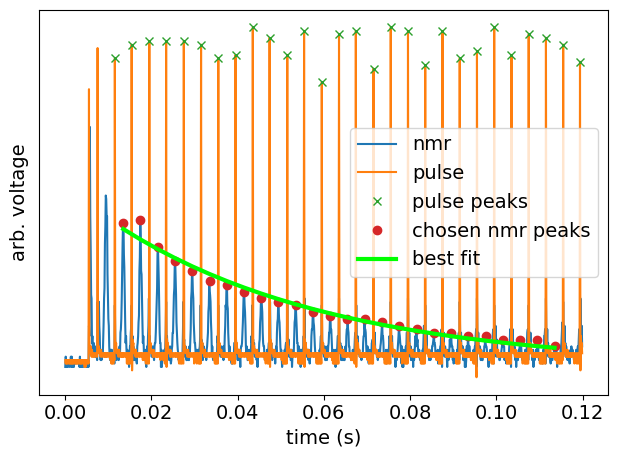

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 26
    # variables        = 2
    chi-square         = 14.4170187
    reduced chi-square = 0.60070911
    Akaike info crit   = -11.3318666
    Bayesian info crit = -8.81567353
[[Variables]]
    pre:  0.02097699 +/- 5.1158e-04 (2.44%) (init = 0.4)
    tau:  0.05071443 +/- 0.00151008 (2.98%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.860
[ 115  154  195  234  274  315  355  395  435  474  515  555  595  635
  674  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly92\NewFile6.csv
signal stddev (V): [0.00073129 0.00134714 0.0008572  0.0006122  0.00073129 0.00117251
 0.0006122  0.0006122  0.0008572  0.0008572  0.0008572  0.0006122
 0.00073129 0.00100736 0.00073129 0.0006122  0.0008572  0.00073129
 0.00073129 0.0008572  0.0006122  0.00064404 0.00064404 0.00064

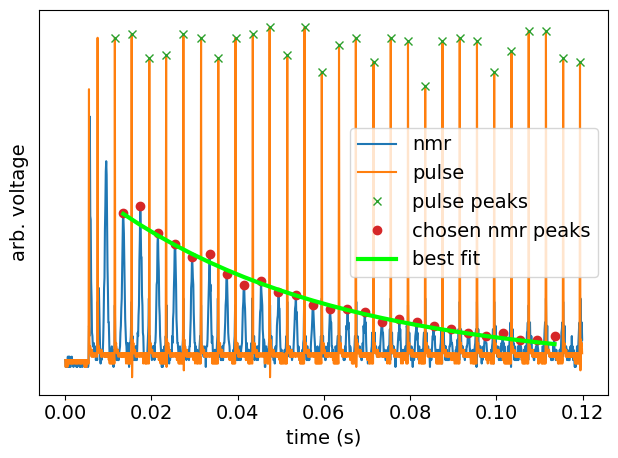

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 26
    # variables        = 2
    chi-square         = 11.6927960
    reduced chi-square = 0.48719983
    Akaike info crit   = -16.7772140
    Bayesian info crit = -14.2610209
[[Variables]]
    pre:  0.02306299 +/- 5.1397e-04 (2.23%) (init = 0.4)
    tau:  0.05260066 +/- 0.00140115 (2.66%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.860
[ 115  155  195  234  275  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  954  995 1034 1075 1115 1154 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly92\NewFile7.csv
signal stddev (V): [0.00060121 0.00072211 0.00100072 0.00072211 0.00100072 0.00072211
 0.00072211 0.0006336  0.00084938 0.00100072 0.00100072 0.00072211
 0.00084938 0.00060121 0.00084938 0.00084938 0.00084938 0.0006336
 0.00072211 0.00084938 0.0006336  0.00072211 0.0006336  0.00063

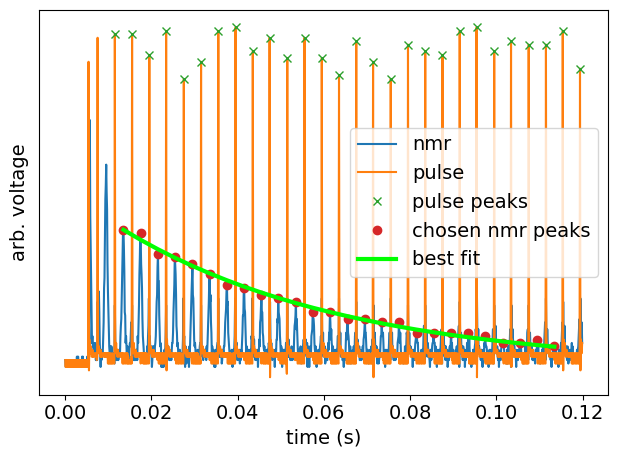

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 54
    # data points      = 26
    # variables        = 2
    chi-square         = 5.67714891
    reduced chi-square = 0.23654787
    Akaike info crit   = -35.5628320
    Bayesian info crit = -33.0466389
[[Variables]]
    pre:  0.02071443 +/- 3.2285e-04 (1.56%) (init = 0.4)
    tau:  0.05227990 +/- 0.00102352 (1.96%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.834
[ 115  155  195  235  275  315  355  395  435  475  515  555  595  635
  674  715  755  794  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly92\NewFile8.csv
signal stddev (V): [0.0007311  0.00061197 0.0007311  0.00061197 0.00064382 0.0007311
 0.00061197 0.00064382 0.00085704 0.00061197 0.00064382 0.0007311
 0.0007311  0.00064382 0.00061197 0.00100723 0.0007311  0.00064382
 0.00085704 0.0007311  0.00064382 0.00064382 0.00085704 0.000731

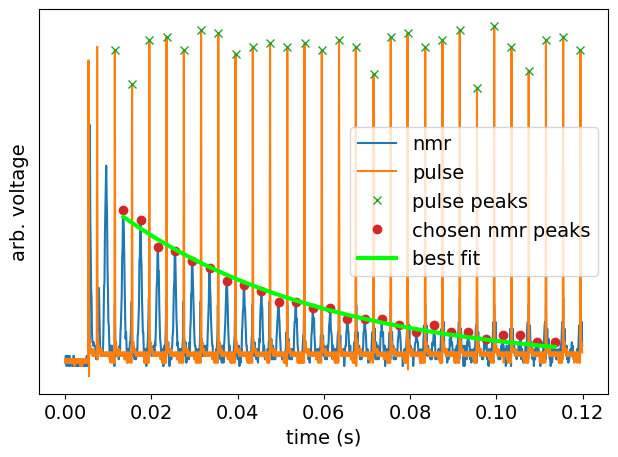

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 32
    # data points      = 26
    # variables        = 2
    chi-square         = 15.8729299
    reduced chi-square = 0.66137208
    Akaike info crit   = -8.83051649
    Bayesian info crit = -6.31432341
[[Variables]]
    pre:  0.02319103 +/- 5.5422e-04 (2.39%) (init = 0.4)
    tau:  0.04862613 +/- 0.00143142 (2.94%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.859
[ 115  155  195  235  275  315  355  395  435  475  515  555  595  635
  675  714  755  795  835  875  915  954  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly92\NewFile9.csv
signal stddev (V): [0.00073519 0.00064847 0.00064847 0.00061685 0.00064847 0.00061685
 0.00064847 0.00073519 0.0010102  0.00061685 0.00086053 0.00061685
 0.00064847 0.00064847 0.00061685 0.00064847 0.00073519 0.00064847
 0.00073519 0.00061685 0.00086053 0.00064847 0.00073519 0.0007

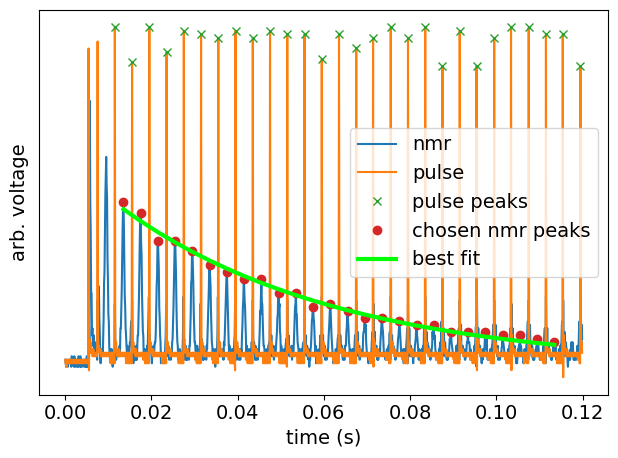

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 26
    # variables        = 2
    chi-square         = 12.9998154
    reduced chi-square = 0.54165897
    Akaike info crit   = -14.0221960
    Bayesian info crit = -11.5060029
[[Variables]]
    pre:  0.02351720 +/- 4.8234e-04 (2.05%) (init = 0.4)
    tau:  0.05068942 +/- 0.00129690 (2.56%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.857
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly93\\NewFile

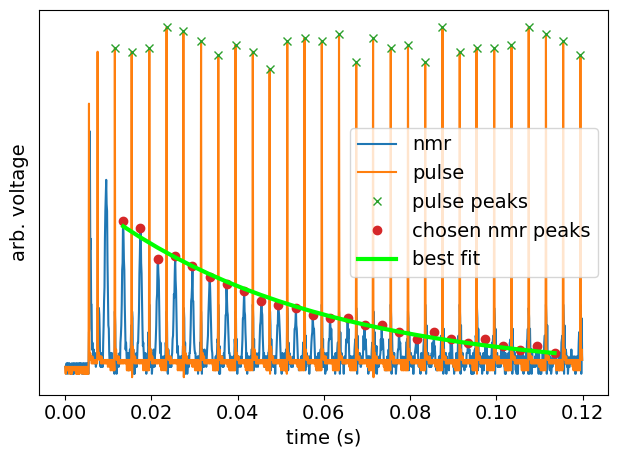

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 29
    # data points      = 26
    # variables        = 2
    chi-square         = 13.7217412
    reduced chi-square = 0.57173921
    Akaike info crit   = -12.6169905
    Bayesian info crit = -10.1007974
[[Variables]]
    pre:  0.02218326 +/- 5.1984e-04 (2.34%) (init = 0.4)
    tau:  0.05094126 +/- 0.00140459 (2.76%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.828
[ 115  154  195  235  274  315  355  395  435  474  515  555  595  635
  675  715  755  794  835  875  914  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly93\NewFile2.csv
signal stddev (V): [0.00063503 0.00049322 0.00053223 0.0007767  0.00063503 0.00053223
 0.0007767  0.00063503 0.0007767  0.00063503 0.00111502 0.00093982
 0.00063503 0.00111502 0.0007767  0.00063503 0.0007767  0.00063503
 0.00093982 0.0007767  0.00053223 0.00063503 0.00053223 0.0004

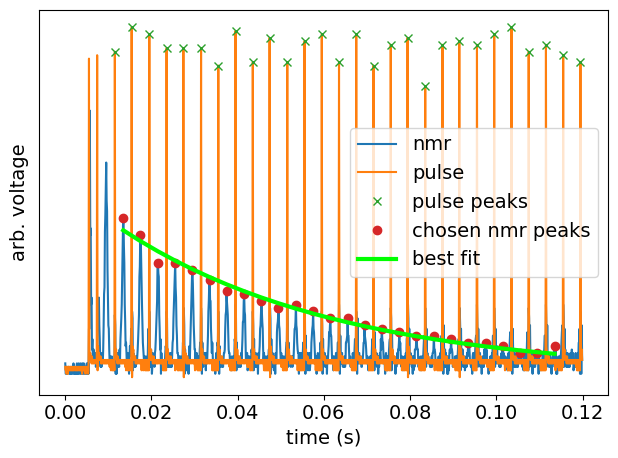

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 51
    # data points      = 26
    # variables        = 2
    chi-square         = 21.0251947
    reduced chi-square = 0.87604978
    Akaike info crit   = -1.52175189
    Bayesian info crit = 0.99444118
[[Variables]]
    pre:  0.02161444 +/- 5.3100e-04 (2.46%) (init = 0.4)
    tau:  0.05069158 +/- 0.00163976 (3.23%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.834
[ 115  154  195  235  274  315  355  394  435  475  515  555  595  635
  675  714  755  795  835  875  915  954  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly93\NewFile3.csv
signal stddev (V): [0.00068169 0.00058711 0.00068169 0.00068169 0.00081529 0.00081529
 0.00097196 0.00058711 0.00081529 0.00058711 0.00097196 0.00068169
 0.00081529 0.00097196 0.00081529 0.00081529 0.00081529 0.00097196
 0.00068169 0.00058711 0.00068169 0.00081529 0.00068169 0.00058

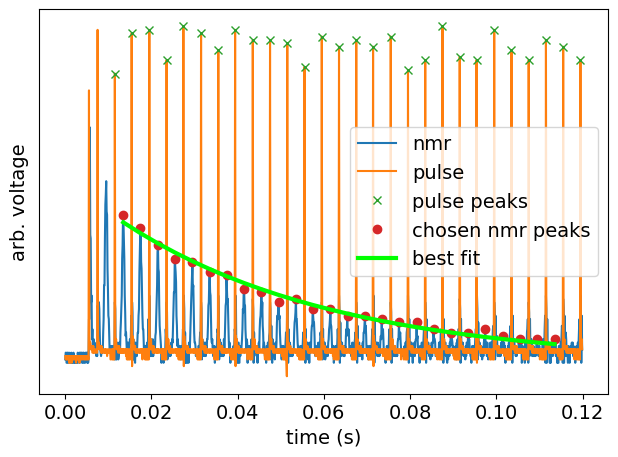

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 26
    # variables        = 2
    chi-square         = 12.3503539
    reduced chi-square = 0.51459808
    Akaike info crit   = -15.3547073
    Bayesian info crit = -12.8385142
[[Variables]]
    pre:  0.02191822 +/- 4.7285e-04 (2.16%) (init = 0.4)
    tau:  0.04953977 +/- 0.00135136 (2.73%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.839
[ 115  155  195  234  275  315  355  395  435  475  515  555  595  635
  674  715  755  794  835  875  914  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly93\NewFile4.csv
signal stddev (V): [0.00070735 0.00104897 0.00070735 0.00078762 0.00090573 0.00090573
 0.00078762 0.00137853 0.00078762 0.00067848 0.00090573 0.00090573
 0.00090573 0.00070735 0.00078762 0.00090573 0.00090573 0.00090573
 0.00090573 0.00070735 0.00070735 0.00078762 0.00078762 0.0007

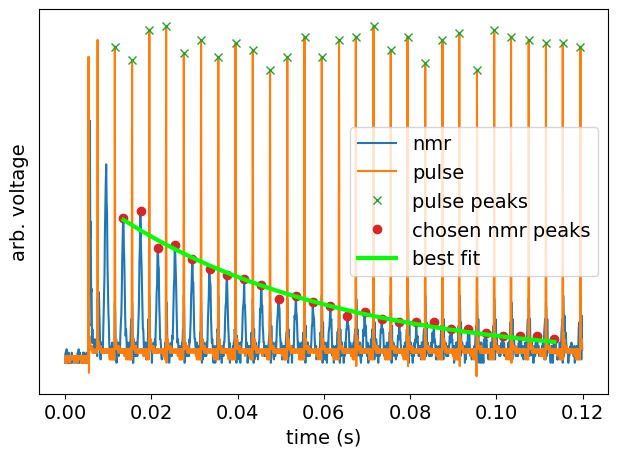

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 48
    # data points      = 26
    # variables        = 2
    chi-square         = 11.7894778
    reduced chi-square = 0.49122824
    Akaike info crit   = -16.5631171
    Bayesian info crit = -14.0469240
[[Variables]]
    pre:  0.02204839 +/- 5.2513e-04 (2.38%) (init = 0.4)
    tau:  0.05194089 +/- 0.00154182 (2.97%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.842
[ 115  155  195  234  275  315  355  395  435  475  515  554  595  635
  675  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly93\NewFile5.csv
signal stddev (V): [0.00075142 0.00075142 0.00102207 0.00087443 0.00087443 0.00118517
 0.00102207 0.00075142 0.00063611 0.00075142 0.00087443 0.00087443
 0.00087443 0.00087443 0.00075142 0.00075142 0.00087443 0.00066681
 0.00087443 0.00075142 0.00075142 0.00087443 0.00075142 0.0006

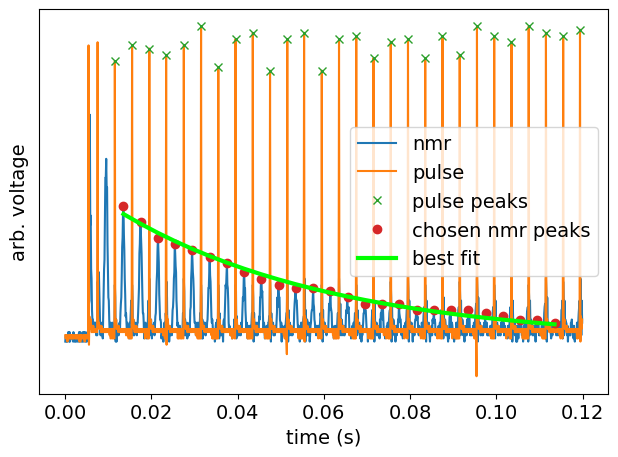

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 57
    # data points      = 26
    # variables        = 2
    chi-square         = 8.07416641
    reduced chi-square = 0.33642360
    Akaike info crit   = -26.4050995
    Bayesian info crit = -23.8889065
[[Variables]]
    pre:  0.02121564 +/- 4.5123e-04 (2.13%) (init = 0.4)
    tau:  0.04996598 +/- 0.00125661 (2.51%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.842
[ 115  154  195  234  275  315  355  395  435  475  515  554  595  635
  674  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly93\NewFile6.csv
signal stddev (V): [0.0006173  0.00070785 0.00070785 0.00070785 0.00083729 0.00070785
 0.000584   0.00070785 0.00083729 0.00070785 0.00070785 0.00070785
 0.00083729 0.00083729 0.00133456 0.00070785 0.00099048 0.00083729
 0.00083729 0.0006173  0.00070785 0.00070785 0.00070785 0.0007

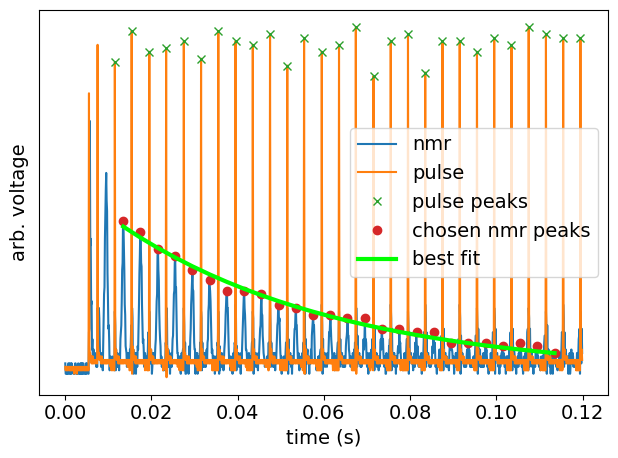

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 51
    # data points      = 26
    # variables        = 2
    chi-square         = 10.6387092
    reduced chi-square = 0.44327955
    Akaike info crit   = -19.2335318
    Bayesian info crit = -16.7173388
[[Variables]]
    pre:  0.02214023 +/- 4.4010e-04 (1.99%) (init = 0.4)
    tau:  0.05098036 +/- 0.00131281 (2.58%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.845
[ 115  155  195  234  275  315  355  395  435  475  515  554  595  635
  674  715  755  795  835  875  914  955  995 1034 1075 1115 1154 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly93\NewFile7.csv
signal stddev (V): [0.00075704 0.00075704 0.00140467 0.00123819 0.00075704 0.00094505
 0.00075704 0.00094505 0.00075704 0.00075704 0.00083253 0.00094505
 0.00094505 0.0010831  0.00083253 0.00083253 0.00083253 0.00075704
 0.00083253 0.00094505 0.00094505 0.00073014 0.00075704 0.0007

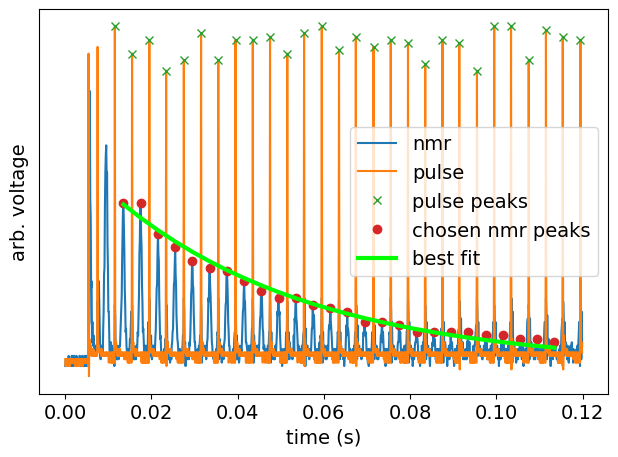

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 26
    # variables        = 2
    chi-square         = 15.3099676
    reduced chi-square = 0.63791532
    Akaike info crit   = -9.76940358
    Bayesian info crit = -7.25321050
[[Variables]]
    pre:  0.02553651 +/- 6.9408e-04 (2.72%) (init = 0.4)
    tau:  0.04599686 +/- 0.00145893 (3.17%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.847
[ 115  155  195  234  275  315  355  395  435  474  515  555  595  635
  675  714  755  795  835  875  915  954  995 1035 1075 1115 1154 1194]
test: CarrPurc_P1-19_P2-38_tauVary\Gly93\NewFile8.csv
signal stddev (V): [0.00084161 0.00074048 0.00076701 0.00109009 0.00076701 0.00095305
 0.00084161 0.00084161 0.00074048 0.00109009 0.00084161 0.00074048
 0.00074048 0.00095305 0.00095305 0.00076701 0.00084161 0.00095305
 0.00095305 0.00109009 0.00076701 0.00074048 0.00076701 0.0007

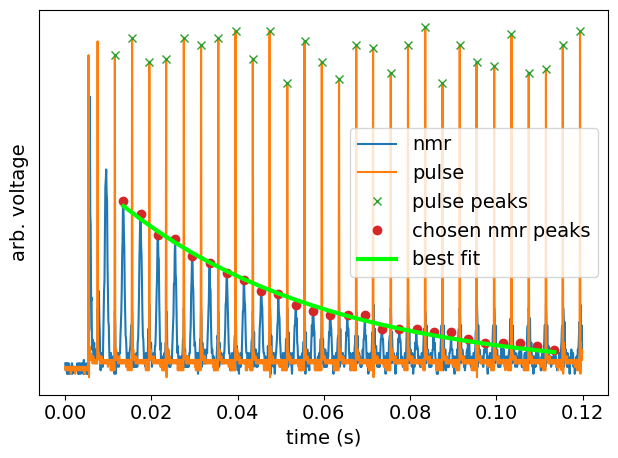

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 33
    # data points      = 26
    # variables        = 2
    chi-square         = 7.25340001
    reduced chi-square = 0.30222500
    Akaike info crit   = -29.1922815
    Bayesian info crit = -26.6760885
[[Variables]]
    pre:  0.02555077 +/- 4.4570e-04 (1.74%) (init = 0.4)
    tau:  0.04878981 +/- 0.00103832 (2.13%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.849
[ 115  155  195  235  275  315  355  395  435  475  515  555  595  635
  675  715  755  795  835  875  915  955  995 1035 1075 1115 1155 1195]
test: CarrPurc_P1-19_P2-38_tauVary\Gly93\NewFile9.csv
signal stddev (V): [0.00072483 0.00063669 0.00085169 0.00116849 0.00085169 0.00072483
 0.00060446 0.00100268 0.00063669 0.00116849 0.00072483 0.00063669
 0.00072483 0.00063669 0.00100268 0.00072483 0.00060446 0.00063669
 0.00063669 0.00085169 0.00085169 0.00085169 0.00072483 0.0007

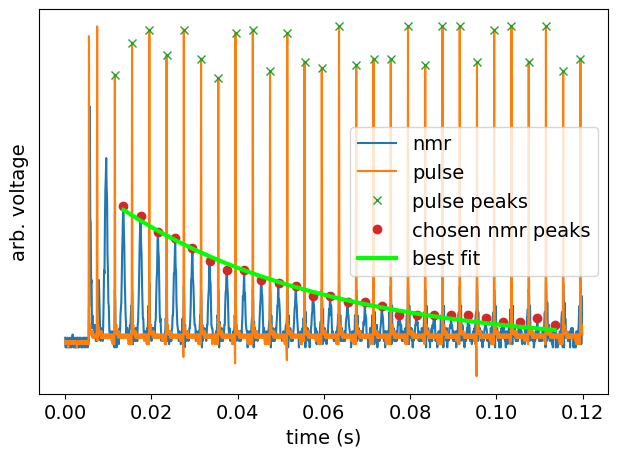

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 30
    # data points      = 26
    # variables        = 2
    chi-square         = 12.0418843
    reduced chi-square = 0.50174518
    Akaike info crit   = -16.0123458
    Bayesian info crit = -13.4961528
[[Variables]]
    pre:  0.02264362 +/- 5.2261e-04 (2.31%) (init = 0.4)
    tau:  0.04841856 +/- 0.00132384 (2.73%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.849
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly94\\NewFile

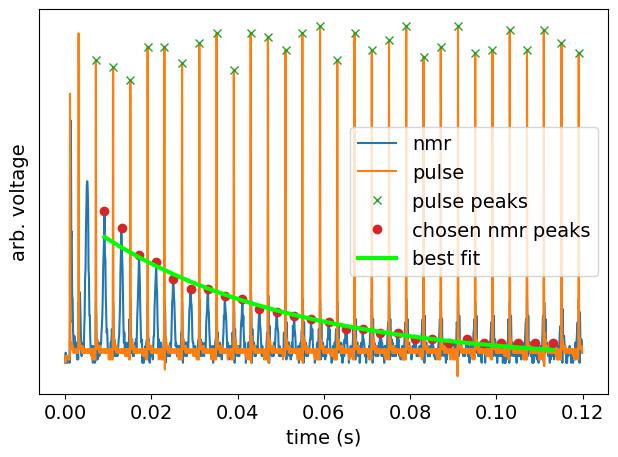

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 70
    # data points      = 27
    # variables        = 2
    chi-square         = 23.8002806
    reduced chi-square = 0.95201122
    Akaike info crit   = 0.59423364
    Bayesian info crit = 3.18590738
[[Variables]]
    pre:  0.01826342 +/- 6.5729e-04 (3.60%) (init = 0.4)
    tau:  0.04558146 +/- 0.00178656 (3.92%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.863
[  71  111  151  190  231  271  310  351  391  430  471  510  550  591
  630  671  711  750  791  831  870  911  951  990 1031 1071 1110 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly94\NewFile2.csv
signal stddev (V): [0.00057827 0.00057827 0.00096664 0.00080895 0.00067409 0.00054259
 0.00080895 0.00054259 0.00067409 0.00054259 0.00054259 0.00067409
 0.00080895 0.00054259 0.00067409 0.00067409 0.00096664 0.00057827
 0.00057827 0.00057827 0.00067409 0.00054259 0.00057827 0.

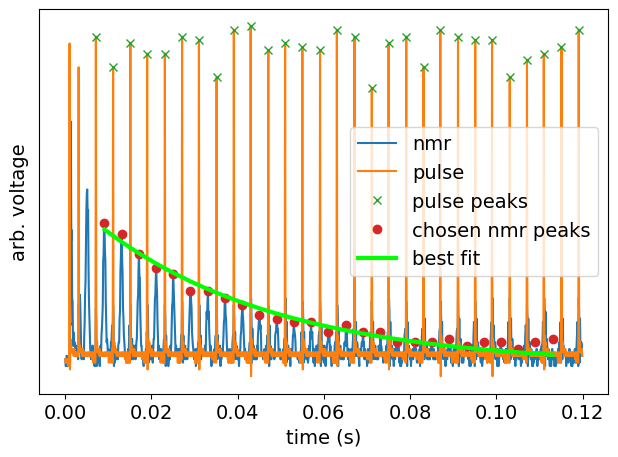

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 62
    # data points      = 27
    # variables        = 2
    chi-square         = 36.1799938
    reduced chi-square = 1.44719975
    Akaike info crit   = 11.9020750
    Bayesian info crit = 14.4937487
[[Variables]]
    pre:  0.01999776 +/- 6.8570e-04 (3.43%) (init = 0.4)
    tau:  0.04175364 +/- 0.00175097 (4.19%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.811
[  71  111  151  191  231  271  311  351  391  431  471  511  550  591
  631  670  711  751  790  831  871  910  951  990 1031 1071 1110 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly94\NewFile3.csv
signal stddev (V): [0.00107406 0.00056    0.00089084 0.00039192 0.00071666 0.00056
 0.00107406 0.00044    0.00056    0.00044    0.00071666 0.00044
 0.00089084 0.00071666 0.00044    0.00044    0.00056    0.00056
 0.00089084 0.00044    0.00044    0.00039192 0.00039192 0.00039192


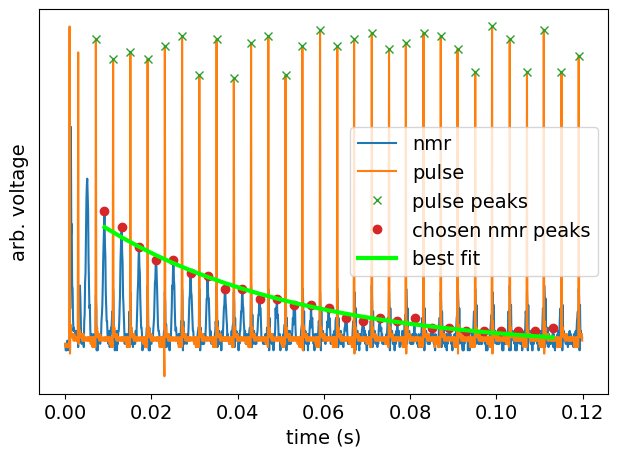

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 61
    # data points      = 27
    # variables        = 2
    chi-square         = 33.7983680
    reduced chi-square = 1.35193472
    Akaike info crit   = 10.0635426
    Bayesian info crit = 12.6552163
[[Variables]]
    pre:  0.01853393 +/- 6.0407e-04 (3.26%) (init = 0.4)
    tau:  0.04615539 +/- 0.00169695 (3.68%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.835
[  71  111  151  191  231  271  311  351  391  431  471  510  551  591
  631  671  711  751  791  831  871  911  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly94\NewFile4.csv
signal stddev (V): [0.00056    0.00107406 0.00056    0.00056    0.00044    0.00044
 0.00071666 0.00044    0.00071666 0.00056    0.00071666 0.00056
 0.00071666 0.00056    0.00044    0.00056    0.00044    0.00039192
 0.00039192 0.00039192 0.00039192 0.00044    0.00039192 0.000391

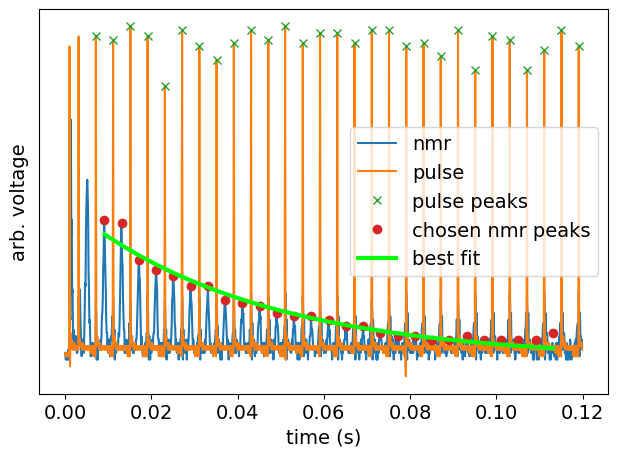

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 27
    # variables        = 2
    chi-square         = 46.6143819
    reduced chi-square = 1.86457528
    Akaike info crit   = 18.7439508
    Bayesian info crit = 21.3356245
[[Variables]]
    pre:  0.01854155 +/- 6.7606e-04 (3.65%) (init = 0.4)
    tau:  0.04348423 +/- 0.00179009 (4.12%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.821
[  71  111  151  191  230  271  311  351  391  431  471  511  551  591
  630  671  711  751  791  831  870  911  951  990 1031 1071 1110 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly94\NewFile5.csv
signal stddev (V): [0.00067987 0.00081377 0.00081377 0.00067987 0.00067987 0.00054975
 0.00067987 0.00054975 0.00081377 0.00097068 0.00054975 0.00067987
 0.00067987 0.00097068 0.00054975 0.00081377 0.00067987 0.000585
 0.000585   0.000585   0.00054975 0.00054975 0.00054975 0.00

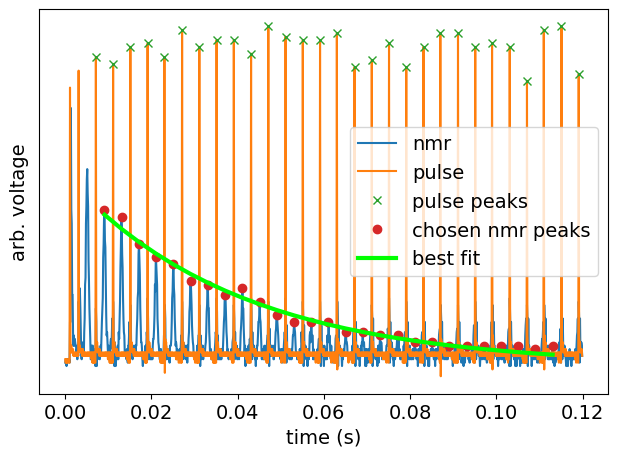

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 54
    # data points      = 27
    # variables        = 2
    chi-square         = 21.5912374
    reduced chi-square = 0.86364950
    Akaike info crit   = -2.03583132
    Bayesian info crit = 0.55584241
[[Variables]]
    pre:  0.02236234 +/- 6.0091e-04 (2.69%) (init = 0.4)
    tau:  0.04016494 +/- 0.00124592 (3.10%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.822
[  71  111  151  191  231  270  311  351  391  431  471  511  550  591
  630  670  711  750  790  831  871  911  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly94\NewFile6.csv
signal stddev (V): [0.00080554 0.00080554 0.00111754 0.00087686 0.00098432 0.00111754
 0.00087686 0.00078031 0.00098432 0.00087686 0.00080554 0.00087686
 0.00078031 0.00087686 0.00111754 0.00080554 0.00111754 0.00080554
 0.00078031 0.00078031 0.00087686 0.00080554 0.00080554 0

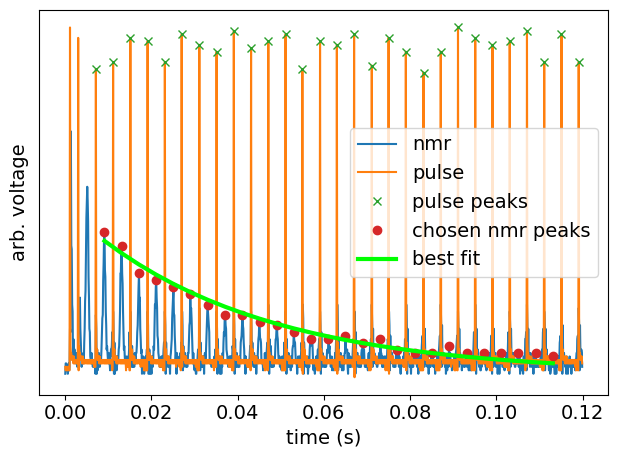

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 59
    # data points      = 27
    # variables        = 2
    chi-square         = 16.1563885
    reduced chi-square = 0.64625554
    Akaike info crit   = -9.86507575
    Bayesian info crit = -7.27340202
[[Variables]]
    pre:  0.01918059 +/- 6.3176e-04 (3.29%) (init = 0.4)
    tau:  0.04086109 +/- 0.00164416 (4.02%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.805
[  71  111  151  191  231  271  311  351  390  431  471  510  551  591
  630  671  711  750  791  831  870  911  951  990 1031 1071 1110 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly94\NewFile7.csv
signal stddev (V): [0.00054975 0.00081377 0.00081377 0.00067987 0.00067987 0.000585
 0.00081377 0.00067987 0.00054975 0.00067987 0.00081377 0.00067987
 0.00081377 0.000585   0.000585   0.000585   0.00067987 0.00081377
 0.00054975 0.000585   0.000585   0.00054975 0.000585   0.

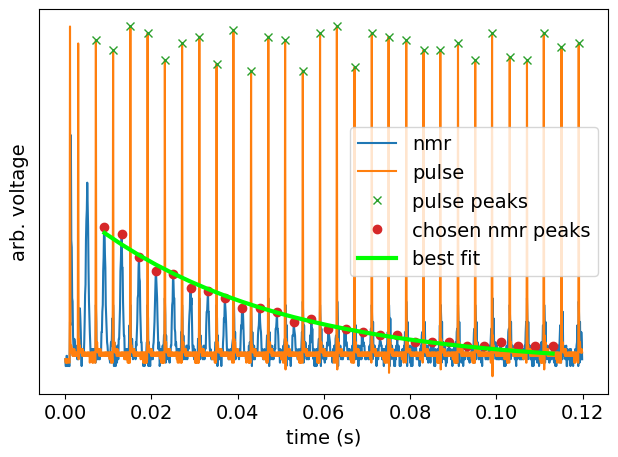

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 60
    # data points      = 27
    # variables        = 2
    chi-square         = 19.6208064
    reduced chi-square = 0.78483226
    Akaike info crit   = -4.61965037
    Bayesian info crit = -2.02797664
[[Variables]]
    pre:  0.01929670 +/- 4.9868e-04 (2.58%) (init = 0.4)
    tau:  0.04384057 +/- 0.00139264 (3.18%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.804
[  71  111  151  191  231  271  311  351  391  431  471  511  550  591
  630  670  711  750  791  831  871  910  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly94\NewFile8.csv
signal stddev (V): [0.00054975 0.000585   0.000585   0.00081377 0.000585   0.00081377
 0.000585   0.000585   0.000585   0.00054975 0.000585   0.00067987
 0.00081377 0.000585   0.00067987 0.00067987 0.00081377 0.00054975
 0.000585   0.00054975 0.000585   0.000585   0.000585   

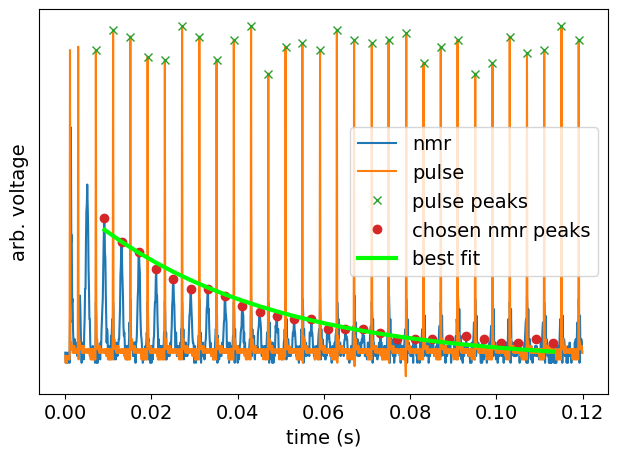

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 59
    # data points      = 27
    # variables        = 2
    chi-square         = 34.0567884
    reduced chi-square = 1.36227154
    Akaike info crit   = 10.2691979
    Bayesian info crit = 12.8608716
[[Variables]]
    pre:  0.01964046 +/- 6.2135e-04 (3.16%) (init = 0.4)
    tau:  0.04203407 +/- 0.00168665 (4.01%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.806
[  71  111  151  190  231  271  310  351  391  430  470  511  551  591
  631  671  711  751  791  831  870  911  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly94\NewFile9.csv
signal stddev (V): [0.00064498 0.00054406 0.00112071 0.00064498 0.00054406 0.00050596
 0.00064498 0.00078486 0.00054406 0.00094657 0.00078486 0.00064498
 0.00078486 0.00054406 0.00054406 0.00078486 0.00064498 0.00054406
 0.00054406 0.00054406 0.00064498 0.00050596 0.00050596 0.

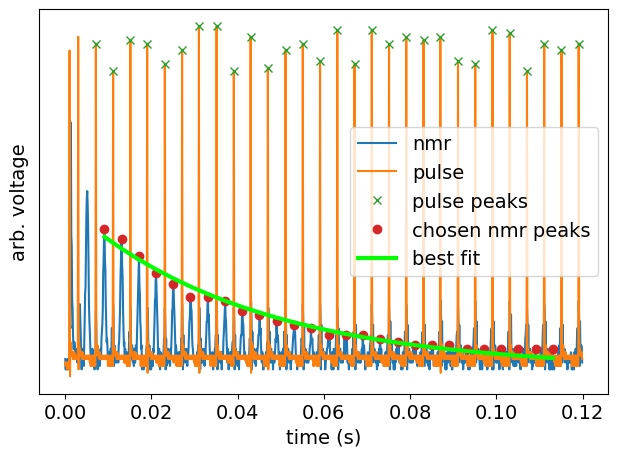

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 59
    # data points      = 27
    # variables        = 2
    chi-square         = 29.5245966
    reduced chi-square = 1.18098386
    Akaike info crit   = 6.41344446
    Bayesian info crit = 9.00511819
[[Variables]]
    pre:  0.01915863 +/- 6.0457e-04 (3.16%) (init = 0.4)
    tau:  0.04243367 +/- 0.00163744 (3.86%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.812
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly95\\NewFile9.

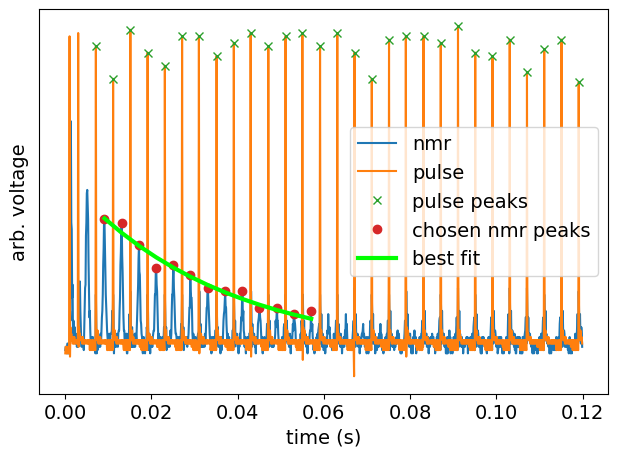

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 51
    # data points      = 13
    # variables        = 2
    chi-square         = 11.6953897
    reduced chi-square = 1.06321725
    Akaike info crit   = 2.62518976
    Bayesian info crit = 3.75508848
[[Variables]]
    pre:  0.02139297 +/- 8.4276e-04 (3.94%) (init = 0.4)
    tau:  0.03519904 +/- 0.00202357 (5.75%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.856
[  71  111  151  191  230  271  310  351  391  430  471  511  550  591
  631  671  711  751  790  831  870  911  951  991 1031 1071 1110 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly95\NewFile2.csv
signal stddev (V): [0.00044721 0.00126491 0.0004     0.00089443 0.00056569 0.00044721
 0.00107703 0.00044721 0.00089443 0.0004     0.00044721 0.00072111
 0.00044721]


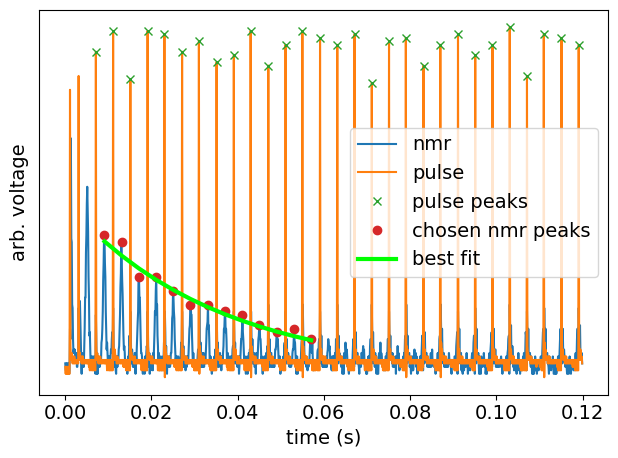

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 59
    # data points      = 13
    # variables        = 2
    chi-square         = 14.8571718
    reduced chi-square = 1.35065199
    Akaike info crit   = 5.73593347
    Bayesian info crit = 6.86583218
[[Variables]]
    pre:  0.01984292 +/- 7.3159e-04 (3.69%) (init = 0.4)
    tau:  0.03493280 +/- 0.00177631 (5.08%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.858
[  71  111  151  191  231  271  310  351  391  431  471  511  550  591
  631  671  711  751  791  830  871  911  951  991 1031 1071 1110 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly95\NewFile3.csv
signal stddev (V): [0.00082462 0.0006     0.00114891 0.00069282 0.00069282 0.00056569
 0.00082462 0.00082462 0.00069282 0.00082462 0.00082462 0.0009798
 0.00082462]


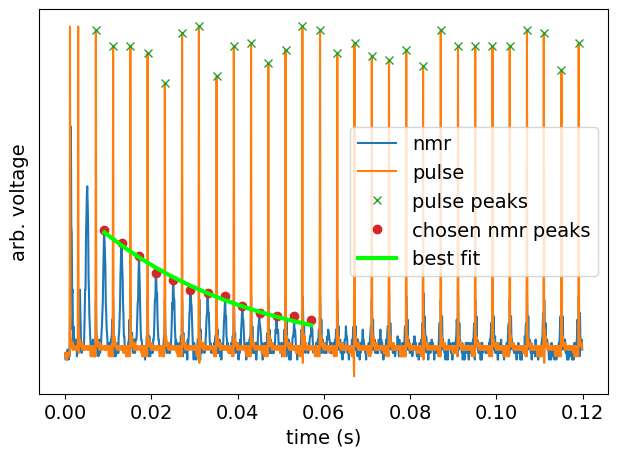

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 59
    # data points      = 13
    # variables        = 2
    chi-square         = 3.43329639
    reduced chi-square = 0.31211785
    Akaike info crit   = -13.3085706
    Bayesian info crit = -12.1786719
[[Variables]]
    pre:  0.01955853 +/- 5.1342e-04 (2.63%) (init = 0.4)
    tau:  0.03671842 +/- 0.00142041 (3.87%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.884
[  71  111  151  191  231  271  310  351  391  430  471  511  550  591
  631  671  711  751  791  830  871  911  951  991 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly95\NewFile4.csv
signal stddev (V): [0.00056569 0.00044721 0.00056569 0.00089443 0.00056569 0.00089443
 0.00044721 0.00044721 0.00072111 0.00044721 0.00044721 0.00056569
 0.00056569]


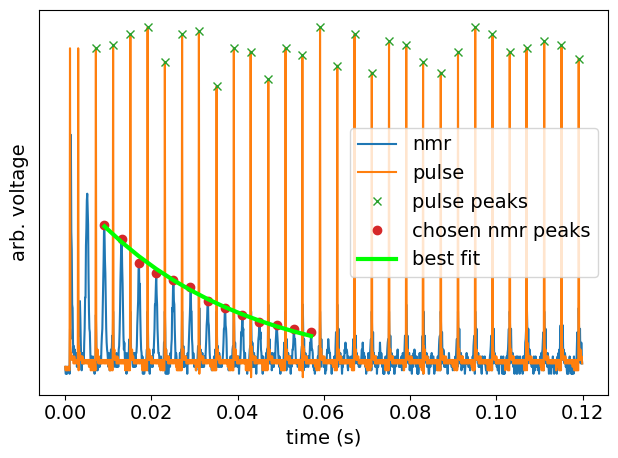

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 62
    # data points      = 13
    # variables        = 2
    chi-square         = 4.58462862
    reduced chi-square = 0.41678442
    Akaike info crit   = -9.54912329
    Bayesian info crit = -8.41922458
[[Variables]]
    pre:  0.02205333 +/- 4.1603e-04 (1.89%) (init = 0.4)
    tau:  0.03519293 +/- 9.1386e-04 (2.60%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.861
[  71  111  151  190  231  271  310  351  391  430  471  510  550  591
  630  670  711  750  791  831  870  911  951  990 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly95\NewFile5.csv
signal stddev (V): [0.00080895 0.00067409 0.00080895 0.00054259 0.00057827 0.00057827
 0.00067409 0.00057827 0.00080895 0.00057827 0.00080895 0.00067409
 0.00067409]


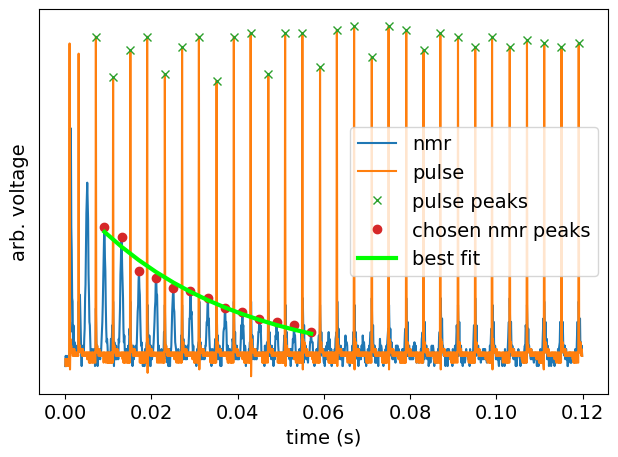

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 13
    # variables        = 2
    chi-square         = 10.0269902
    reduced chi-square = 0.91154457
    Akaike info crit   = 0.62430459
    Bayesian info crit = 1.75420330
[[Variables]]
    pre:  0.02070206 +/- 8.7342e-04 (4.22%) (init = 0.4)
    tau:  0.03369513 +/- 0.00186800 (5.54%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.892
[  70  111  151  190  231  271  310  351  391  430  471  510  551  591
  630  671  711  750  791  831  870  911  951  990 1031 1071 1110 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly95\NewFile6.csv
signal stddev (V): [0.00044    0.00089084 0.00044    0.00056    0.00039192 0.00056
 0.00039192 0.00071666 0.00044    0.00071666 0.00071666 0.00056
 0.00071666]


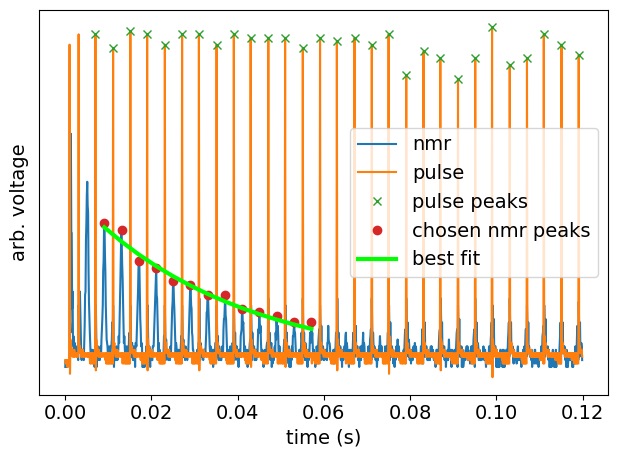

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 52
    # data points      = 13
    # variables        = 2
    chi-square         = 11.7618164
    reduced chi-square = 1.06925604
    Akaike info crit   = 2.69881742
    Bayesian info crit = 3.82871614
[[Variables]]
    pre:  0.02081362 +/- 6.4301e-04 (3.09%) (init = 0.4)
    tau:  0.03696240 +/- 0.00172508 (4.67%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.882
[  71  111  151  191  230  271  311  351  391  431  471  510  551  591
  630  671  711  750  791  831  870  911  951  990 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly95\NewFile7.csv
signal stddev (V): [0.00067987 0.00067987 0.00097068 0.00067987 0.00054975 0.000585
 0.00067987 0.000585   0.000585   0.000585   0.00067987 0.000585
 0.000585  ]


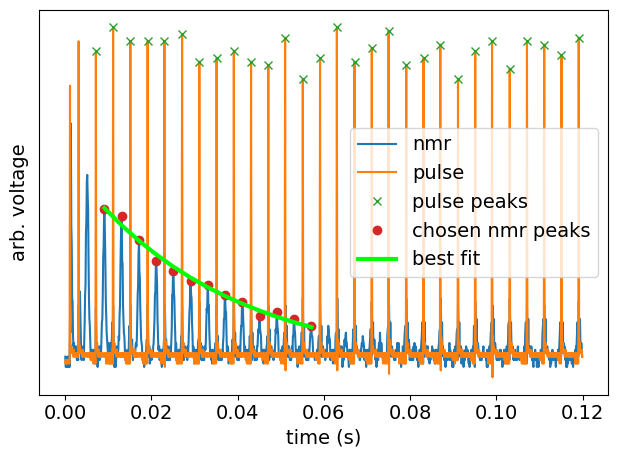

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 56
    # data points      = 13
    # variables        = 2
    chi-square         = 7.57601891
    reduced chi-square = 0.68872899
    Akaike info crit   = -3.01949957
    Bayesian info crit = -1.88960086
[[Variables]]
    pre:  0.02410343 +/- 6.9384e-04 (2.88%) (init = 0.4)
    tau:  0.03467263 +/- 0.00129695 (3.74%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.877
[  71  111  151  191  231  271  311  351  391  431  471  510  551  591
  630  671  711  750  791  831  870  911  951  990 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly95\NewFile8.csv
signal stddev (V): [0.00044721 0.00056569 0.00072111 0.00056569 0.00072111 0.00056569
 0.00056569 0.00072111 0.00056569 0.00044721 0.00056569 0.00044721
 0.00056569]


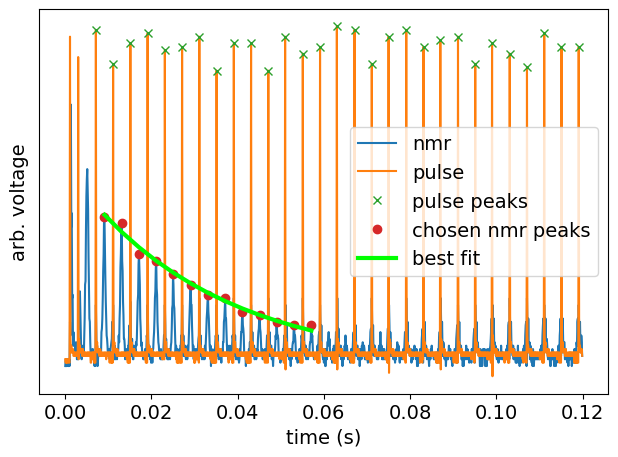

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 56
    # data points      = 13
    # variables        = 2
    chi-square         = 6.89568576
    reduced chi-square = 0.62688052
    Akaike info crit   = -4.24269412
    Bayesian info crit = -3.11279540
[[Variables]]
    pre:  0.02345074 +/- 5.0567e-04 (2.16%) (init = 0.4)
    tau:  0.03310816 +/- 9.8160e-04 (2.96%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.844
[  71  111  151  191  230  271  311  351  391  431  471  511  551  591
  631  671  711  751  791  831  871  911  951  990 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly95\NewFile9.csv
signal stddev (V): [0.00074536 0.00074536 0.00157339 0.00093571 0.00082192 0.00082192
 0.00082192 0.00082192 0.00107497 0.00123108 0.00082192 0.00082192
 0.00093571]


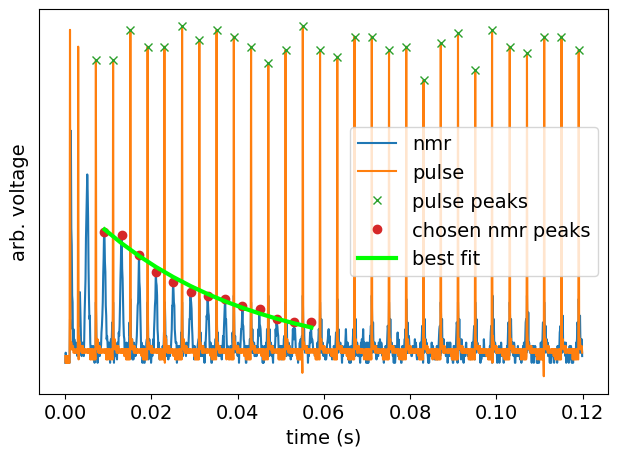

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 57
    # data points      = 13
    # variables        = 2
    chi-square         = 4.47958939
    reduced chi-square = 0.40723540
    Akaike info crit   = -9.85043360
    Bayesian info crit = -8.72053489
[[Variables]]
    pre:  0.02041502 +/- 6.2883e-04 (3.08%) (init = 0.4)
    tau:  0.03610226 +/- 0.00165275 (4.58%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.859
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly97\\NewFile

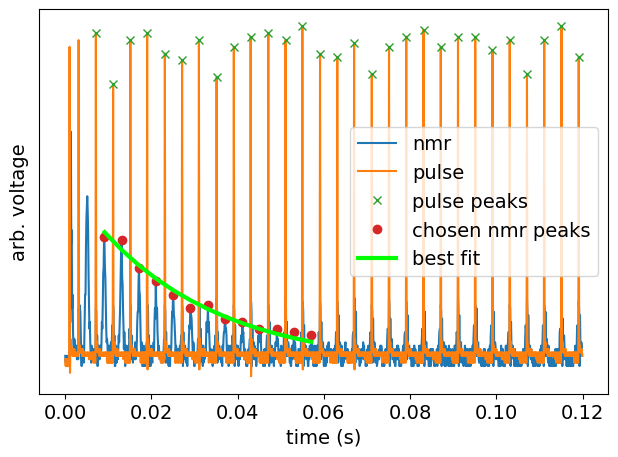

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 61
    # data points      = 13
    # variables        = 2
    chi-square         = 10.4160209
    reduced chi-square = 0.94691099
    Akaike info crit   = 1.11914450
    Bayesian info crit = 2.24904322
[[Variables]]
    pre:  0.02181253 +/- 9.4085e-04 (4.31%) (init = 0.4)
    tau:  0.02805318 +/- 0.00152142 (5.42%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.859
[  71  111  151  191  231  271  311  351  391  431  471  510  551  591
  630  671  711  750  791  831  870  911  951  991 1031 1070 1110 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly97\NewFile2.csv
signal stddev (V): [0.00062893 0.0022529  0.00093571 0.00052493 0.00077172 0.00062893
 0.00077172 0.00093571 0.00048534 0.00077172 0.00062893 0.00062893
 0.00077172]


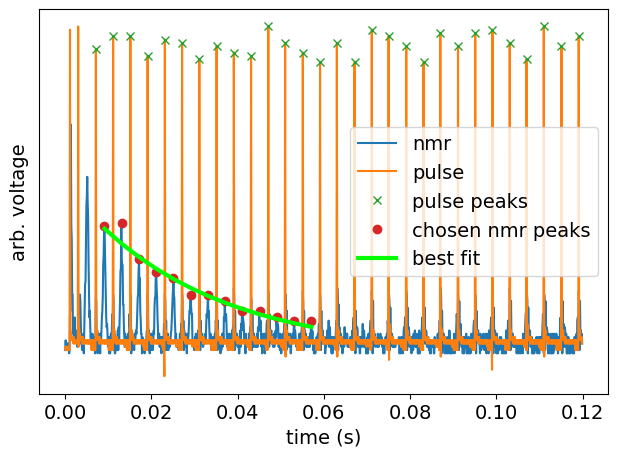

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 42
    # data points      = 13
    # variables        = 2
    chi-square         = 5.69988873
    reduced chi-square = 0.51817170
    Akaike info crit   = -6.71853516
    Bayesian info crit = -5.58863644
[[Variables]]
    pre:  0.02047447 +/- 6.9772e-04 (3.41%) (init = 0.4)
    tau:  0.03096762 +/- 0.00128594 (4.15%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.872
[  71  111  151  191  230  271  310  351  391  431  471  511  551  591
  631  671  711  751  791  830  871  911  951  990 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly97\NewFile3.csv
signal stddev (V): [0.00090676 0.00078881 0.00104987 0.00137921 0.00090676 0.00090676
 0.00090676 0.00104987 0.00090676 0.00120922 0.00090676 0.00070868
 0.00070868]


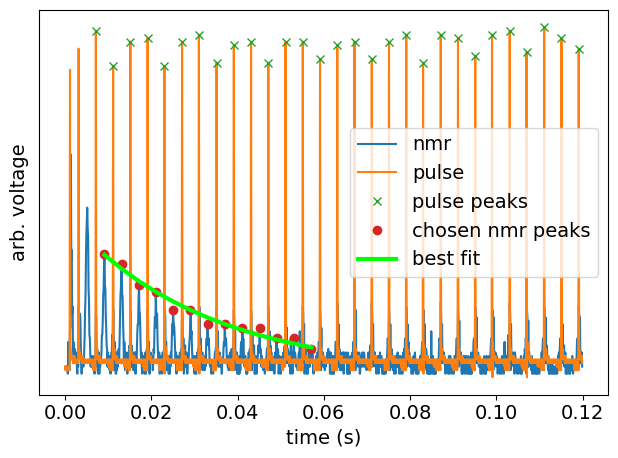

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 13
    # variables        = 2
    chi-square         = 3.91399409
    reduced chi-square = 0.35581764
    Akaike info crit   = -11.6050830
    Bayesian info crit = -10.4751842
[[Variables]]
    pre:  0.01788419 +/- 6.7904e-04 (3.80%) (init = 0.4)
    tau:  0.03195340 +/- 0.00158625 (4.96%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.854
[  71  111  151  191  230  271  310  351  391  431  471  511  551  591
  631  671  711  751  791  830  870  911  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly97\NewFile4.csv
signal stddev (V): [0.00071106 0.00071106 0.00084    0.00099277 0.00099277 0.00084
 0.00062097 0.00071106 0.00084    0.00099277 0.00062097 0.00058788
 0.00084   ]


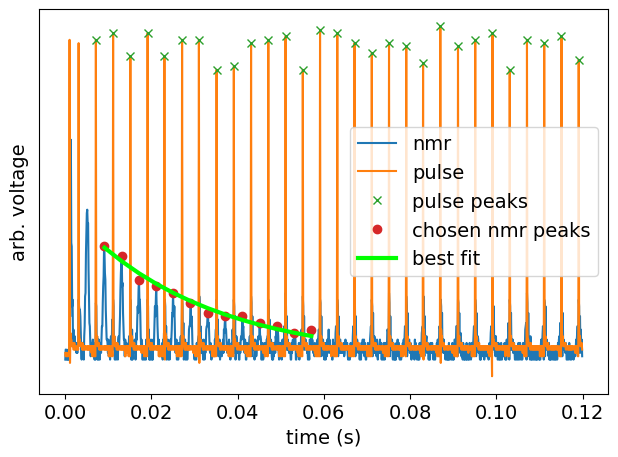

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 58
    # data points      = 13
    # variables        = 2
    chi-square         = 4.17804226
    reduced chi-square = 0.37982202
    Akaike info crit   = -10.7563855
    Bayesian info crit = -9.62648681
[[Variables]]
    pre:  0.01807401 +/- 5.9617e-04 (3.30%) (init = 0.4)
    tau:  0.03076741 +/- 0.00130095 (4.23%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.854
[  71  111  151  191  230  271  311  351  391  431  471  510  551  591
  631  671  711  750  791  831  870  911  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly97\NewFile5.csv
signal stddev (V): [0.000585   0.00067987 0.00097068 0.00081377 0.000585   0.00067987
 0.00054975 0.00067987 0.00081377 0.000585   0.00081377 0.00067987
 0.000585  ]


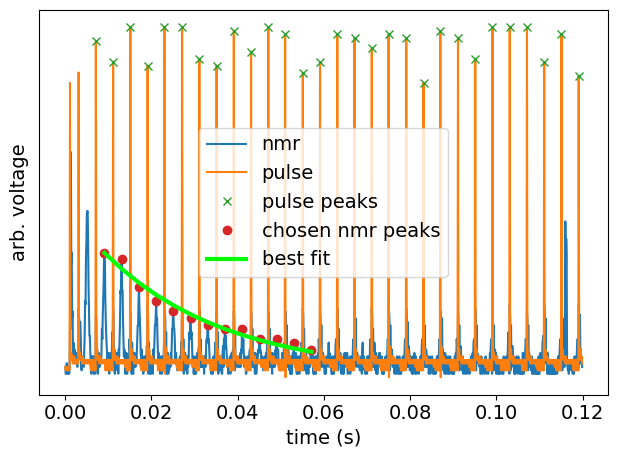

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 54
    # data points      = 13
    # variables        = 2
    chi-square         = 8.62393633
    reduced chi-square = 0.78399421
    Akaike info crit   = -1.33530045
    Bayesian info crit = -0.20540173
[[Variables]]
    pre:  0.01928465 +/- 8.0332e-04 (4.17%) (init = 0.4)
    tau:  0.02815506 +/- 0.00144565 (5.13%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.859
[  71  111  151  191  231  271  310  351  391  430  471  511  550  591
  631  671  711  751  791  830  871  911  951  990 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly97\NewFile6.csv
signal stddev (V): [0.00072111 0.00063246 0.00072111 0.00116619 0.00072111 0.00072111
 0.001      0.00063246 0.00072111 0.00072111 0.00063246 0.00084853
 0.00072111]


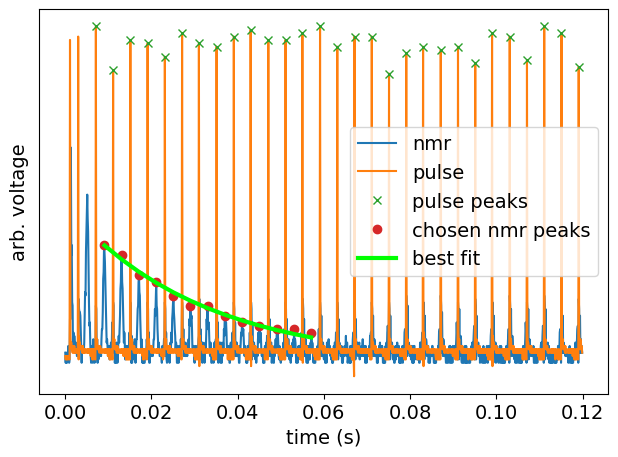

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 61
    # data points      = 13
    # variables        = 2
    chi-square         = 3.27442530
    reduced chi-square = 0.29767503
    Akaike info crit   = -13.9244908
    Bayesian info crit = -12.7945921
[[Variables]]
    pre:  0.01868003 +/- 5.0661e-04 (2.71%) (init = 0.4)
    tau:  0.03127095 +/- 0.00112180 (3.59%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.861
[  71  111  151  191  231  271  310  351  391  430  471  511  550  591
  631  671  711  751  791  830  871  911  951  991 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly97\NewFile7.csv
signal stddev (V): [0.00062893 0.00048534 0.00048534 0.00062893 0.00077172 0.00062893
 0.00048534 0.00062893 0.00077172 0.00062893 0.00077172 0.00077172
 0.00052493]


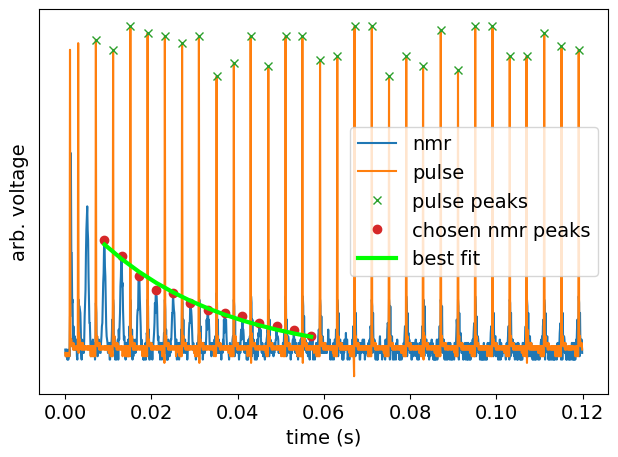

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 55
    # data points      = 13
    # variables        = 2
    chi-square         = 5.97444093
    reduced chi-square = 0.54313099
    Akaike info crit   = -6.10696481
    Bayesian info crit = -4.97706610
[[Variables]]
    pre:  0.01877869 +/- 5.8842e-04 (3.13%) (init = 0.4)
    tau:  0.02964561 +/- 0.00124925 (4.21%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.877
[  71  111  151  191  230  271  311  351  391  431  471  510  551  591
  630  671  711  751  791  831  871  911  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly97\NewFile8.csv
signal stddev (V): [0.00062893 0.00077172 0.00111156 0.00077172 0.00093571 0.00077172
 0.00062893 0.00048534 0.00077172 0.00062893 0.00077172 0.00062893
 0.00077172]


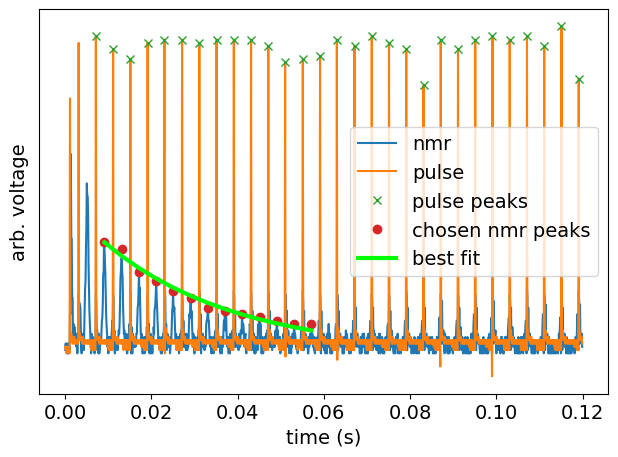

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 55
    # data points      = 13
    # variables        = 2
    chi-square         = 4.86764617
    reduced chi-square = 0.44251329
    Akaike info crit   = -8.77040530
    Bayesian info crit = -7.64050658
[[Variables]]
    pre:  0.01830815 +/- 6.1610e-04 (3.37%) (init = 0.4)
    tau:  0.03045967 +/- 0.00126584 (4.16%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.855
[  71  111  151  191  231  271  311  351  391  431  471  510  550  591
  631  671  711  751  791  831  871  911  951  991 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly97\NewFile9.csv
signal stddev (V): [0.00067987 0.00114115 0.00114115 0.00097068 0.00097068 0.00081377
 0.00114115 0.00081377 0.00067987 0.000585   0.00067987 0.00067987
 0.00067987]


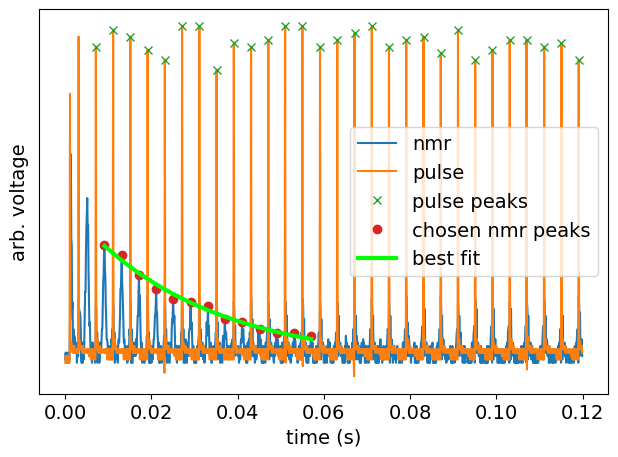

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 60
    # data points      = 13
    # variables        = 2
    chi-square         = 2.09354492
    reduced chi-square = 0.19032227
    Akaike info crit   = -19.7391777
    Bayesian info crit = -18.6092790
[[Variables]]
    pre:  0.01881382 +/- 4.5410e-04 (2.41%) (init = 0.4)
    tau:  0.03004675 +/- 8.6317e-04 (2.87%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.839
Fitting: ['CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile4.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile5.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile6.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile7.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile8.csv', 'CarrPurc_P1-19_P2-38_tauVary\\Gly98\\NewFile

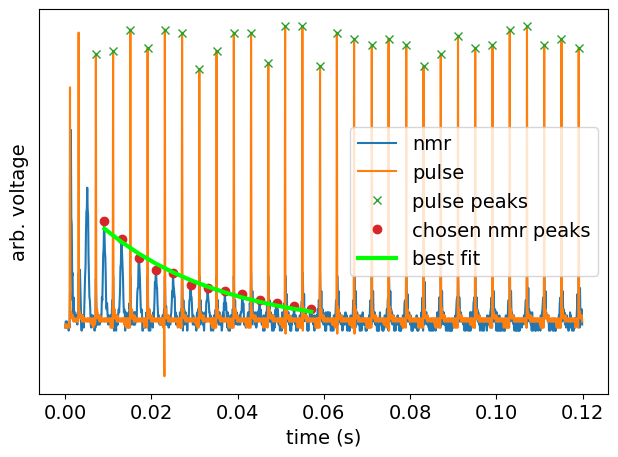

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 55
    # data points      = 13
    # variables        = 2
    chi-square         = 4.01782148
    reduced chi-square = 0.36525650
    Akaike info crit   = -11.2647238
    Bayesian info crit = -10.1348251
[[Variables]]
    pre:  0.01844594 +/- 7.7839e-04 (4.22%) (init = 0.4)
    tau:  0.02845390 +/- 0.00142592 (5.01%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.880
[  71  111  151  191  230  271  311  351  391  431  471  510  551  591
  630  671  711  750  791  831  871  911  951  991 1031 1071 1111 1150
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly98\NewFile2.csv
signal stddev (V): [0.00118134 0.00086923 0.00171917 0.00086923 0.00062893 0.00086923
 0.00086923 0.00086923 0.00065997 0.00065997 0.00086923 0.00086923
 0.00065997]


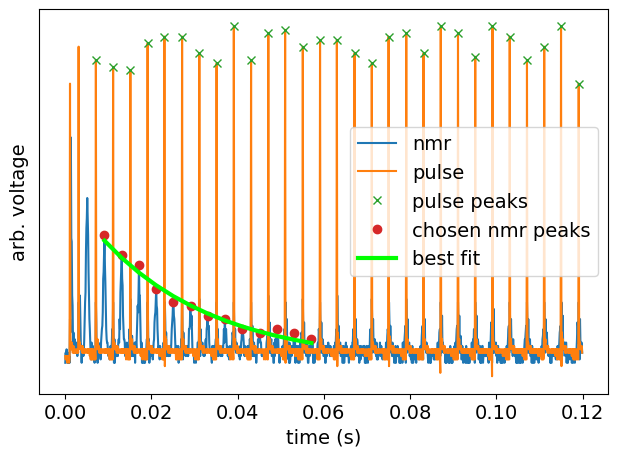

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 51
    # data points      = 13
    # variables        = 2
    chi-square         = 4.99663469
    reduced chi-square = 0.45423952
    Akaike info crit   = -8.43040153
    Bayesian info crit = -7.30050282
[[Variables]]
    pre:  0.02051767 +/- 9.8558e-04 (4.80%) (init = 0.4)
    tau:  0.02634712 +/- 0.00131085 (4.98%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.886
[  71  111  151  190  231  271  310  351  391  430  471  510  550  591
  630  671  711  750  791  831  870  911  951  990 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly98\NewFile3.csv
signal stddev (V): [0.00110345 0.00094742 0.00100876 0.00100876 0.00100876 0.00092607
 0.00100876 0.00110345 0.00110345 0.00092607 0.00094742 0.00092607
 0.00092607]


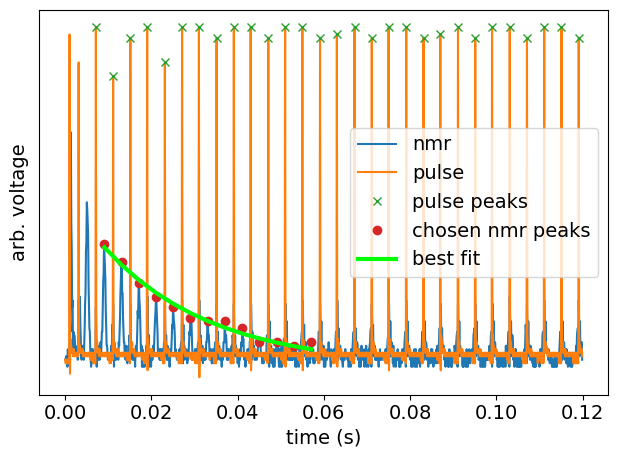

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 45
    # data points      = 13
    # variables        = 2
    chi-square         = 2.79132655
    reduced chi-square = 0.25375696
    Akaike info crit   = -15.9996213
    Bayesian info crit = -14.8697226
[[Variables]]
    pre:  0.01964679 +/- 8.0361e-04 (4.09%) (init = 0.4)
    tau:  0.02498029 +/- 0.00115755 (4.63%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.876
[  71  111  151  191  230  271  311  351  391  431  471  511  551  591
  631  671  711  751  791  830  871  911  951  991 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly98\NewFile4.csv
signal stddev (V): [0.00067987 0.00131993 0.00081377 0.000585   0.00097068 0.000585
 0.00097068 0.00067987 0.00067987 0.000585   0.000585   0.000585
 0.00081377]


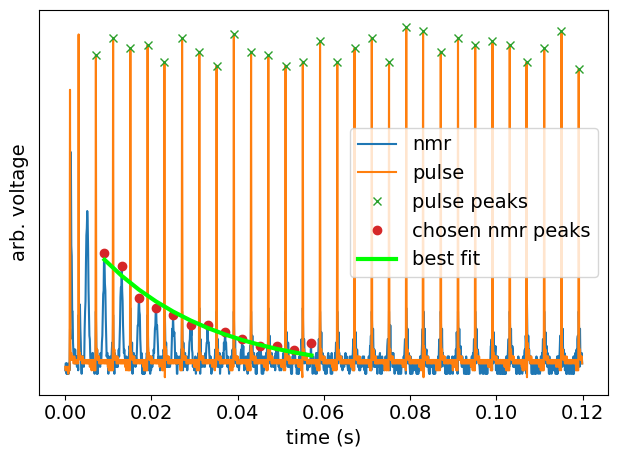

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 26
    # data points      = 13
    # variables        = 2
    chi-square         = 10.4333056
    reduced chi-square = 0.94848233
    Akaike info crit   = 1.14069937
    Bayesian info crit = 2.27059808
[[Variables]]
    pre:  0.01863441 +/- 0.00107183 (5.75%) (init = 0.4)
    tau:  0.02624233 +/- 0.00166646 (6.35%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.866
[  71  111  151  191  230  271  311  351  391  430  471  511  551  591
  631  671  711  751  791  831  871  911  951  991 1031 1071 1111 1150
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly98\NewFile5.csv
signal stddev (V): [0.00075719 0.00083267 0.00094516 0.00083267 0.00094516 0.00123828
 0.00075719 0.00083267 0.0007303  0.00094516 0.00083267 0.00083267
 0.00075719]


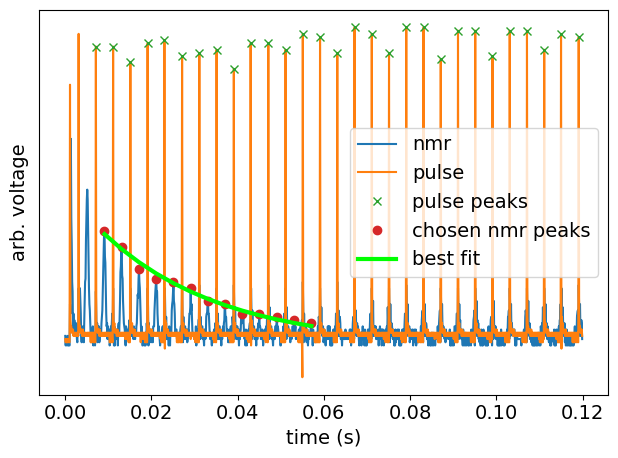

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 52
    # data points      = 13
    # variables        = 2
    chi-square         = 3.07662626
    reduced chi-square = 0.27969330
    Akaike info crit   = -14.7345045
    Bayesian info crit = -13.6046058
[[Variables]]
    pre:  0.01950601 +/- 6.0870e-04 (3.12%) (init = 0.4)
    tau:  0.02747994 +/- 0.00105927 (3.85%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.857
[  71  111  151  191  231  271  311  351  391  431  471  510  551  591
  630  671  711  750  791  830  871  911  951  990 1031 1070 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly98\NewFile6.csv
signal stddev (V): [0.00093571 0.00074536 0.00139841 0.00082192 0.00093571 0.00107497
 0.00093571 0.00093571 0.00071802 0.00074536 0.00093571 0.00082192
 0.00074536]


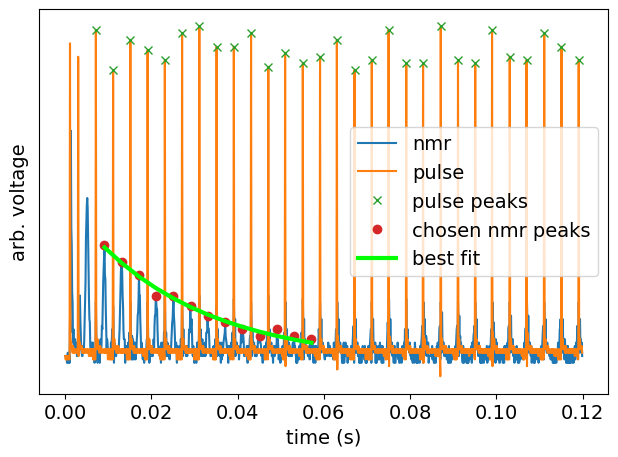

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 56
    # data points      = 13
    # variables        = 2
    chi-square         = 3.34102965
    reduced chi-square = 0.30372997
    Akaike info crit   = -13.6627141
    Bayesian info crit = -12.5328154
[[Variables]]
    pre:  0.01913249 +/- 6.9133e-04 (3.61%) (init = 0.4)
    tau:  0.02741585 +/- 0.00117074 (4.27%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.861
[  71  111  151  191  230  271  310  351  391  430  471  511  550  591
  631  671  711  751  791  831  871  911  951  991 1031 1071 1111 1150
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly98\NewFile7.csv
signal stddev (V): [0.00084853 0.00134164 0.001      0.00152315 0.00116619 0.00084853
 0.00084853 0.00072111 0.001      0.00063246 0.00084853 0.0006
 0.00063246]


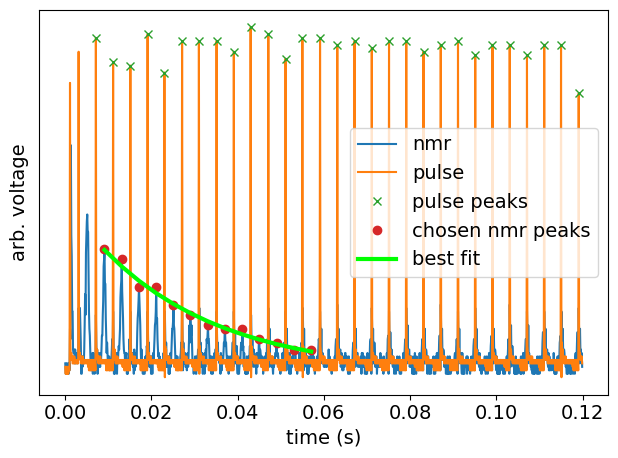

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 49
    # data points      = 13
    # variables        = 2
    chi-square         = 2.16519779
    reduced chi-square = 0.19683616
    Akaike info crit   = -19.3016894
    Bayesian info crit = -18.1717907
[[Variables]]
    pre:  0.01981562 +/- 5.6609e-04 (2.86%) (init = 0.4)
    tau:  0.02791523 +/- 8.5683e-04 (3.07%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.848
[  71  111  151  190  231  271  310  351  391  430  471  511  550  591
  631  671  711  751  791  831  871  910  951  991 1030 1071 1111 1150
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly98\NewFile8.csv
signal stddev (V): [0.00082365 0.00082365 0.00084758 0.00091564 0.00114822 0.00084758
 0.00101902 0.00101902 0.00101902 0.00101902 0.00091564 0.00091564
 0.00082365]


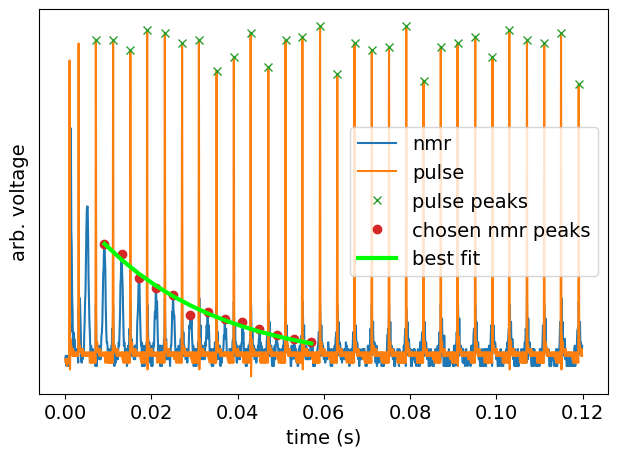

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 52
    # data points      = 13
    # variables        = 2
    chi-square         = 3.45122683
    reduced chi-square = 0.31374789
    Akaike info crit   = -13.2408546
    Bayesian info crit = -12.1109559
[[Variables]]
    pre:  0.01983808 +/- 6.7459e-04 (3.40%) (init = 0.4)
    tau:  0.02840277 +/- 0.00126832 (4.47%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.864
[  71  111  151  191  231  271  310  351  391  431  471  511  551  591
  631  671  711  751  791  831  871  911  951  991 1031 1071 1111 1151
 1191]
test: CarrPurc_P1-19_P2-38_tauVary\Gly98\NewFile9.csv
signal stddev (V): [0.00116    0.00062097 0.00071106 0.00062097 0.00099277 0.00071106
 0.00099277 0.00058788 0.00099277 0.00062097 0.00071106 0.00099277
 0.00058788]


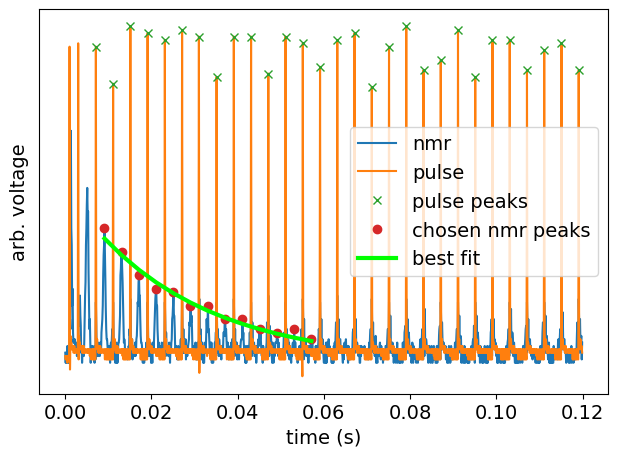

[[Model]]
    Model(exp_decay)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 52
    # data points      = 13
    # variables        = 2
    chi-square         = 6.15486422
    reduced chi-square = 0.55953311
    Akaike info crit   = -5.72018655
    Bayesian info crit = -4.59028784
[[Variables]]
    pre:  0.02058006 +/- 8.6816e-04 (4.22%) (init = 0.4)
    tau:  0.02751682 +/- 0.00135822 (4.94%) (init = 0.01)
[[Correlations]] (unreported correlations are < 0.100)
    C(pre, tau) = -0.887


In [7]:
in_dir = r"CarrPurc_P1-19_P2-38_tauVary"
std_default = 0.0006127

fit_result_dict = {} # concentration : list(FitResult)

for folder in os.listdir(in_dir):
    # Prepare paths to csvs in folder
    dirpath = os.path.join(in_dir, folder)
    csv_filepaths = choose_csvs(dirpath)
    print("Fitting:", csv_filepaths)
    
    # Prepare concentration entry corresponding to folder
    conc = int(''.join([n for n in folder if n.isdigit()]))
#     if conc < 80:
#         continue
    if conc not in fit_result_dict:
        fit_result_dict[conc] = []
    
    # Perform fits for each csv in folder
    for path in csv_filepaths:
        # hack to reject last 15 points for gly95 and above
        if conc > 94:
            fit_result_dict[conc].append(carr_purcell_fit_v2(path, std=std_default, plot=True, trim_last=15))
        else:
            fit_result_dict[conc].append(carr_purcell_fit_v2(path, std=std_default, plot=True))
    


## Plotting taus

### Individual measurements

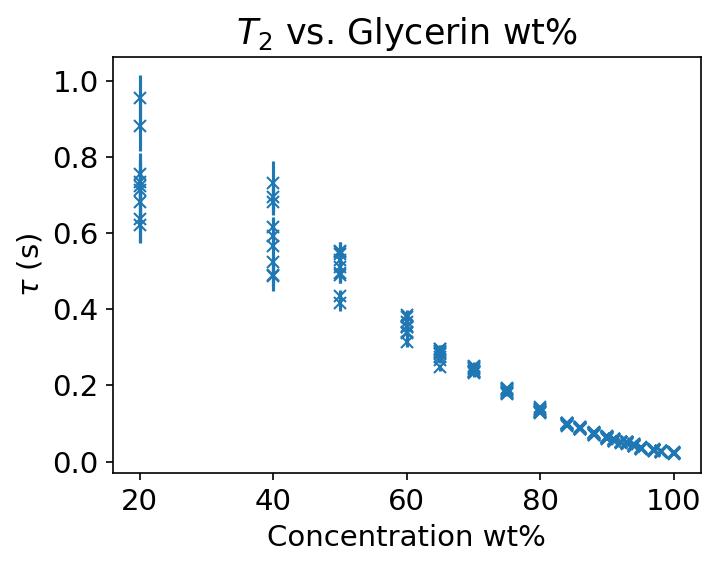

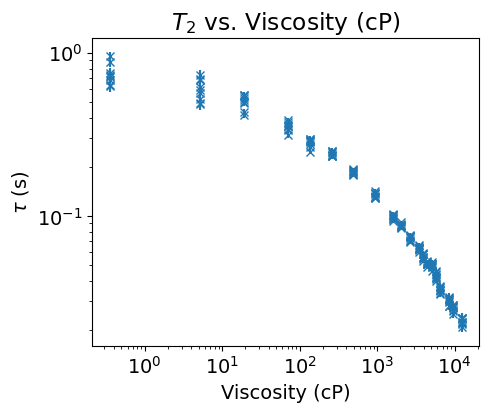

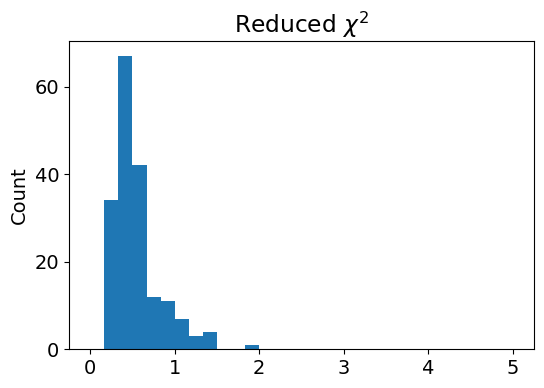

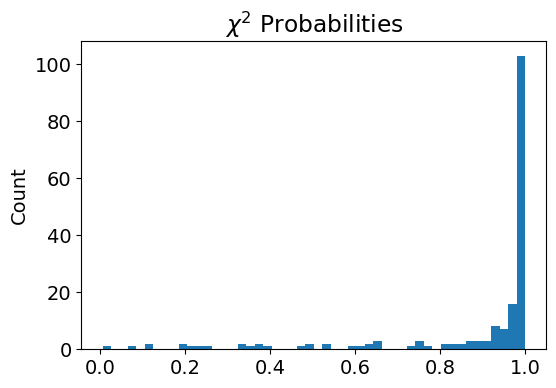

In [8]:
concentrations = []
time_consts = []
uncs = []
chisqr_prob = []
redchis = []

for conc, res_list in fit_result_dict.items():
    for res in res_list:
        concentrations.append(conc)
        time_consts.append(res.params['tau'].value)
        uncs.append(res.params['tau'].stderr)
        redchis.append(res.redchi)
        chisqr_prob.append(scipy.stats.distributions.chi2.sf(res.chisqr, res.nfree))
        
plt.rcParams.update({'font.size': 14})
fig, ax = plt.subplots(figsize=[5, 4], dpi=150)

ax.errorbar(concentrations, time_consts, yerr=uncs, marker='x', linestyle='')
ax.set_title("$T_2$ vs. Glycerin wt%")
ax.set_ylabel(r"$\tau$ (s)")
ax.set_xlabel("Concentration wt%")

plt.tight_layout()
plt.savefig('t2conc.png')

fig2, ax2 = plt.subplots(figsize=[5, 4])

viscosities = [conc_to_visc(22.8, c) for c in concentrations]
plt.rcParams.update({'font.size': 14})
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.errorbar(viscosities, time_consts, yerr=uncs, marker='x', linestyle='')
ax2.set_title("$T_2$ vs. Viscosity (cP)")
ax2.set_ylabel(r"$\tau$ (s)")
ax2.set_xlabel("Viscosity (cP)")


# inset axes
# axins = ax.inset_axes([0.5, 0.5, 0.47, 0.47])
# axins.errorbar(concentrations, time_consts, yerr=uncs, marker='x', linestyle='')
# # sub region of the original image
# x1, x2, y1, y2 = 90, 102, 0, 0.1
# axins.set_xlim(x1, x2)
# axins.set_ylim(y1, y2)
# axins.set_xticklabels([])
# axins.set_yticklabels([])
# ax.indicate_inset_zoom(axins, edgecolor="black")

fig3, ax3 = plt.subplots(figsize=[6, 4])
ax3.set_ylabel("Count")
ax3.set_title("Reduced $\chi^2$")
ax3.hist(redchis, bins=30, range=(0,5))

fig4, ax4 = plt.subplots(figsize=[6, 4])
ax4.set_ylabel("Count")
ax4.set_title("$\chi^2$ Probabilities")
ax4.hist(chisqr_prob, bins=50)

plt.show()

### Lumped measurements and fit in log-log

[100, 20, 40, 50, 60, 65, 70, 75, 80, 84, 86, 88, 90, 91, 92, 93, 94, 95, 97, 98]
Time constants [0.02262927961701456, 0.7359303172957194, 0.5778519664492426, 0.49331219302950235, 0.35262671374313737, 0.28177378663092806, 0.24119610312361808, 0.18567109486386668, 0.13329980179953613, 0.09828814243836496, 0.08751169366801746, 0.07337519901998939, 0.06321289188085745, 0.0565265998707109, 0.05135792312179508, 0.04959041487843951, 0.0426944006076222, 0.03492637118517579, 0.030207198319168783, 0.027266313971241685]
Uncertainties [0.00031239 0.03420506 0.02849345 0.01552984 0.00672861 0.00502395
 0.00216369 0.00166183 0.00158304 0.00094164 0.00066133 0.00079411
 0.00055868 0.00061288 0.0003697  0.0005607  0.00063759 0.00040385
 0.00042011 0.00035707]
[65, 70, 75, 80, 84, 86, 88, 90, 91, 92, 93, 94, 95, 97, 98]
[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 6
    # data points      = 15
    # variables        = 2
    chi-square        

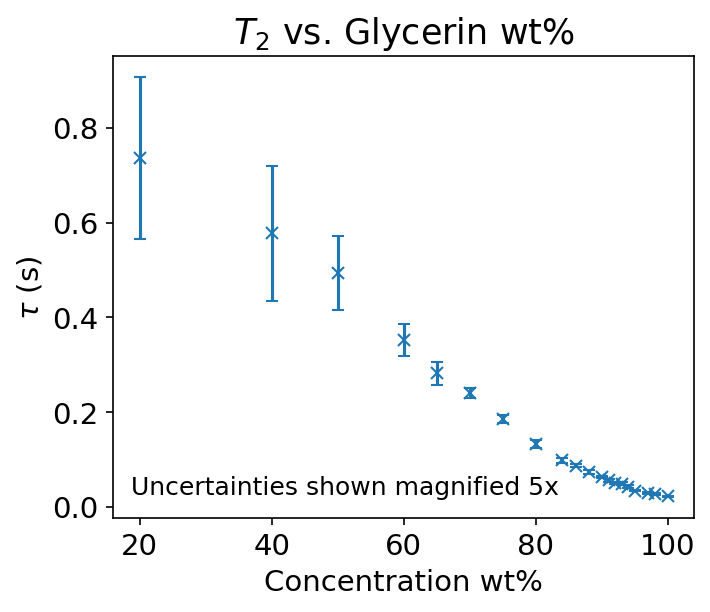

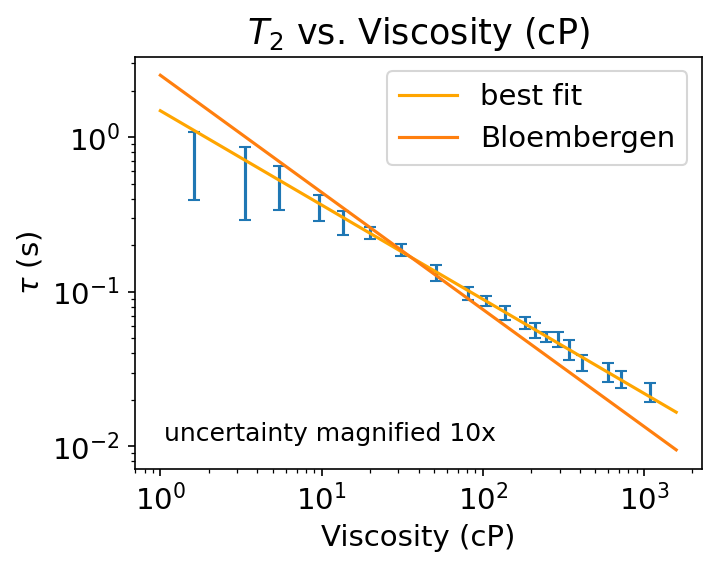

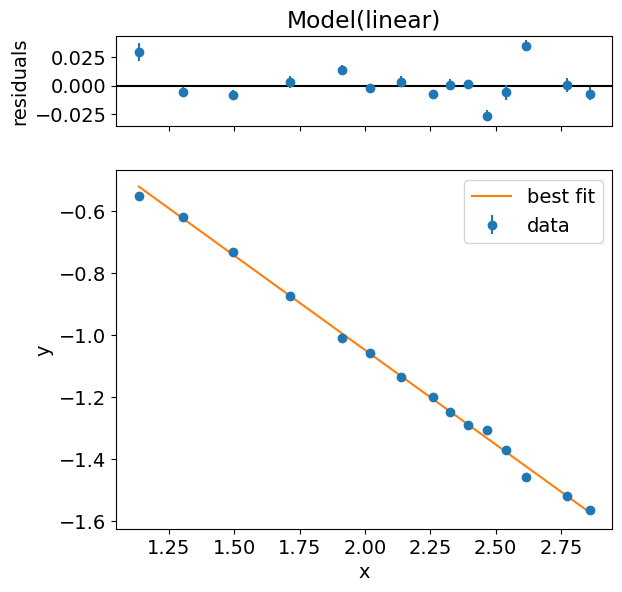

In [9]:
def draw_error_band(ax, x, y, err, **kwargs):
    # Calculate normals via centered finite differences (except the first point
    # which uses a forward difference and the last point which uses a backward
    # difference).
    dx = np.concatenate([[x[1] - x[0]], x[2:] - x[:-2], [x[-1] - x[-2]]])
    dy = np.concatenate([[y[1] - y[0]], y[2:] - y[:-2], [y[-1] - y[-2]]])
    l = np.hypot(dx, dy)
    nx = dy / l
    ny = -dx / l

    # end points of errors
    xp = x + nx * err
    yp = y + ny * err
    xn = x - nx * err
    yn = y - ny * err

    vertices = np.block([[xp, xn[::-1]],
                         [yp, yn[::-1]]]).T
    codes = np.full(len(vertices), Path.LINETO)
    codes[0] = codes[len(xp)] = Path.MOVETO
    path = Path(vertices, codes)
    ax.add_patch(PathPatch(path, **kwargs))

concentrations = []
time_consts = []
uncs = []

for conc, res_list in fit_result_dict.items():
    concentrations.append(conc)
    t = []
    t_unc = []
    for res in res_list:
        t.append(res.params['tau'].value)
        t_unc.append(res.params['tau'].stderr)
        
    # std of individual measurement is statistical
    # Bevington eqn. 4.17 and 4.19
#     t = np.array(t)
    t_unc = np.array(t_unc)
    weights = 1 / (t_unc*t_unc)
    weighted_mean = np.average(t, weights=weights)
#     unc = 1 / np.sum(weights)
    # std between measurements is statistical
    unc = np.std(t)
    
    time_consts.append(weighted_mean)
    uncs.append(unc / np.sqrt(len(t)))
    
uncs = np.array(uncs)
    
print(concentrations)
print("Time constants", time_consts)
print("Uncertainties", uncs)

fig, ax = plt.subplots(figsize=[5, 4], dpi=150)

ax.errorbar(concentrations, time_consts, yerr=uncs*5, marker='x', capsize=3, linestyle='')
plt.rcParams.update({'font.size': 12})
ax.text(0.03, 0.04, 'Uncertainties shown magnified 5x', horizontalalignment='left', verticalalignment='bottom', transform=ax.transAxes)
plt.rcParams.update({'font.size': 14})
ax.set_title("$T_2$ vs. Glycerin wt%")
ax.set_ylabel(r"$\tau$ (s)")
ax.set_xlabel("Concentration wt%")

fig2, ax2 = plt.subplots(figsize=[5, 4], dpi=150)

viscosities = np.array([conc_to_visc(22.8, c/100) for c in concentrations])
viscosity_alt = np.array([conc_to_visc(22.7, c/100) for c in concentrations])
visc_unc = viscosity_alt - viscosities

time_consts = np.array(time_consts)
plt.rcParams.update({'font.size': 14})
ax2.set_yscale('log')
ax2.set_xscale('log')
plt.rcParams.update({'font.size': 12})
ax2.text(0.12, 0.12, 'uncertainty magnified 10x', horizontalalignment='left', verticalalignment='bottom', transform=ax.transAxes)
plt.rcParams.update({'font.size': 14})
ax2.errorbar(viscosities, time_consts, yerr=uncs*10, marker='', linestyle='', capsize=3)
#ax2.scatter(viscosities, time_consts, marker='x')
#draw_error_band(ax2, viscosities, time_consts, err=visc_unc, facecolor=f"C0", edgecolor="none", alpha=.3)
ax2.set_title("$T_2$ vs. Viscosity (cP)")
ax2.set_ylabel(r"$\tau$ (s)")
ax2.set_xlabel("Viscosity (cP)")

val_trim = 5

xvals = np.log10(viscosities[val_trim:])
yvals = np.log10(time_consts[val_trim:])
print(concentrations[val_trim:])
std_prop = uncs[val_trim:] / (time_consts[val_trim:] * np.log(10)) # error propagation
lmod = LinearModel()
lpars = lmod.guess(yvals, xvals)
result = lmod.fit(yvals, lpars, x=xvals, weights=1/std_prop)

print(result.fit_report())

xplot = np.array((0,3.2))
xplot2 = np.array((0,3.2))
ax2.plot(10**xplot, 10**result.eval(x=xplot), color='orange', label='best fit')
ax2.plot(10**xplot2, 10**(-0.757*xplot2 + 0.4), label='Bloembergen')
ax2.legend()

# ax2.set_xlim((10**2, 10**3.2))
# ax2.set_ylim((10**-2, 10**-0.3))

#inset axes
# axins = ax2.inset_axes([0.6, 0.6, 0.37, 0.37])
# axins.set_yscale('log')
# axins.set_xscale('log')
# axins.errorbar(concentrations, time_consts, yerr=uncs, marker='x', linestyle='')
# # sub region of the original image
# x1, x2, y1, y2 = 10**1, 10**3, 0.03, 0.5
# axins.set_xlim(x1, x2)
# axins.set_ylim(y1, y2)
# axins.set_xticklabels([])
# axins.set_yticklabels([])
# ax2.indicate_inset_zoom(axins, edgecolor="black")

plt.tight_layout()
plt.savefig('t2visc_comp.png')

result.plot()
plt.show()

# All of the below are being ignored for the final 

In [10]:
def extract_tau(directory, cppars, verbose=False, plot=False, timestep=None):
    '''Get taus from a directory of csvs'''
    taus = []
    stderrs = []
    for path in choose_csvs(directory):
        fit_res = car_purcell_fit(path, cppars, plot=plot, verbose=verbose, timestep=timestep)
        taus.append(fit_res.params['tau'].value)
        stderrs.append(fit_res.params['tau'].stderr)
    variances = np.array(stderrs) ** 2
    mean_tau = np.average(taus, weights=1/variances)
    # assume statistical between trials
    std_tau = np.std(taus) / np.sqrt(len(taus))
    # assume systematic within the same fit
    #std_fit = np.sqrt(np.sum(np.array(stderrs) ** 2) / len(stderrs))
    # or assume statistical
    std_fit = np.mean(stderrs) / np.sqrt(len(taus))
    if verbose:
        print(f"{mean_tau} +/- {std_tau} (stat) +/- {std_fit} (fit)")
        #print("Fractional error %", std_tau/mean_tau * 100)
        print("\n")
    return (mean_tau, std_tau, std_fit, len(taus))

# Run 1

In [11]:
in_dir = r"CarrPurc_P1-15_P2-30_tau1"
cppars = cpParams(20, 0.005, 0.01, 0.02, -1)
cppars_range2 = cpParams(20, 0.005, 0.001, 0.01, -1)

cutoff = 66

means = []
concs = []
std_trials = []
std_fits = []

for folder in os.listdir(in_dir):
    dirpath = os.path.join(in_dir, folder)
    print("Fitting:", choose_csvs(dirpath))
    
    conc = int(''.join([n for n in folder if n.isdigit()]))
    if conc < 10:
        continue
    pars = cppars_range2 if conc < cutoff else cppars
    
    mu, std_tri, std_fit, _ = extract_tau(dirpath, pars, plot=0, verbose=0)#, timestep=5e-5)
    means.append(mu)
    concs.append(conc)
    std_trials.append(std_tri)
    std_fits.append(std_fit)
    
viscs = np.array([conc_to_visc(22, C) for C in concs])
concs = np.array(concs)
means = np.array(means)
std = np.sqrt(np.array(std_trials) ** 2 + np.array(std_fits) **2)

# plt.scatter(concs, means)
# plt.title("Carr-Purcell Decay Time Constant vs. Glycerin Concentration")
# plt.rcParams.update({'font.size': 16})
# plt.ylabel(r"$\tau$ (s)")
# plt.xlabel("Concentration %")
# plt.show()

Fitting: ['CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile12.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile13.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile14.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile15.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile16.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile17.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile18.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile19.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile20.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile21.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly100\\NewFile22.csv']
Fitting: ['CarrPurc_P1-15_P2-30_tau1\\Gly20\\NewFile73.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly20\\NewFile74.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly20\\NewFile75.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly20\\NewFile76.csv']
Fitting: ['CarrPurc_P1-15_P2-30_tau1\\Gly40\\NewFile69.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly40\\NewFile70.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly40\\NewFile71.csv', 'CarrPurc_P1-15_P2-30_tau1\\Gly40\\NewFil

In [12]:
lmod = LinearModel()
lpars = lmod.guess(means, concs)
result = lmod.fit(means, lpars, x=concs)

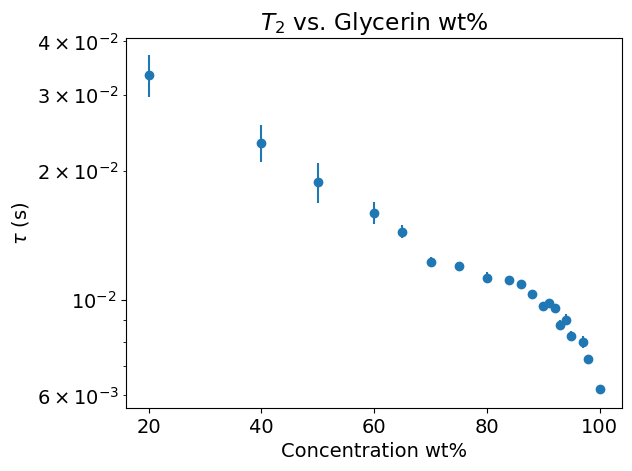

In [13]:
plt.yscale('log')
plt.errorbar(concs, means, yerr=std, marker='o', linestyle='')
#plt.plot(concs, result.best_fit)
plt.title("$T_2$ vs. Glycerin wt%")
plt.rcParams.update({'font.size': 16})
plt.ylabel(r"$\tau$ (s)")
plt.xlabel("Concentration wt%")
plt.show()

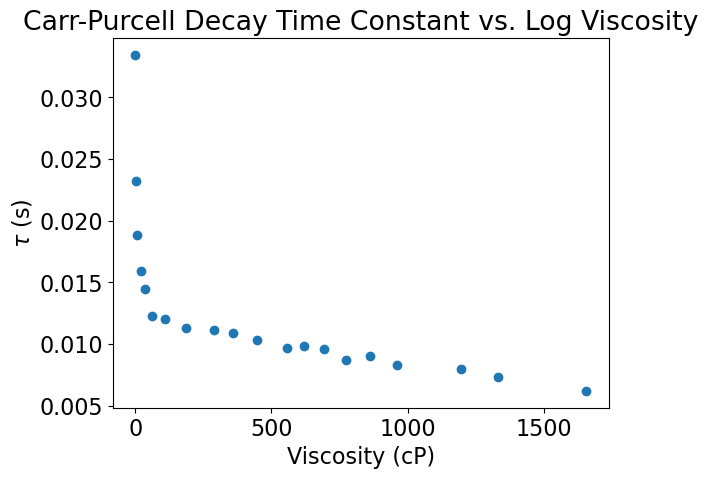

In [14]:
plt.scatter(np.array(viscs), np.array(means))
#plt.xscale('log')
#plt.yscale('log')
plt.title("Carr-Purcell Decay Time Constant vs. Log Viscosity")
plt.rcParams.update({'font.size': 16})
plt.ylabel(r"$\tau$ (s)")
plt.xlabel("Viscosity (cP)")
plt.show()

# Run 2

In [15]:
in_dir = r"CarrPurc_P1-19_P2-38_tau1"
cppars = cpParams(20, 0.001, 0.005, 0.01, -1)
cppars_range2 = cpParams(20, 0.003, 0.001, 0.01, -1)

cutoff = 66

means2 = []
concs2 = []
std_trials2 = []
std_fits2 = []

for folder in os.listdir(in_dir):
    dirpath = os.path.join(in_dir, folder)
    print(dirpath)
    print("Fitting:", choose_csvs(dirpath))
    
    conc = int(''.join([n for n in folder if n.isdigit()]))
    if conc < 10:
        continue
    pars = cppars_range2 if conc < cutoff else cppars
    
    mu, std_tri, std_fit, _ = extract_tau(dirpath, pars, plot=0, verbose=0)#, timestep=2e-5)
    means2.append(mu)
    concs2.append(conc)
    std_trials2.append(std_tri)
    std_fits2.append(std_fit)
    
viscs2 = np.array([conc_to_visc(22, C) for C in concs2])
concs2 = np.array(concs2)
means2 = np.array(means2)
std2 = np.sqrt(np.array(std_trials2) ** 2 + np.array(std_fits2) ** 2)


CarrPurc_P1-19_P2-38_tau1\Gly100
Fitting: ['CarrPurc_P1-19_P2-38_tau1\\Gly100\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly100\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly100\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly100\\NewFile4.csv']
CarrPurc_P1-19_P2-38_tau1\Gly65
Fitting: ['CarrPurc_P1-19_P2-38_tau1\\Gly65\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly65\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly65\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly65\\NewFile4.csv']
CarrPurc_P1-19_P2-38_tau1\Gly70
Fitting: ['CarrPurc_P1-19_P2-38_tau1\\Gly70\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly70\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly70\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly70\\NewFile4.csv']
CarrPurc_P1-19_P2-38_tau1\Gly75
Fitting: ['CarrPurc_P1-19_P2-38_tau1\\Gly75\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly75\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly75\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tau1\\Gly75\\NewFile4.csv']
CarrPurc_P1-19_P2-38_tau1\G

In [16]:
lmod = LinearModel()
lpars = lmod.guess(means2, concs2)
result = lmod.fit(means2, lpars, x=concs2, weights=1/std2)

[[Model]]
    Model(linear)
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 6
    # data points      = 16
    # variables        = 2
    chi-square         = 11.3550924
    reduced chi-square = 0.81107803
    Akaike info crit   = -1.48675848
    Bayesian info crit = 0.05841896
[[Variables]]
    slope:     -6.4228e-04 +/- 5.0791e-05 (7.91%) (init = -0.0006573037)
    intercept:  0.07438988 +/- 0.00475805 (6.40%) (init = 0.07603843)
[[Correlations]] (unreported correlations are < 0.100)
    C(slope, intercept) = -0.998


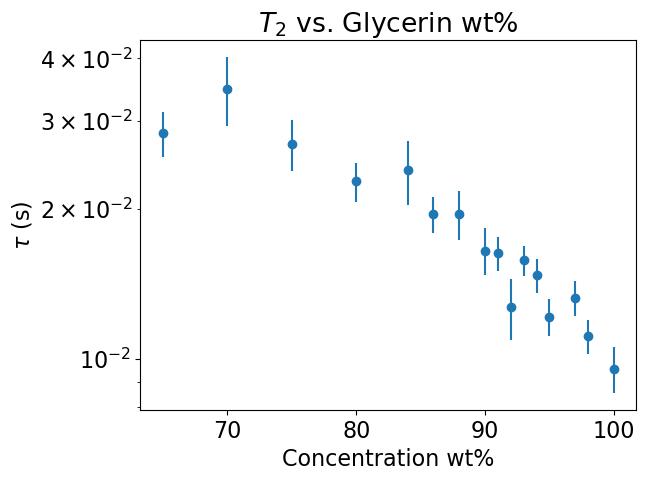

In [17]:
plt.yscale('log')
print(result.fit_report())
plt.errorbar(concs2, means2, yerr=std2, marker='o', linestyle='')
#plt.plot(concs, result.best_fit)
plt.title("$T_2$ vs. Glycerin wt%")
plt.rcParams.update({'font.size': 16})
plt.ylabel(r"$\tau$ (s)")
plt.xlabel("Concentration wt%")
plt.show()

# Run 3

In [18]:
in_dir = r"CarrPurc_P1-19_P2-38_tau1-Run2"
# peak_dist, peak_prom, peak_min, trim_thresh, trim_hyst
cppars = cpParams(25, 0.007, 0.005, 0.05, 1) # above cutoff
cppars_range2 = cpParams(25, 0.005, 0.0065, 0.05, 0) # below cutoff

cutoff = 66

means3 = []
concs3 = []
std_trials3 = []
std_fits3 = []

for folder in os.listdir(in_dir):
    dirpath = os.path.join(in_dir, folder)
    print("Fitting:", choose_csvs(dirpath))
    
    conc = int(''.join([n for n in folder if n.isdigit()]))
#     if conc < 80:
#         continue
    pars = cppars_range2 if conc < cutoff else cppars
    
    mu, std_tri, std_fit, _ = extract_tau(dirpath, pars, plot=0, verbose=0)
    means3.append(mu)
    concs3.append(conc)
    std_trials3.append(std_tri)
    std_fits3.append(std_fit)
    
viscs3 = np.array([conc_to_visc(22, C) for C in concs3])
concs3 = np.array(concs3)
means3 = np.array(means3)
std3 = np.sqrt(np.array(std_trials3) ** 2 + np.array(std_fits3) **2)

Fitting: ['CarrPurc_P1-19_P2-38_tau1-Run2\\Gly100\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly100\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly100\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly100\\NewFile4.csv']
Fitting: ['CarrPurc_P1-19_P2-38_tau1-Run2\\Gly20\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly20\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly20\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly20\\NewFile4.csv']
Fitting: ['CarrPurc_P1-19_P2-38_tau1-Run2\\Gly40\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly40\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly40\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly40\\NewFile4.csv']
Fitting: ['CarrPurc_P1-19_P2-38_tau1-Run2\\Gly50\\NewFile1.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly50\\NewFile2.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly50\\NewFile3.csv', 'CarrPurc_P1-19_P2-38_tau1-Run2\\Gly50\\NewFile4.csv']
Fitting: ['CarrPurc_P1-19_P2-38_tau1-Run2\\Gly60\\NewFile1.csv', 'CarrPurc_P

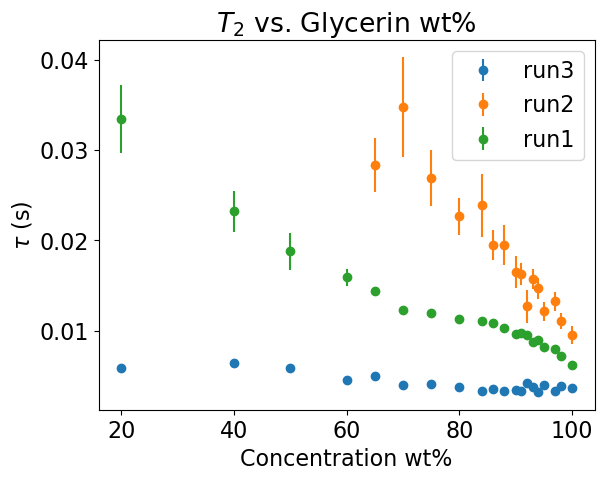

In [19]:
# plt.yscale('log')
plt.errorbar(concs3, means3, yerr=std3, marker='o', linestyle='', label='run3')
plt.errorbar(concs2, means2, yerr=std2, marker='o', linestyle='', label='run2')
plt.errorbar(concs, means, yerr=std, marker='o', linestyle='', label='run1')
#plt.plot(concs, result.best_fit)
plt.legend()
plt.title("$T_2$ vs. Glycerin wt%")
plt.rcParams.update({'font.size': 16})
plt.ylabel(r"$\tau$ (s)")
plt.xlabel("Concentration wt%")
plt.show()